<a href="https://colab.research.google.com/github/Keplerzhao/keplerzhao/blob/master/Sector_ETF_monitoring_System_2_Sept_2026.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Batch 1/2: 80 tickers
  success: 80 columns
Batch 2/2: 16 tickers
  success: 16 columns

Got 96 tickers
Raw date range: 2021-01-04 -> 2026-08-28

After history filter: 95 valid tickers
Dropped due to short history:
['KOL']
✓ Chart saved: heatmap_200dma_voladj_percentile_sector_W-FRI.png


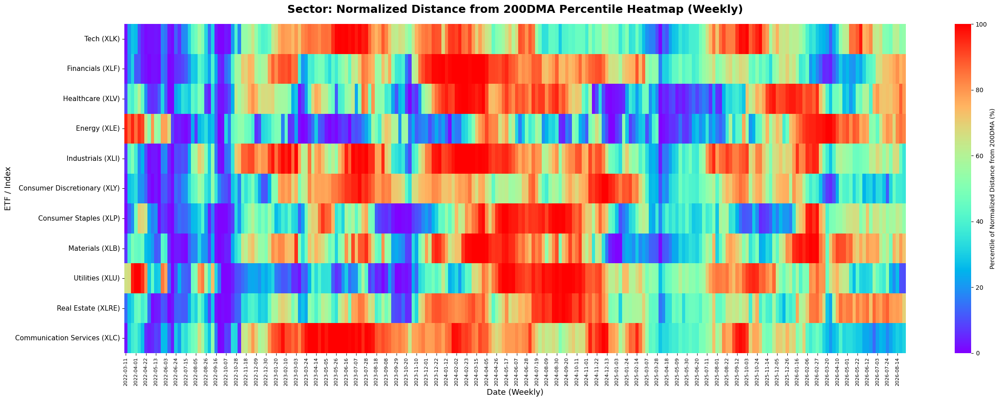

✓ Chart saved: heatmap_200dma_voladj_percentile_tech_ai_internet_W-FRI.png


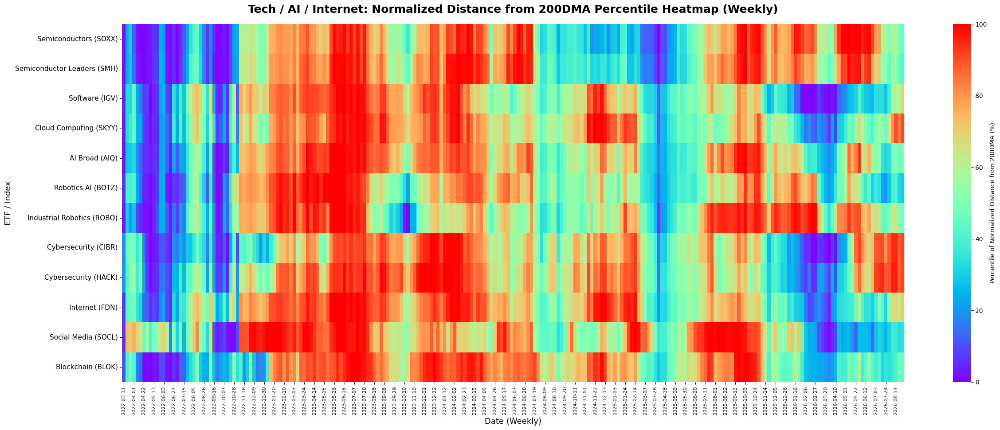

✓ Chart saved: heatmap_200dma_voladj_percentile_power_infra_data_center_W-FRI.png


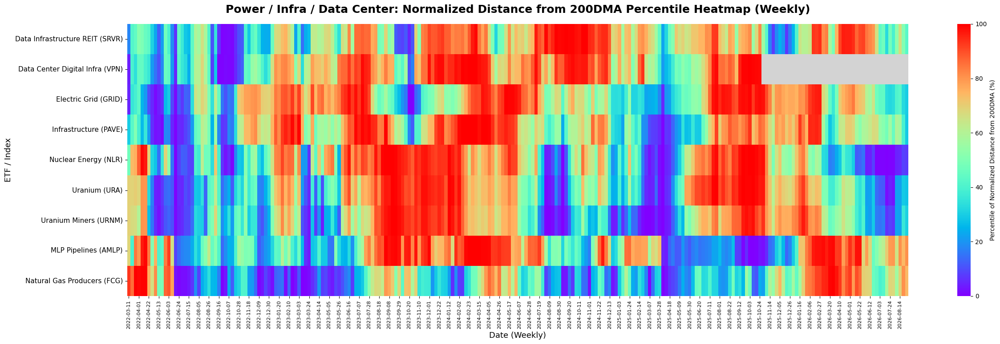

✓ Chart saved: heatmap_200dma_voladj_percentile_financials_credit_W-FRI.png


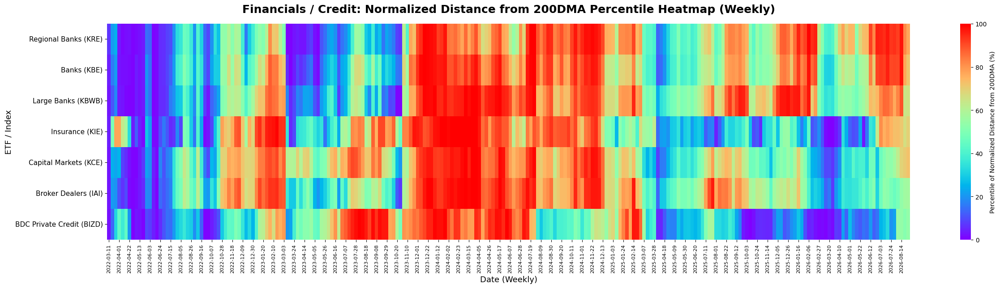

✓ Chart saved: heatmap_200dma_voladj_percentile_healthcare_W-FRI.png


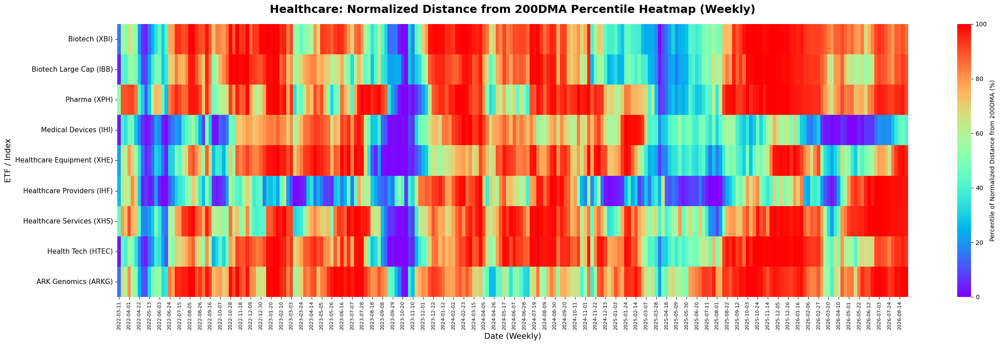

✓ Chart saved: heatmap_200dma_voladj_percentile_consumer_housing_travel_W-FRI.png


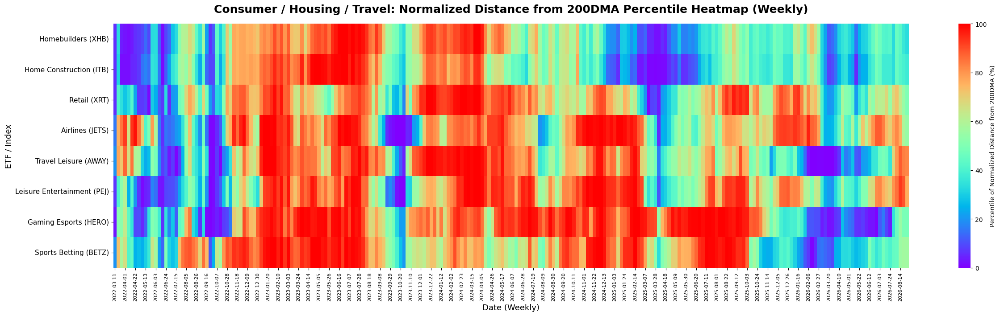

✓ Chart saved: heatmap_200dma_voladj_percentile_industrials_defense_transport_W-FRI.png


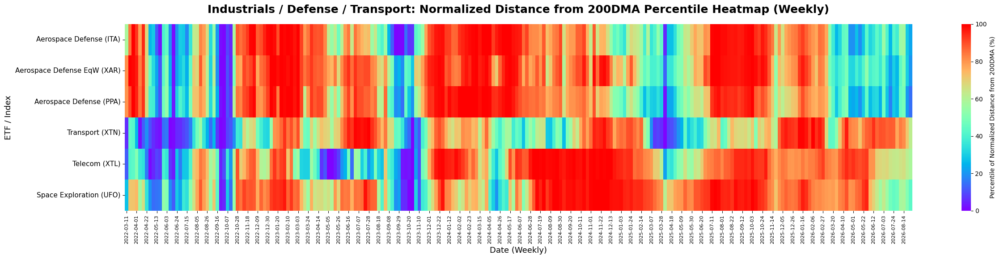

✓ Chart saved: heatmap_200dma_voladj_percentile_resources_commodities_W-FRI.png


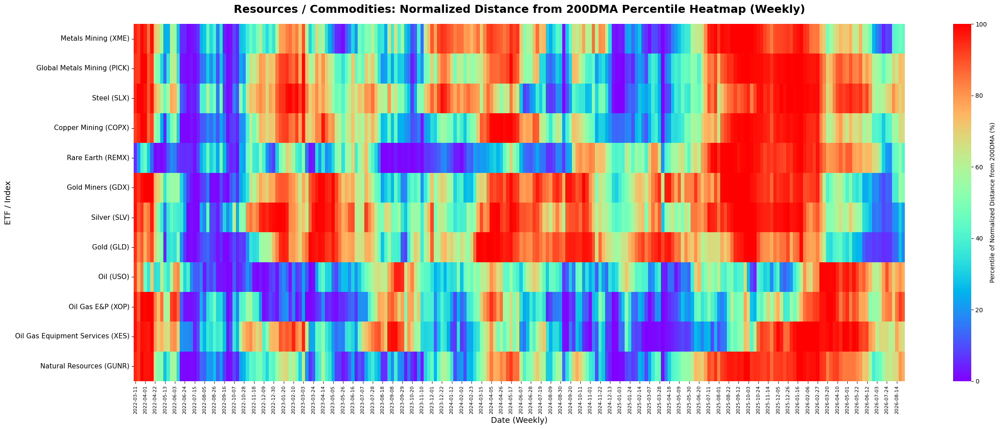

✓ Chart saved: heatmap_200dma_voladj_percentile_clean_energy_ev_battery_W-FRI.png


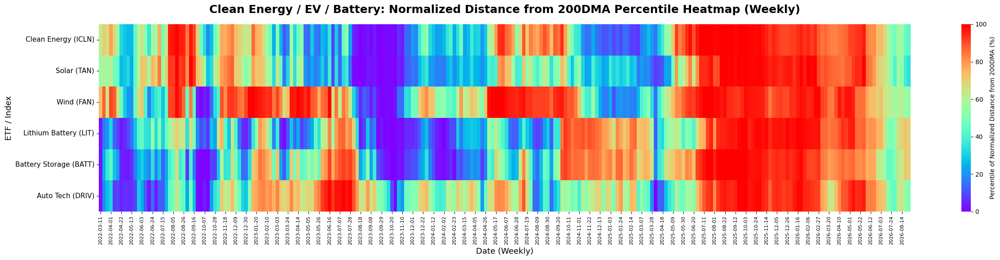

✓ Chart saved: heatmap_200dma_voladj_percentile_agriculture_water_W-FRI.png


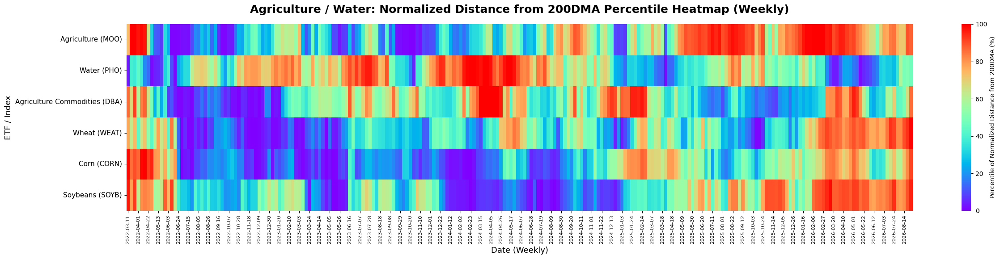

✓ Chart saved: heatmap_200dma_voladj_percentile_reits_W-FRI.png


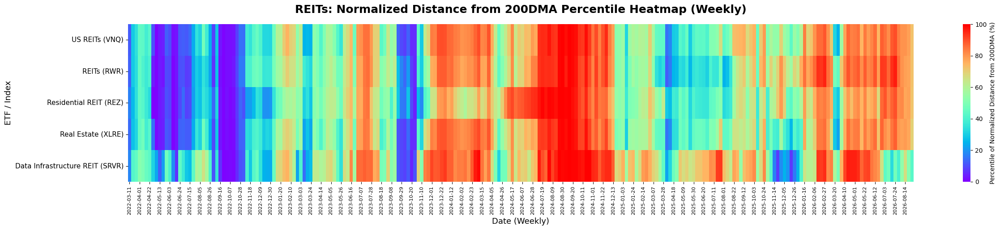

✓ Chart saved: heatmap_200dma_voladj_percentile_broad_market_macro_W-FRI.png


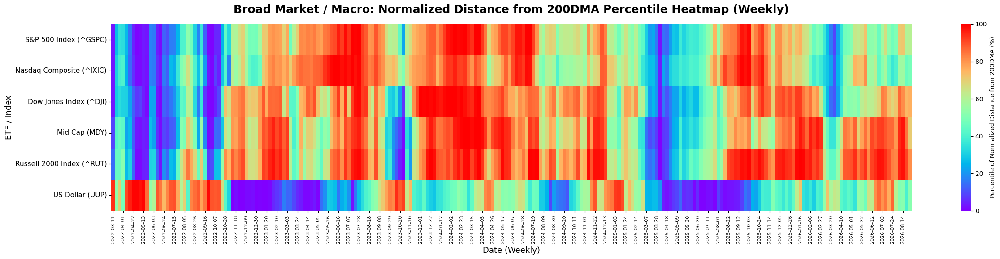


Latest date: 2026-08-28
Ticker                       Name                              Groups Distance from 200DMA % 63D Annualized Vol % Normalized Spread Historical Percentile %
  WEAT                      Wheat                 Agriculture / Water                 24.13%               26.21%              0.92                   99.6%
  ARKG               ARK Genomics                          Healthcare                 44.73%               49.59%              0.90                   99.3%
   IHF       Healthcare Providers                          Healthcare                 14.70%               17.69%              0.83                   97.0%
   XHS        Healthcare Services                          Healthcare                 17.50%               18.66%              0.94                   96.2%
  SOYB                   Soybeans                 Agriculture / Water                 12.91%               15.58%              0.83                   95.7%
   XHE       Healthcare Equipment      

In [1]:
#@title Sector Heat Map Monitoring System { display-mode: "form" }

import subprocess
subprocess.run(["pip", "install", "yfinance", "seaborn", "matplotlib", "-q"], check=False)
api_key = "490ed0ef6adef36a548539c3e6da425e"
import logging
import warnings
warnings.filterwarnings("ignore")
logging.getLogger("yfinance").setLevel(logging.CRITICAL)

import os
import re
import math
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns


# ==========================================================
# 0. Parameters
# ==========================================================

START_DATE = "2021-01-01"
END_DATE = None

MA_WINDOW = 200
VOL_WINDOW = 63
TRADING_DAYS = 252
MIN_PERCENTILE_OBS = 100

BATCH_SIZE = 80

# W-FRI = weekly
# ME    = month end; if your pandas version does not support ME, use M
RESAMPLE_FREQ = "W-FRI"

N_PERIODS = 600
SAVE_FIG = True
SAVE_CSV = True


# ==========================================================
# 1. ETF Groups / Index Code
# ==========================================================

ETF_GROUPS = {
    "Sector": {
        "XLK":  "Tech",
        "XLF":  "Financials",
        "XLV":  "Healthcare",
        "XLE":  "Energy",
        "XLI":  "Industrials",
        "XLY":  "Consumer Discretionary",
        "XLP":  "Consumer Staples",
        "XLB":  "Materials",
        "XLU":  "Utilities",
        "XLRE": "Real Estate",
        "XLC":  "Communication Services",
    },

    "Tech / AI / Internet": {
        "SOXX": "Semiconductors",
        "SMH":  "Semiconductor Leaders",
        "IGV":  "Software",
        "SKYY": "Cloud Computing",
        "AIQ":  "AI Broad",
        "BOTZ": "Robotics AI",
        "ROBO": "Industrial Robotics",
        "CIBR": "Cybersecurity",
        "HACK": "Cybersecurity",
        "FDN":  "Internet",
        "SOCL": "Social Media",
        "BLOK": "Blockchain",
    },

    "Power / Infra / Data Center": {
        "SRVR": "Data Infrastructure REIT",
        "VPN":  "Data Center Digital Infra",
        "GRID": "Electric Grid",
        "PAVE": "Infrastructure",
        "NLR":  "Nuclear Energy",
        "URA":  "Uranium",
        "URNM": "Uranium Miners",
        "AMLP": "MLP Pipelines",
        "FCG":  "Natural Gas Producers",
    },

    "Financials / Credit": {
        "KRE":  "Regional Banks",
        "KBE":  "Banks",
        "KBWB": "Large Banks",
        "KIE":  "Insurance",
        "KCE":  "Capital Markets",
        "IAI":  "Broker Dealers",
        "BIZD": "BDC Private Credit",
    },

    "Healthcare": {
        "XBI":  "Biotech",
        "IBB":  "Biotech Large Cap",
        "XPH":  "Pharma",
        "IHI":  "Medical Devices",
        "XHE":  "Healthcare Equipment",
        "IHF":  "Healthcare Providers",
        "XHS":  "Healthcare Services",
        "HTEC": "Health Tech",
        "ARKG": "ARK Genomics",
    },

    "Consumer / Housing / Travel": {
        "XHB":  "Homebuilders",
        "ITB":  "Home Construction",
        "XRT":  "Retail",
        "JETS": "Airlines",
        "AWAY": "Travel Leisure",
        "PEJ":  "Leisure Entertainment",
        "HERO": "Gaming Esports",
        "BETZ": "Sports Betting",
    },

    "Industrials / Defense / Transport": {
        "ITA":  "Aerospace Defense",
        "XAR":  "Aerospace Defense EqW",
        "PPA":  "Aerospace Defense",
        "XTN":  "Transport",
        "XTL":  "Telecom",
        "UFO":  "Space Exploration",
    },

    "Resources / Commodities": {
        "XME":  "Metals Mining",
        "PICK": "Global Metals Mining",
        "SLX":  "Steel",
        "COPX": "Copper Mining",
        "REMX": "Rare Earth",
        "GDX":  "Gold Miners",
        "SLV":  "Silver",
        "GLD":  "Gold",
        "USO":  "Oil",
        "XOP":  "Oil Gas E&P",
        "XES":  "Oil Gas Equipment Services",
        "GUNR": "Natural Resources",
        "KOL":  "Coal",
    },

    "Clean Energy / EV / Battery": {
        "ICLN": "Clean Energy",
        "TAN":  "Solar",
        "FAN":  "Wind",
        "LIT":  "Lithium Battery",
        "BATT": "Battery Storage",
        "DRIV": "Auto Tech",
    },

    "Agriculture / Water": {
        "MOO":  "Agriculture",
        "PHO":  "Water",
        "DBA":  "Agriculture Commodities",
        "WEAT": "Wheat",
        "CORN": "Corn",
        "SOYB": "Soybeans",
    },

    "REITs": {
        "VNQ":  "US REITs",
        "RWR":  "REITs",
        "REZ":  "Residential REIT",
        "XLRE": "Real Estate",
        "SRVR": "Data Infra REIT",
    },


    "Broad Market / Macro": {
        "^GSPC": "S&P 500 Index",
        "^IXIC": "Nasdaq Composite",
        "^DJI":  "Dow Jones Index",
        "MDY":   "Mid Cap",
        "^RUT":  "Russell 2000 Index",
        "UUP":   "US Dollar",


    },
}

BAD_TICKERS = {"BJK"}

for group_name in ETF_GROUPS:
    ETF_GROUPS[group_name] = {
        k: v for k, v in ETF_GROUPS[group_name].items()
        if k not in BAD_TICKERS
    }


# ==========================================================
# 2. Helper Functions
# ==========================================================

def flatten_groups(etf_groups):
    tickers = []
    for _, mp in etf_groups.items():
        tickers.extend(list(mp.keys()))
    return list(dict.fromkeys(tickers))


def build_ticker_name_map(etf_groups):
    ticker_name = {}
    for _, mp in etf_groups.items():
        for ticker, name in mp.items():
            if ticker not in ticker_name:
                ticker_name[ticker] = name
    return ticker_name


def chunk_list(lst, n):
    return [lst[i:i+n] for i in range(0, len(lst), n)]


def normalize_end_date(end_date):
    if end_date is None:
        return None
    return (pd.to_datetime(end_date) + pd.Timedelta(days=1)).strftime("%Y-%m-%d")


def extract_close(raw, tickers):
    if raw is None or raw.empty:
        return pd.DataFrame()

    if isinstance(raw.columns, pd.MultiIndex):
        if "Close" in raw.columns.get_level_values(0):
            px = raw["Close"].copy()
        elif "Close" in raw.columns.get_level_values(1):
            px = raw.xs("Close", axis=1, level=1).copy()
        else:
            return pd.DataFrame()
    else:
        if "Close" in raw.columns:
            px = raw[["Close"]].copy()
            if len(tickers) == 1:
                px.columns = [tickers[0]]
        else:
            px = raw.copy()

    if isinstance(px, pd.Series):
        px = px.to_frame()

    px.index = pd.to_datetime(px.index)
    px = px.sort_index()
    px = px.replace([np.inf, -np.inf], np.nan)
    px = px.dropna(axis=1, how="all")
    px.columns = [str(c) for c in px.columns]

    return px


def download_prices(etf_groups, start_date, end_date=None, batch_size=80):
    tickers = flatten_groups(etf_groups)
    yf_end = normalize_end_date(end_date)

    print(f"Downloading {len(tickers)} tickers...")
    all_prices = []
    failed = []

    batches = chunk_list(tickers, batch_size)

    for i, batch in enumerate(batches, start=1):
        print(f"Batch {i}/{len(batches)}: {len(batch)} tickers")

        try:
            raw = yf.download(
                batch,
                start=start_date,
                end=yf_end,
                progress=False,
                auto_adjust=True,
                actions=False,
                group_by="column",
                threads=True,
            )

            px = extract_close(raw, batch)

            batch_failed = [
                t for t in batch
                if t not in px.columns or px[t].dropna().empty
            ]

            if batch_failed:
                failed.extend(batch_failed)
                print("  failed:", batch_failed)

            if not px.empty:
                all_prices.append(px)
                print(f"  success: {px.shape[1]} columns")

        except Exception as e:
            print(f"  batch error: {e}")
            failed.extend(batch)

    if not all_prices:
        raise RuntimeError("No price data downloaded.")

    prices = pd.concat(all_prices, axis=1).sort_index()
    prices = prices.loc[:, ~prices.columns.duplicated()]

    ordered_cols = [t for t in tickers if t in prices.columns]
    prices = prices[ordered_cols]

    print()
    print(f"Got {prices.shape[1]} tickers")
    print(f"Raw date range: {prices.index[0].date()} -> {prices.index[-1].date()}")

    if failed:
        print()
        print("Raw failed / no data tickers:")
        print(sorted(set(failed)))

    return prices, sorted(set(failed))


def percentile_rank_last(arr):
    if len(arr) == 0 or np.isnan(arr[-1]):
        return np.nan

    valid = arr[~np.isnan(arr)]

    if len(valid) == 0:
        return np.nan

    return np.mean(valid <= arr[-1])


def safe_filename(text):
    text = text.lower()
    text = text.replace("&", "and")
    text = re.sub(r"[^a-z0-9]+", "_", text)
    text = re.sub(r"_+", "_", text)
    return text.strip("_")


# ==========================================================
# 3. Download Prices
# ==========================================================

TICKERS = flatten_groups(ETF_GROUPS)
TICKER_NAME = build_ticker_name_map(ETF_GROUPS)

TICKER_LABEL = {
    ticker: f"{TICKER_NAME[ticker]} ({ticker})"
    for ticker in TICKERS
}

prices, raw_failed = download_prices(
    etf_groups=ETF_GROUPS,
    start_date=START_DATE,
    end_date=END_DATE,
    batch_size=BATCH_SIZE,
)

# Keep only tickers with enough data
min_required_obs = MA_WINDOW + MIN_PERCENTILE_OBS
valid_cols = [
    c for c in prices.columns
    if prices[c].dropna().shape[0] >= min_required_obs
]

dropped_short_history = [c for c in prices.columns if c not in valid_cols]
prices = prices[valid_cols]

print()
print(f"After history filter: {len(valid_cols)} valid tickers")
if dropped_short_history:
    print("Dropped due to short history:")
    print(dropped_short_history)


# ==========================================================
# 4. Calculate Normalized Distance from 200DMA
# ==========================================================

ma200 = prices.rolling(MA_WINDOW, min_periods=MA_WINDOW).mean()

distance_from_ma = prices / ma200 - 1

daily_returns = prices.pct_change()

realized_vol = (
    daily_returns
    .rolling(VOL_WINDOW, min_periods=VOL_WINDOW)
    .std()
    * np.sqrt(TRADING_DAYS)
)

realized_vol = realized_vol.replace(0, np.nan)

normalized_spread = distance_from_ma / realized_vol


# ==========================================================
# 5. Historical Percentile of Normalized Spread
# ==========================================================

spread_percentile = normalized_spread.apply(
    lambda col: col.expanding(min_periods=MIN_PERCENTILE_OBS).apply(
        percentile_rank_last,
        raw=True,
    )
) * 100


# Rename columns for chart display
spread_percentile = spread_percentile.rename(columns=TICKER_LABEL)
normalized_spread = normalized_spread.rename(columns=TICKER_LABEL)
distance_from_ma = distance_from_ma.rename(columns=TICKER_LABEL)
realized_vol = realized_vol.rename(columns=TICKER_LABEL)


# ==========================================================
# 6. Weekly / Monthly Resampling
# ==========================================================

res_pctile = spread_percentile.resample(RESAMPLE_FREQ).last()
res_spread = normalized_spread.resample(RESAMPLE_FREQ).last()
res_distance = distance_from_ma.resample(RESAMPLE_FREQ).last()
res_vol = realized_vol.resample(RESAMPLE_FREQ).last()

res_pctile = res_pctile.dropna(how="all", axis=0)
res_pctile = res_pctile.dropna(how="all", axis=1)

if res_pctile.empty:
    raise RuntimeError(
        "Percentile data is empty. Try an earlier START_DATE or lower MIN_PERCENTILE_OBS."
    )

res_pctile = res_pctile.tail(N_PERIODS)

res_spread = res_spread.reindex(index=res_pctile.index, columns=res_pctile.columns)
res_distance = res_distance.reindex(index=res_pctile.index, columns=res_pctile.columns)
res_vol = res_vol.reindex(index=res_pctile.index, columns=res_pctile.columns)

latest_date = res_pctile.index[-1]


# ==========================================================
# 7. Format Dates for Plot
# ==========================================================

res_plot = res_pctile.copy()

if RESAMPLE_FREQ.upper().startswith("W"):
    res_plot.index = res_plot.index.strftime("%Y-%m-%d")
    title_freq = "Weekly"
else:
    res_plot.index = res_plot.index.strftime("%Y-%m")
    title_freq = "Monthly"


# ==========================================================
# 8. Heatmaps by Group
# ==========================================================

cmap = plt.get_cmap("rainbow").copy()
cmap.set_bad(color="lightgrey")

saved_chart_files = []
dropped_by_group = {}

for group_name, mapping in ETF_GROUPS.items():

    group_labels = []
    dropped = []

    for ticker, name in mapping.items():
        label = TICKER_LABEL.get(ticker)

        if label is not None and label in res_plot.columns:
            group_labels.append(label)
        else:
            dropped.append(ticker)

    dropped_by_group[group_name] = dropped

    if len(group_labels) == 0:
        continue

    group_data = res_plot[group_labels]

    fig_height = max(4, 0.65 * len(group_labels) + 2)

    plt.figure(figsize=(25, fig_height))

    ax = sns.heatmap(
        group_data.T,
        cmap=cmap,
        vmin=0,
        vmax=100,
        center=50,
        linewidths=0,
        linecolor=None,
        cbar_kws={"label": "Percentile of Normalized Distance from 200DMA (%)"},
    )

    plt.title(
        f"{group_name}: Normalized Distance from 200DMA Percentile Heatmap ({title_freq})",
        fontsize=18,
        fontweight="bold",
        pad=18,
    )

    plt.xlabel(f"Date ({title_freq})", fontsize=13)
    plt.ylabel("ETF / Index", fontsize=13)

    plt.xticks(rotation=90, ha="center", fontsize=8)
    plt.yticks(rotation=0, fontsize=11)

    plt.tight_layout()

    filename = (
        f"heatmap_200dma_voladj_percentile_"
        f"{safe_filename(group_name)}_{RESAMPLE_FREQ}.png"
    )

    if SAVE_FIG:
        plt.savefig(filename, dpi=300, bbox_inches="tight")
        saved_chart_files.append(filename)
        print(f"✓ Chart saved: {filename}")

    plt.show()


# ==========================================================
# 9. Latest Ranking Table
# ==========================================================

latest_percentile = (
    res_pctile
    .loc[latest_date]
    .dropna()
    .sort_values(ascending=False)
)

table = pd.DataFrame({
    "ETF / Index": latest_percentile.index,
    "Historical Percentile %": latest_percentile.values,
})

table["Ticker"] = table["ETF / Index"].str.extract(r"\((.*?)\)")
table["Name"] = table["ETF / Index"].str.replace(r"\s*\(.*?\)", "", regex=True)

table["Distance from 200DMA %"] = (
    res_distance.loc[latest_date]
    .reindex(table["ETF / Index"])
    .values
    * 100
)

table[f"{VOL_WINDOW}D Annualized Vol %"] = (
    res_vol.loc[latest_date]
    .reindex(table["ETF / Index"])
    .values
    * 100
)

table["Normalized Spread"] = (
    res_spread.loc[latest_date]
    .reindex(table["ETF / Index"])
    .values
)

# Add group information
ticker_to_groups = {}
for group_name, mapping in ETF_GROUPS.items():
    for ticker in mapping:
        ticker_to_groups.setdefault(ticker, []).append(group_name)

table["Groups"] = table["Ticker"].map(
    lambda x: " / ".join(ticker_to_groups.get(x, []))
)

table = table[
    [
        "Ticker",
        "Name",
        "Groups",
        "ETF / Index",
        "Distance from 200DMA %",
        f"{VOL_WINDOW}D Annualized Vol %",
        "Normalized Spread",
        "Historical Percentile %",
    ]
].reset_index(drop=True)

print()
print(f"Latest date: {latest_date.strftime('%Y-%m-%d')}")

display_table = table.copy()
display_table["Distance from 200DMA %"] = display_table["Distance from 200DMA %"].map(lambda x: f"{x:,.2f}%")
display_table[f"{VOL_WINDOW}D Annualized Vol %"] = display_table[f"{VOL_WINDOW}D Annualized Vol %"].map(lambda x: f"{x:,.2f}%")
display_table["Normalized Spread"] = display_table["Normalized Spread"].map(lambda x: f"{x:,.2f}")
display_table["Historical Percentile %"] = display_table["Historical Percentile %"].map(lambda x: f"{x:,.1f}%")

print(
    display_table[
        [
            "Ticker",
            "Name",
            "Groups",
            "Distance from 200DMA %",
            f"{VOL_WINDOW}D Annualized Vol %",
            "Normalized Spread",
            "Historical Percentile %",
        ]
    ].to_string(index=False)
)


# ==========================================================
# 10. Export Ranking Table
# ==========================================================

table_filename = f"ranking_200dma_voladj_percentile_{RESAMPLE_FREQ}.csv"

if SAVE_CSV:
    table.to_csv(table_filename, index=False, encoding="utf-8-sig")
    print(f"✓ Ranking table saved: {table_filename}")


# ==========================================================
# 11. Diagnostics
# ==========================================================

print()
print("Saved chart files:")
for f in saved_chart_files:
    print(f"- {f}")

print()
print("Dropped tickers by group:")
for group_name, dropped in dropped_by_group.items():
    if dropped:
        print(f"{group_name}: {dropped}")

In [24]:
import os, requests, numpy as np, pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import timedelta

FMP_KEY  =      "490ed0ef6adef36a548539c3e6da425e"
FRED_KEY = 'd498e9f9c4290c5d68f43a84a05a0cd7'     # or "xxx"


In [29]:
import os, requests, numpy as np, pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

END_TS=pd.Timestamp.today().normalize(); END=END_TS.strftime("%Y-%m-%d")
START=(END_TS-pd.DateOffset(years=20)).strftime("%Y-%m-%d")
START1=(END_TS-pd.DateOffset(years=20)).strftime("%Y-%m-%d")

CPI_SPLIT=2.0
OAS_SPLIT=5.0
OAS_SEVERE=8.0

VOL_WINDOW=20
VOL_LOW=.08; VOL_HIGH=.45
VIS_SCOPE=141; VIS_THRESHOLD=32

NAVY="#17324D"; STEEL="#55738B"; SLATE="#8A98A4"; GRID="#E4E9ED"
GREEN="rgba(65,111,96,.10)"; GOLD="rgba(171,134,69,.10)"
BURG="rgba(128,52,64,.10)"; BLUEBG="rgba(70,96,123,.10)"

# ======================== DATA ========================
def fmp_price(sym):
    u="https://financialmodelingprep.com/stable/historical-price-eod/full"
    p={"symbol":sym,"from":START1,"to":END,"apikey":FMP_KEY}
    r=requests.get(u,params=p,timeout=30); r.raise_for_status(); x=r.json()
    if not isinstance(x,list) or not x: raise RuntimeError(f"FMP {sym}: {x}")
    d=pd.DataFrame(x); d["date"]=pd.to_datetime(d["date"])
    return d.sort_values("date").set_index("date")["close"].astype(float)

def fred(sid,units="lin"):
    u="https://api.stlouisfed.org/fred/series/observations"
    p={"series_id":sid,"api_key":FRED_KEY,"file_type":"json","units":units,
       "observation_start":START,"observation_end":END}
    r=requests.get(u,params=p,timeout=30); r.raise_for_status(); x=r.json()
    if "observations" not in x: raise RuntimeError(f"FRED {sid}: {x}")
    d=pd.DataFrame(x["observations"]); d["date"]=pd.to_datetime(d["date"])
    d["value"]=pd.to_numeric(d["value"],errors="coerce")
    return d.set_index("date")["value"].dropna().sort_index()

def yan_visibility(close,scope=141):
    s=close.dropna(); y=np.log(s.values); n=len(y)
    peak=np.full(n,np.nan); trough=np.full(n,np.nan)
    for i in range(scope,n):
        mn,mx,dp,dt=np.inf,-np.inf,0,0
        for j in range(i-1,i-scope-1,-1):
            sl=(y[i]-y[j])/(i-j)
            if sl<mn-1e-12 and y[i]>y[j]: dp+=1
            if sl>mx+1e-12 and y[i]<y[j]: dt+=1
            mn,mx=min(mn,sl),max(mx,sl)
        peak[i],trough[i]=dp,dt
    return pd.DataFrame({"Peak":peak,"Trough":trough},index=s.index)

def vol_color(vol):
    z=np.clip((vol-VOL_LOW)/(VOL_HIGH-VOL_LOW),0,1)
    if z<=.5: a,b,t=(48,91,126),(238,232,211),z*2
    else: a,b,t=(238,232,211),(118,33,47),(z-.5)*2
    rgb=[int(a[i]+(b[i]-a[i])*t) for i in range(3)]
    return f"rgba({rgb[0]},{rgb[1]},{rgb[2]},{.12+.46*z:.3f})"

# ======================== DOWNLOAD ========================
print(f"Downloading {START} → {END} ...")

sp=fmp_price("^GSPC")
gdp=fred("A191RO1Q156NBEA")
cpi=fred("CPIAUCNS","pc1")
curve=fred("T10Y3M")
oas=fred("BAMLH0A0HYM2")

print("✓ Download complete")
print(f"HY OAS available: {oas.index.min().date()} → {oas.index.max().date()}")

# ======================== MACRO ========================
gdp_q=gdp.groupby(gdp.index.to_period("Q")).last()
cpi_q=cpi.groupby(cpi.index.to_period("Q")).last()
macro=pd.concat([gdp_q.rename("GDP"),cpi_q.rename("CPI")],axis=1).dropna()
macro.index=macro.index.to_timestamp("Q")

def macro_regime(r):
    if r.GDP>=0 and r.CPI<CPI_SPLIT: return "Early Expansion"
    if r.GDP>=0 and r.CPI>=CPI_SPLIT: return "Late Expansion"
    if r.GDP<0 and r.CPI>=CPI_SPLIT: return "Stagflation"
    return "Contraction"

macro["Regime"]=macro.apply(macro_regime,axis=1)

# ======================== LIQUIDITY — PAST 3 YEARS ========================
liq=pd.concat([curve.rename("Curve"),oas.rename("OAS")],axis=1).sort_index().ffill().dropna()
liq=liq.loc[liq.index>=liq.index.max()-pd.DateOffset(years=3)].copy()

liq["Regime"]=np.select(
    [(liq.Curve>=0)&(liq.OAS<OAS_SPLIT),
     (liq.Curve<0)&(liq.OAS<OAS_SPLIT),
     (liq.Curve<0)&(liq.OAS>=OAS_SPLIT)],
    ["Easy / Expansion","Late Cycle / Inversion","Credit Stress"],
    default="Re-steepening / Credit Stress"
)

lq=liq.resample("ME").last().dropna()

# ======================== MARKET ========================
ret=sp.pct_change(fill_method=None)
vol=ret.rolling(VOL_WINDOW).std()*np.sqrt(252)
vis=yan_visibility(sp,VIS_SCOPE)

market=pd.concat([sp.rename("SP500"),vol.rename("Vol"),vis],axis=1)
market["PeakM"]=market.SP500.where(market.Peak>VIS_THRESHOLD)
market["TroughM"]=market.SP500.where(market.Trough>VIS_THRESHOLD)
vol_bg=market.Vol.resample("W-FRI").last().dropna()

# ======================== RANGES ========================
mx1=min(macro.GDP.min()-.5,-10); mx2=max(macro.GDP.max()+.5,5)
my1=min(macro.CPI.min()-.4,0); my2=max(macro.CPI.max()+.5,CPI_SPLIT+1)

lx1=min(lq.Curve.min()-.2,-1); lx2=max(lq.Curve.max()+.2,1)
ly1=max(0,lq.OAS.min()-.20)
ly2=max(8.5,lq.OAS.max()+.30)

# ======================== FIGURE ========================
fig=make_subplots(
    rows=2,cols=2,
    specs=[[{},{}],[{"colspan":2},None]],
    row_heights=[.47,.53],
    vertical_spacing=.13,
    horizontal_spacing=.09,
    subplot_titles=(
        "A. US Investment Clock — Past 20 Years",
        "B. US Term Premium × High-Yield Credit Spread — Past 3 Years",
        "C. S&P 500 Market Conditions — Past 20 Years"
    )
)

# ======================== MACRO ========================
for a,b,c,d,col in [(0,mx2,my1,CPI_SPLIT,GREEN),(0,mx2,CPI_SPLIT,my2,GOLD),
                    (mx1,0,CPI_SPLIT,my2,BURG),(mx1,0,my1,CPI_SPLIT,BLUEBG)]:
    fig.add_shape(type="rect",x0=a,x1=b,y0=c,y1=d,fillcolor=col,line_width=0,layer="below",row=1,col=1)

fig.add_vline(x=0,line_color="#66747E",line_width=1.1,row=1,col=1)
fig.add_hline(y=CPI_SPLIT,line_color="#66747E",line_width=1.1,row=1,col=1)

mdates=[f"{d.year} Q{d.quarter}" for d in macro.index]
fig.add_trace(go.Scatter(
    x=macro.GDP,y=macro.CPI,text=mdates,mode="lines+markers",showlegend=False,
    line=dict(color=SLATE,width=1.15),marker=dict(size=4.5,color=SLATE),
    hovertemplate="<b>%{text}</b><br>Real GDP YoY: %{x:.2f}%<br>Headline CPI YoY: %{y:.2f}%<extra></extra>"
),1,1)

r=macro.tail(4)
fig.add_trace(go.Scatter(
    x=r.GDP,y=r.CPI,text=[f"{d.year} Q{d.quarter}" for d in r.index],
    mode="markers+text",textposition="top center",showlegend=False,
    marker=dict(size=7.5,color=STEEL),textfont=dict(size=8.5,color=NAVY)
),1,1)

cur=macro.iloc[-1]
fig.add_trace(go.Scatter(
    x=[cur.GDP],y=[cur.CPI],text=[mdates[-1]],mode="markers",showlegend=False,
    marker=dict(size=15,color=NAVY,line=dict(width=2.5,color="white"))
),1,1)

for x,y,t in [
    (mx2*.64,my1+(CPI_SPLIT-my1)*.25,"<b>EARLY EXPANSION</b>"),
    (mx2*.64,CPI_SPLIT+(my2-CPI_SPLIT)*.76,"<b>LATE EXPANSION</b>"),
    (mx1*.55,CPI_SPLIT+(my2-CPI_SPLIT)*.76,"<b>STAGFLATION</b>"),
    (mx1*.55,my1+(CPI_SPLIT-my1)*.25,"<b>CONTRACTION</b>")
]:
    fig.add_annotation(x=x,y=y,text=t,showarrow=False,font=dict(size=9.5,color=NAVY),row=1,col=1)

# ======================== LIQUIDITY ========================
for a,b,c,d,col in [(0,lx2,ly1,OAS_SPLIT,GREEN),(lx1,0,ly1,OAS_SPLIT,GOLD),
                    (lx1,0,OAS_SPLIT,ly2,BURG),(0,lx2,OAS_SPLIT,ly2,BLUEBG)]:
    fig.add_shape(type="rect",x0=a,x1=b,y0=c,y1=d,fillcolor=col,line_width=0,layer="below",row=1,col=2)

fig.add_vline(x=0,line_color="#66747E",line_width=1.1,row=1,col=2)
fig.add_hline(y=OAS_SPLIT,line_color="#66747E",line_width=1.2,row=1,col=2)
fig.add_hline(y=OAS_SEVERE,line_color="#823A47",line_width=1.1,line_dash="dash",row=1,col=2)

fig.add_annotation(
    x=lx2*.94,y=OAS_SEVERE+.10,text="<b>8% SEVERE STRESS</b>",
    showarrow=False,xanchor="right",font=dict(size=8.5,color="#823A47"),row=1,col=2
)

ldates=[d.strftime("%b %Y") for d in lq.index]
fig.add_trace(go.Scatter(
    x=lq.Curve,y=lq.OAS,text=ldates,mode="lines+markers",showlegend=False,
    line=dict(color=SLATE,width=1.15),marker=dict(size=4.5,color=SLATE),
    hovertemplate="<b>%{text}</b><br>10Y−3M: %{x:.2f}%<br>ICE BofA HY OAS: %{y:.2f}%<extra></extra>"
),1,2)

r=lq.tail(6)
fig.add_trace(go.Scatter(
    x=r.Curve,y=r.OAS,text=[d.strftime("%b %Y") for d in r.index],
    mode="markers+text",textposition="top center",showlegend=False,
    marker=dict(size=7.5,color=STEEL),textfont=dict(size=8.5,color=NAVY)
),1,2)

cur2=lq.iloc[-1]
fig.add_trace(go.Scatter(
    x=[cur2.Curve],y=[cur2.OAS],text=[ldates[-1]],mode="markers",showlegend=False,
    marker=dict(size=15,color=NAVY,line=dict(width=2.5,color="white"))
),1,2)

for x,y,t in [
    (lx2*.60,ly1+(OAS_SPLIT-ly1)*.38,"<b>EASY / EXPANSION</b>"),
    (lx1*.60,ly1+(OAS_SPLIT-ly1)*.38,"<b>LATE CYCLE / INVERSION</b>"),
    (lx1*.60,6.3,"<b>CREDIT STRESS</b>"),
    (lx2*.60,6.3,"<b>RE-STEEPENING / STRESS</b>")
]:
    fig.add_annotation(x=x,y=y,text=t,showarrow=False,font=dict(size=9,color=NAVY),row=1,col=2)

# ======================== MARKET ========================
fig.add_trace(go.Scatter(
    x=market.index,y=market.SP500,customdata=market[["Vol"]],
    mode="lines",name="S&P 500",line=dict(color="#18232E",width=1.6),
    hovertemplate="<b>%{x|%d %b %Y}</b><br>S&P 500: %{y:,.0f}"
                  f"<br>{VOL_WINDOW}D realised vol: %{{customdata[0]:.1%}}<extra></extra>"
),2,1)

p=market.dropna(subset=["PeakM"]); t=market.dropna(subset=["TroughM"])

fig.add_trace(go.Scatter(
    x=p.index,y=p.PeakM,customdata=p[["Peak"]],mode="markers",name="Yan Peak",
    marker=dict(symbol="triangle-down",size=6.5,color="#355F7C")
),2,1)

fig.add_trace(go.Scatter(
    x=t.index,y=t.TroughM,customdata=t[["Trough"]],mode="markers",name="Yan Trough",
    marker=dict(symbol="triangle-up",size=6.5,color="#843947")
),2,1)

# ======================== VOL BACKGROUND ========================
bg_dates=list(vol_bg.index)
market_start=market.SP500.dropna().index.min()
market_end=market.SP500.dropna().index.max()+pd.Timedelta(days=1)

vol_shapes=[]
for i,(d,v) in enumerate(vol_bg.items()):
    x0=max(d-pd.Timedelta(days=6),market_start)
    x1=(bg_dates[i+1]-pd.Timedelta(days=6)) if i<len(bg_dates)-1 else market_end
    vol_shapes.append(dict(
        type="rect",xref="x3",yref="y3 domain",
        x0=x0,x1=x1,y0=0,y1=1,
        fillcolor=vol_color(v),line=dict(width=0),layer="below"
    ))

fig.update_layout(shapes=list(fig.layout.shapes)+vol_shapes)

# ======================== AXES ========================
fig.update_xaxes(
    title_text="Real GDP growth, YoY (%)  ← negative | positive →",
    range=[mx1,mx2],gridcolor=GRID,title_font=dict(size=10),
    tickfont=dict(size=8),row=1,col=1
)
fig.update_yaxes(
    title_text=f"Headline CPI YoY (%)  ← below | above {CPI_SPLIT:.1f}% →",
    range=[my1,my2],gridcolor=GRID,title_font=dict(size=10),
    tickfont=dict(size=8),row=1,col=1
)

fig.update_xaxes(
    title_text="10Y−3M Treasury spread (%)  ← inverted | positive →",
    range=[lx1,lx2],gridcolor=GRID,title_font=dict(size=10.5),
    tickfont=dict(size=9),row=1,col=2
)
fig.update_yaxes(
    title_text="ICE BofA US High Yield OAS (%)  ← normal | stress →",
    range=[ly1,ly2],tickvals=[2.5,3,3.5,4,4.5,5,6,7,8],
    gridcolor=GRID,title_font=dict(size=10),
    tickfont=dict(size=8),row=1,col=2
)

fig.update_xaxes(
    title_text="Date",
    range=[market_start,market.SP500.dropna().index.max()],
    title_font=dict(size=10.5),tickfont=dict(size=9),
    showgrid=False,row=2,col=1
)
fig.update_yaxes(
    title_text="S&P 500",
    title_font=dict(size=10),tickfont=dict(size=8),
    gridcolor=GRID,row=2,col=1
)

# ======================== STYLE ========================
fig.update_layout(
    title=dict(
        text="<b>US Multi-Asset Regime Dashboard</b><br>"
             "<span style='font-size:10px;color:#687681'>"
             f"Macro & market: 20 years · HY credit: past 3 years · "
             f"{VOL_WINDOW}-day realised volatility</span>",
        x=.02,font=dict(size=17)
    ),
    template="plotly_white",
    width=1100,
    height=700,
    paper_bgcolor="#FAFBFC",
    plot_bgcolor="#FFFFFF",
    font=dict(family="Arial",size=10.5,color="#253544"),
    legend=dict(orientation="h",x=.02,y=.47,font=dict(size=9)),
    margin=dict(l=80,r=35,t=90,b=50)
)

fig.show()

# ======================== CURRENT ========================
lm=macro.iloc[-1]; ll=liq.iloc[-1]; lk=market.dropna(subset=["SP500","Vol"]).iloc[-1]

print(f"""
MACRO
{lm.Regime} | GDP YoY {lm.GDP:.2f}% | CPI YoY {lm.CPI:.2f}%

LIQUIDITY — PAST 3Y
{ll.Regime} | 10Y−3M {ll.Curve:.2f}% | HY OAS {ll.OAS:.2f}%
Credit stress = {OAS_SPLIT:.1f}% | Severe stress = {OAS_SEVERE:.1f}%

MARKET
S&P 500 {lk.SP500:,.0f} | {VOL_WINDOW}D realised vol {lk.Vol:.1%}
Peak Alarm {lk.Peak:.0f} | Trough Alarm {lk.Trough:.0f}
""")

✓ Download complete
HY OAS available: 2023-09-04 → 2026-08-31



MACRO
Late Expansion | GDP YoY 2.10% | CPI YoY 3.53%

LIQUIDITY — PAST 3Y
Easy / Expansion | 10Y−3M 0.87% | HY OAS 2.63%
Credit stress = 5.0% | Severe stress = 8.0%

MARKET
S&P 500 7,631 | 20D realised vol 7.4%
Peak Alarm 0 | Trough Alarm 7



✓ Complete


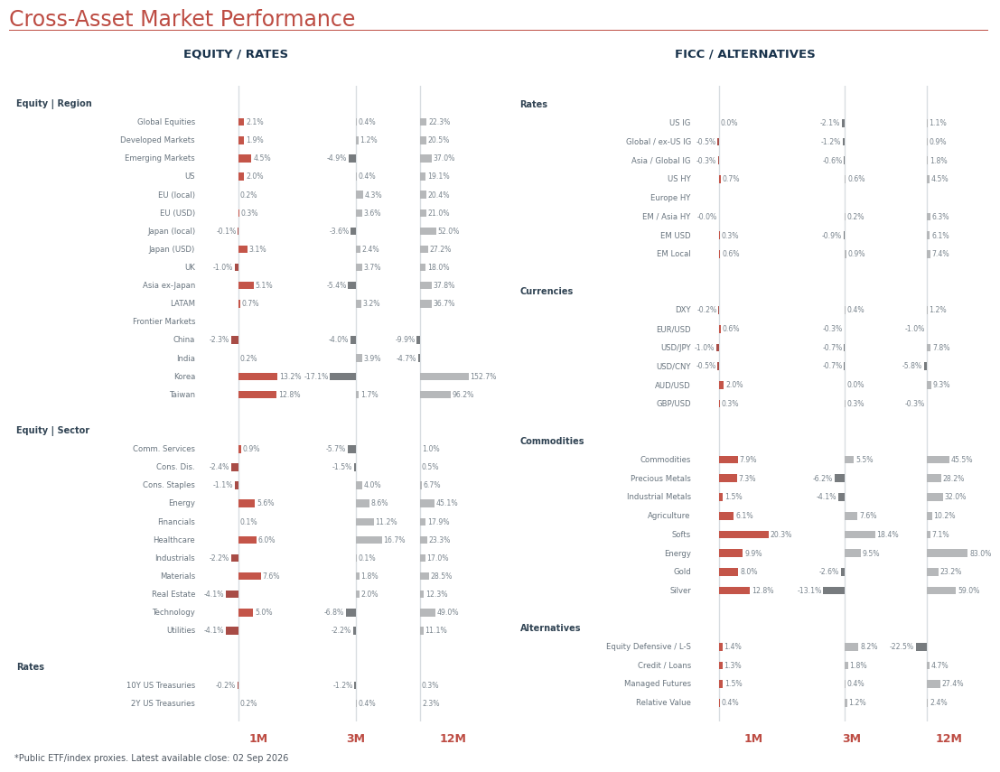


CURRENT REGIME

Macro
Late Expansion
GDP YoY : 2.10%
CPI YoY : 3.53%

Credit
10Y−3M : 0.87%
HY OAS : 2.63%

Diversification
60D SPY−IEF : +0.36

Market
S&P 500 : 7,640
200DMA  : 7,131



In [35]:
import os, requests, tempfile, logging, warnings
import numpy as np, pandas as pd, yfinance as yf
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import plotly.graph_objects as go
from plotly.subplots import make_subplots

warnings.filterwarnings("ignore")
logging.getLogger("yfinance").setLevel(logging.CRITICAL)
if hasattr(yf,"set_tz_cache_location"):
    yf.set_tz_cache_location(tempfile.mkdtemp(prefix="yf_cache_"))

TODAY=pd.Timestamp.today().normalize(); END=TODAY.strftime("%Y-%m-%d")
START20=(TODAY-pd.DateOffset(years=20)).strftime("%Y-%m-%d")
START10=(TODAY-pd.DateOffset(years=10)).strftime("%Y-%m-%d")

CPI_SPLIT=2.0; OAS_SPLIT=5.0; OAS_SEVERE=8.0
VOL_WINDOW=20; CORR_WINDOW=60; VIS_SCOPE=141; VIS_THRESHOLD=32
VOL_LOW=.08; VOL_HIGH=.45

NAVY="#18324B"; STEEL="#607A91"; SLATE="#95A1AB"; GRID="#E4E9ED"
RED="#A54249"; GREEN="rgba(68,110,94,.08)"; GOLD="rgba(172,137,73,.08)"
BURG="rgba(130,54,66,.08)"; BLUEBG="rgba(73,100,126,.08)"

# ============================================================
# FUNCTIONS
# ============================================================

def fmp(sym,start=START20):
    u="https://financialmodelingprep.com/stable/historical-price-eod/full"
    x=requests.get(u,params={"symbol":sym,"from":start,"to":END,"apikey":FMP_KEY},timeout=30).json()
    if not isinstance(x,list) or not x:return pd.Series(dtype=float,name=sym)
    d=pd.DataFrame(x); d["date"]=pd.to_datetime(d["date"])
    return pd.Series(pd.to_numeric(d["close"],errors="coerce").values,index=d.date,name=sym).dropna().sort_index()

def fred(sid,units="lin"):
    u="https://api.stlouisfed.org/fred/series/observations"
    p={"series_id":sid,"api_key":FRED_KEY,"file_type":"json","units":units,
       "observation_start":START20,"observation_end":END}
    x=requests.get(u,params=p,timeout=30).json()
    if "observations" not in x:raise RuntimeError(f"FRED {sid}: {x}")
    d=pd.DataFrame(x["observations"]); d["date"]=pd.to_datetime(d.date)
    d["value"]=pd.to_numeric(d.value,errors="coerce")
    return d.set_index("date").value.dropna().sort_index()

def yan(s,scope=141):
    s=s.dropna(); y=np.log(s.values); n=len(y)
    pk=np.full(n,np.nan); tr=np.full(n,np.nan)
    for i in range(scope,n):
        mn,mx,dp,dt=np.inf,-np.inf,0,0
        for j in range(i-1,i-scope-1,-1):
            sl=(y[i]-y[j])/(i-j)
            if sl<mn-1e-12 and y[i]>y[j]:dp+=1
            if sl>mx+1e-12 and y[i]<y[j]:dt+=1
            mn,mx=min(mn,sl),max(mx,sl)
        pk[i],tr[i]=dp,dt
    return pd.DataFrame({"Peak":pk,"Trough":tr},index=s.index)

def vol_color(v):
    z=np.clip((v-VOL_LOW)/(VOL_HIGH-VOL_LOW),0,1)
    a,b,t=((53,94,128),(239,233,216),z*2) if z<=.5 else ((239,233,216),(120,38,50),(z-.5)*2)
    rgb=[int(a[i]+(b[i]-a[i])*t) for i in range(3)]
    return f"rgba({rgb[0]},{rgb[1]},{rgb[2]},{.08+.40*z:.3f})"

# ============================================================
# DOWNLOAD
# ============================================================

print("Downloading regime data...")

sp=fmp("^GSPC")
spy=fmp("SPY",START10); ief=fmp("IEF",START10)

gdp=fred("A191RO1Q156NBEA")
cpi=fred("CPIAUCNS","pc1")
curve=fred("T10Y3M")
oas=fred("BAMLH0A0HYM2")

YC={"3M":"DGS3MO","1Y":"DGS1","2Y":"DGS2","5Y":"DGS5","10Y":"DGS10","30Y":"DGS30"}
yc=pd.concat({k:fred(v) for k,v in YC.items()},axis=1).sort_index()

print("✓ Complete")

# ============================================================
# A. MACRO
# ============================================================

gq=gdp.groupby(gdp.index.to_period("Q")).last()
cq=cpi.groupby(cpi.index.to_period("Q")).last()

macro=pd.concat([gq.rename("GDP"),cq.rename("CPI")],axis=1).dropna()
macro.index=macro.index.to_timestamp("Q")

def mreg(r):
    if r.GDP>=0 and r.CPI<CPI_SPLIT:return "Early Expansion"
    if r.GDP>=0:return "Late Expansion"
    if r.CPI>=CPI_SPLIT:return "Stagflation"
    return "Contraction"

macro["Regime"]=macro.apply(mreg,axis=1)

# ============================================================
# B. CREDIT
# ============================================================

liq=pd.concat([curve.rename("Curve"),oas.rename("OAS")],axis=1).sort_index().ffill().dropna()
lq=liq.loc[liq.index>=liq.index.max()-pd.DateOffset(years=3)].resample("ME").last()

# ============================================================
# C. YIELD CURVE
# ============================================================

def snap(d):
    z=yc.loc[:d].dropna()
    return z.iloc[-1],z.index[-1]

yc0,d0=snap(yc.index.max())
yc3,d3=snap(d0-pd.DateOffset(months=3))
yc12,d12=snap(d0-pd.DateOffset(months=12))

tenors=list(YC.keys())
ycmin=min(yc0.min(),yc3.min(),yc12.min())-.15
ycmax=max(yc0.max(),yc3.max(),yc12.max())+.20

# ============================================================
# D. STOCK-BOND CORRELATION
# ============================================================

sb=pd.concat([spy.rename("SPY"),ief.rename("IEF")],axis=1).dropna()
sb=sb.pct_change(fill_method=None).dropna()

corr=sb.SPY.rolling(CORR_WINDOW).corr(sb.IEF).dropna()
corr=corr.loc[corr.index>=TODAY-pd.DateOffset(years=10)]

cstart,cend=corr.index.min(),corr.index.max()

# ============================================================
# E. MARKET — 10 YEARS
# ============================================================

ret=sp.pct_change(fill_method=None)

market=pd.concat([
    sp.rename("SP500"),
    sp.rolling(200).mean().rename("MA200"),
    (ret.rolling(VOL_WINDOW).std()*np.sqrt(252)).rename("Vol"),
    yan(sp,VIS_SCOPE)
],axis=1)

market=market.loc[market.index>=TODAY-pd.DateOffset(years=10)]
market["PeakM"]=market.SP500.where(market.Peak>VIS_THRESHOLD)
market["TroughM"]=market.SP500.where(market.Trough>VIS_THRESHOLD)

vol_bg=market.Vol.resample("W-FRI").last().dropna()

# ============================================================
# MAIN DASHBOARD
# ============================================================

mx1=min(macro.GDP.min()-.5,-10); mx2=max(macro.GDP.max()+.5,5)
my1=min(macro.CPI.min()-.3,0); my2=max(macro.CPI.max()+.4,3)

lx1=min(lq.Curve.min()-.15,-1); lx2=max(lq.Curve.max()+.15,1)
ly1=max(0,lq.OAS.min()-.15); ly2=max(8.4,lq.OAS.max()+.2)

fig=make_subplots(
    rows=3,cols=2,
    specs=[[{},{}],[{},{}],[{"colspan":2},None]],
    row_heights=[.28,.26,.46],
    vertical_spacing=.09,horizontal_spacing=.095,
    subplot_titles=(
        "A. US Investment Clock — Past 20 Years",
        "B. Yield Curve × High-Yield Credit — Past 3 Years",
        "C. US Treasury Yield Curve",
        f"D. {CORR_WINDOW}-Day Stock–Bond Correlation",
        "E. S&P 500 Market Conditions — Past 10 Years"
    )
)

# ---------------- MACRO ----------------

for a,b,c,d,col in [
    (0,mx2,my1,CPI_SPLIT,GREEN),(0,mx2,CPI_SPLIT,my2,GOLD),
    (mx1,0,CPI_SPLIT,my2,BURG),(mx1,0,my1,CPI_SPLIT,BLUEBG)
]:
    fig.add_shape(type="rect",x0=a,x1=b,y0=c,y1=d,fillcolor=col,line_width=0,layer="below",row=1,col=1)

fig.add_vline(x=0,line_color="#687680",line_width=1,row=1,col=1)
fig.add_hline(y=CPI_SPLIT,line_color="#687680",line_width=1,row=1,col=1)

md=[f"{d.year} Q{d.quarter}" for d in macro.index]

fig.add_trace(go.Scatter(
    x=macro.GDP,y=macro.CPI,text=md,mode="lines+markers",showlegend=False,
    line=dict(color=SLATE,width=1.1),marker=dict(size=4,color=SLATE),
    hovertemplate="<b>%{text}</b><br>GDP YoY: %{x:.2f}%<br>CPI YoY: %{y:.2f}%<extra></extra>"
),1,1)

cur=macro.iloc[-1]

fig.add_trace(go.Scatter(
    x=[cur.GDP],y=[cur.CPI],text=[md[-1]],mode="markers+text",
    textposition="top center",showlegend=False,
    marker=dict(size=12,color=NAVY,line=dict(width=2,color="white")),
    textfont=dict(size=8,color=NAVY)
),1,1)

for x,y,t in [
    (mx2*.62,my1+(CPI_SPLIT-my1)*.25,"<b>EARLY EXPANSION</b>"),
    (mx2*.62,CPI_SPLIT+(my2-CPI_SPLIT)*.78,"<b>LATE EXPANSION</b>"),
    (mx1*.55,CPI_SPLIT+(my2-CPI_SPLIT)*.78,"<b>STAGFLATION</b>"),
    (mx1*.55,my1+(CPI_SPLIT-my1)*.25,"<b>CONTRACTION</b>")
]:
    fig.add_annotation(x=x,y=y,text=t,showarrow=False,font=dict(size=8,color=NAVY),row=1,col=1)

# ---------------- CREDIT ----------------

for a,b,c,d,col in [
    (0,lx2,ly1,OAS_SPLIT,GREEN),(lx1,0,ly1,OAS_SPLIT,GOLD),
    (lx1,0,OAS_SPLIT,ly2,BURG),(0,lx2,OAS_SPLIT,ly2,BLUEBG)
]:
    fig.add_shape(type="rect",x0=a,x1=b,y0=c,y1=d,fillcolor=col,line_width=0,layer="below",row=1,col=2)

fig.add_vline(x=0,line_color="#687680",line_width=1,row=1,col=2)
fig.add_hline(y=OAS_SPLIT,line_color="#687680",line_width=1,row=1,col=2)
fig.add_hline(y=OAS_SEVERE,line_color="#803C48",line_dash="dash",line_width=1,row=1,col=2)

ld=[d.strftime("%b %Y") for d in lq.index]

fig.add_trace(go.Scatter(
    x=lq.Curve,y=lq.OAS,text=ld,mode="lines+markers",showlegend=False,
    line=dict(color=SLATE,width=1.1),marker=dict(size=4,color=SLATE),
    hovertemplate="<b>%{text}</b><br>10Y−3M: %{x:.2f}%<br>HY OAS: %{y:.2f}%<extra></extra>"
),1,2)

cur=lq.iloc[-1]

fig.add_trace(go.Scatter(
    x=[cur.Curve],y=[cur.OAS],text=[ld[-1]],mode="markers+text",
    textposition="top center",showlegend=False,
    marker=dict(size=12,color=NAVY,line=dict(width=2,color="white")),
    textfont=dict(size=8,color=NAVY)
),1,2)

for x,y,t in [
    (lx2*.62,3.8,"<b>EASY / EXPANSION</b>"),
    (lx1*.62,3.8,"<b>LATE CYCLE / INVERSION</b>"),
    (lx1*.62,6.3,"<b>CREDIT STRESS</b>"),
    (lx2*.62,6.3,"<b>RE-STEEPENING / STRESS</b>")
]:
    fig.add_annotation(x=x,y=y,text=t,showarrow=False,font=dict(size=8,color=NAVY),row=1,col=2)

fig.add_annotation(
    x=lx2*.95,y=8.10,text="<b>8% SEVERE STRESS</b>",xanchor="right",
    showarrow=False,font=dict(size=7,color="#803C48"),row=1,col=2
)

# ---------------- YIELD CURVE ----------------

curve_specs=[
    (yc12,d12,SLATE,"dot",1.5),
    (yc3,d3,STEEL,"dash",1.7),
    (yc0,d0,NAVY,"solid",2.3)
]

for s,d,color,dash,width in curve_specs:
    fig.add_trace(go.Scatter(
        x=tenors,y=s.values,mode="lines+markers",showlegend=False,
        line=dict(color=color,width=width,dash=dash),
        marker=dict(size=5,color=color),
        hovertemplate=f"<b>{d:%d %b %Y}</b><br>Tenor: %{{x}}<br>Yield: %{{y:.2f}}%<extra></extra>"
    ),2,1)

# dates directly on the chart
for y,text,color,shift in [
    (yc0["30Y"],f"Latest · {d0:%d %b %Y}",NAVY,12),
    (yc3["30Y"],f"3M ago · {d3:%d %b %Y}",STEEL,0),
    (yc12["30Y"],f"12M ago · {d12:%d %b %Y}",SLATE,-12)
]:
    fig.add_annotation(
        x="30Y",y=y,text=text,xshift=8,yshift=shift,
        xanchor="left",showarrow=False,
        font=dict(size=7.5,color=color),row=2,col=1
    )

# ---------------- CORRELATION ----------------

fig.add_shape(
    type="rect",x0=cstart,x1=cend,y0=-1,y1=0,
    fillcolor="rgba(65,110,94,.07)",line_width=0,layer="below",row=2,col=2
)
fig.add_shape(
    type="rect",x0=cstart,x1=cend,y0=0,y1=1,
    fillcolor="rgba(126,52,63,.055)",line_width=0,layer="below",row=2,col=2
)

fig.add_trace(go.Scatter(
    x=corr.index,y=corr,mode="lines",showlegend=False,
    line=dict(color=STEEL,width=1.25),
    hovertemplate="<b>%{x|%d %b %Y}</b><br>SPY–IEF correlation: %{y:.2f}<extra></extra>"
),2,2)

fig.add_hline(y=0,line_color="#687680",line_width=1,row=2,col=2)

fig.add_trace(go.Scatter(
    x=[cend],y=[corr.iloc[-1]],mode="markers",showlegend=False,
    marker=dict(size=9,color=NAVY,line=dict(width=2,color="white"))
),2,2)

fig.add_annotation(
    x=.03,y=.90,xref="x4 domain",yref="y4 domain",
    text="<b>DIVERSIFICATION WEAKER</b>",showarrow=False,
    font=dict(size=7,color="#7D3F49")
)

fig.add_annotation(
    x=.03,y=.08,xref="x4 domain",yref="y4 domain",
    text="<b>DIVERSIFICATION STRONGER</b>",showarrow=False,
    font=dict(size=7,color="#426C5D")
)

# ---------------- MARKET ----------------

fig.add_trace(go.Scatter(
    x=market.index,y=market.SP500,customdata=market[["Vol"]],
    mode="lines",name="S&P 500",
    line=dict(color="#17232E",width=1.5),
    hovertemplate="<b>%{x|%d %b %Y}</b><br>S&P 500: %{y:,.0f}"
                  f"<br>{VOL_WINDOW}D vol: %{{customdata[0]:.1%}}<extra></extra>"
),3,1)

fig.add_trace(go.Scatter(
    x=market.index,y=market.MA200,mode="lines",name="200DMA",
    line=dict(color=RED,width=1.35),
    hovertemplate="<b>%{x|%d %b %Y}</b><br>200DMA: %{y:,.0f}<extra></extra>"
),3,1)

p=market.dropna(subset=["PeakM"]); t=market.dropna(subset=["TroughM"])

fig.add_trace(go.Scatter(
    x=p.index,y=p.PeakM,mode="markers",name="Yan Peak",
    marker=dict(symbol="triangle-down",size=6,color="#355F7C")
),3,1)

fig.add_trace(go.Scatter(
    x=t.index,y=t.TroughM,mode="markers",name="Yan Trough",
    marker=dict(symbol="triangle-up",size=6,color="#843947")
),3,1)

# volatility background
bg=list(vol_bg.index)
ms=market.SP500.dropna().index.min()
me=market.SP500.dropna().index.max()+pd.Timedelta(days=1)

vs=[]
for i,(d,v) in enumerate(vol_bg.items()):
    x0=max(d-pd.Timedelta(days=6),ms)
    x1=bg[i+1]-pd.Timedelta(days=6) if i<len(bg)-1 else me
    vs.append(dict(
        type="rect",xref="x5",yref="y5 domain",
        x0=x0,x1=x1,y0=0,y1=1,
        fillcolor=vol_color(v),line=dict(width=0),layer="below"
    ))

fig.update_layout(shapes=list(fig.layout.shapes)+vs)

# ============================================================
# AXES
# ============================================================

fig.update_xaxes(title="Real GDP growth, YoY (%)",range=[mx1,mx2],gridcolor=GRID,row=1,col=1)
fig.update_yaxes(title=f"Headline CPI YoY (%) · split {CPI_SPLIT:.1f}%",range=[my1,my2],gridcolor=GRID,row=1,col=1)

fig.update_xaxes(title="10Y−3M Treasury spread (%)",range=[lx1,lx2],gridcolor=GRID,row=1,col=2)
fig.update_yaxes(title="ICE BofA US HY OAS (%)",range=[ly1,ly2],tickvals=[2.5,3,4,5,6,7,8],gridcolor=GRID,row=1,col=2)

fig.update_xaxes(
    type="category",categoryorder="array",categoryarray=tenors,
    gridcolor=GRID,row=2,col=1
)
fig.update_yaxes(title="Treasury yield (%)",range=[ycmin,ycmax],gridcolor=GRID,row=2,col=1)

# exact end date = no empty right side
fig.update_xaxes(
    range=[cstart,cend],showgrid=False,
    constrain="domain",row=2,col=2
)
fig.update_yaxes(
    title=f"{CORR_WINDOW}D SPY–IEF correlation",
    range=[-1,1],tickvals=[-1,-.5,0,.5,1],gridcolor=GRID,row=2,col=2
)

fig.update_xaxes(
    title="Date",range=[ms,market.SP500.dropna().index.max()],
    showgrid=False,row=3,col=1
)
fig.update_yaxes(title="S&P 500",gridcolor=GRID,row=3,col=1)

fig.update_layout(
    title=dict(
        text="<b>US Multi-Asset Regime Dashboard</b><br>"
             "<span style='font-size:10px;color:#687681'>"
             "Macro · credit · yield curve · diversification · market stress</span>",
        x=.025,font=dict(size=18)
    ),
    template="plotly_white",
    width=1120,height=1120,
    paper_bgcolor="#FAFBFC",plot_bgcolor="#FFFFFF",
    font=dict(family="Arial",size=9.5,color="#253544"),
    legend=dict(
        orientation="h",x=.5,xanchor="center",y=-.025,
        bgcolor="rgba(255,255,255,.9)",font=dict(size=8.5)
    ),
    margin=dict(l=85,r=115,t=90,b=75)
)

fig.show()

# ======================================================================
# CROSS-ASSET PERFORMANCE
# ======================================================================

# Robust Yahoo proxies: removed known broken/delisted names.
ASSET_MAP=[
    # EQUITY | REGION
    ("Equity | Region","Global Equities",["ACWI"]),
    ("Equity | Region","Developed Markets",["URTH","VEA"]),
    ("Equity | Region","Emerging Markets",["EEM","VWO"]),
    ("Equity | Region","US",["^GSPC","SPY"]),
    ("Equity | Region","EU (local)",["^STOXX50E","FEZ"]),
    ("Equity | Region","EU (USD)",["VGK","IEUR"]),
    ("Equity | Region","Japan (local)",["^N225"]),
    ("Equity | Region","Japan (USD)",["EWJ"]),
    ("Equity | Region","UK",["^FTSE","EWU"]),
    ("Equity | Region","Asia ex-Japan",["AAXJ"]),
    ("Equity | Region","LATAM",["ILF"]),
    ("Equity | Region","Frontier Markets",["FM"]),
    ("Equity | Region","China",["MCHI","FXI"]),
    ("Equity | Region","India",["INDA","EPI"]),
    ("Equity | Region","Korea",["EWY"]),
    ("Equity | Region","Taiwan",["EWT"]),

    # EQUITY | SECTOR
    ("Equity | Sector","Comm. Services",["IXP","XLC"]),
    ("Equity | Sector","Cons. Dis.",["RXI","XLY"]),
    ("Equity | Sector","Cons. Staples",["KXI","XLP"]),
    ("Equity | Sector","Energy",["IXC","XLE"]),
    ("Equity | Sector","Financials",["IXG","XLF"]),
    ("Equity | Sector","Healthcare",["IXJ","XLV"]),
    ("Equity | Sector","Industrials",["EXI","XLI"]),
    ("Equity | Sector","Materials",["MXI","XLB"]),
    ("Equity | Sector","Real Estate",["REET","XLRE"]),
    ("Equity | Sector","Technology",["IXN","XLK"]),
    ("Equity | Sector","Utilities",["JXI","XLU"]),

    # RATES / CREDIT
    ("Fixed Income","10Y US Treasuries",["IEF"]),
    ("Fixed Income","2Y US Treasuries",["SHY"]),
    ("Fixed Income","US IG",["LQD"]),
    ("Fixed Income","Global / ex-US IG",["BNDX"]),
    ("Fixed Income","Asia / Global IG",["IAGG"]),
    ("Fixed Income","US HY",["HYG","JNK"]),
    ("Fixed Income","Europe HY",["HYXU"]),
    ("Fixed Income","EM / Asia HY",["HYEM"]),
    ("Fixed Income","EM USD",["EMB"]),
    ("Fixed Income","EM Local",["EMLC"]),

    # FX
    ("Currencies","DXY",["DX-Y.NYB"]),
    ("Currencies","EUR/USD",["EURUSD=X"]),
    ("Currencies","USD/JPY",["JPY=X"]),
    ("Currencies","USD/CNY",["CNY=X"]),
    ("Currencies","AUD/USD",["AUDUSD=X"]),
    ("Currencies","GBP/USD",["GBPUSD=X"]),

    # COMMODITIES
    ("Commodities","Commodities",["DBC","BCI"]),
    ("Commodities","Precious Metals",["DBP","GLTR"]),
    ("Commodities","Industrial Metals",["DBB","CPER"]),
    ("Commodities","Agriculture",["DBA","CORN"]),
    ("Commodities","Softs",["CANE"]),
    ("Commodities","Energy",["DBE","USO"]),
    ("Commodities","Gold",["GLD","IAU"]),
    ("Commodities","Silver",["SLV"]),

    # ALTERNATIVES
    ("Alternatives","Equity Defensive / L-S",["BTAL"]),
    ("Alternatives","Credit / Loans",["BKLN","SRLN"]),
    ("Alternatives","Managed Futures",["DBMF","KMLM"]),
    ("Alternatives","Relative Value",["MNA","QAI"])
]

PERIODS=["1M","3M","12M"]
all_tickers=list(dict.fromkeys(t for _,_,ts in ASSET_MAP for t in ts))

def download_yahoo(tickers):
    parts=[]
    start=(TODAY-pd.DateOffset(days=550)).strftime("%Y-%m-%d")

    for i in range(0,len(tickers),30):
        batch=tickers[i:i+30]

        try:
            raw=yf.download(
                batch,start=start,
                end=(TODAY+pd.Timedelta(days=1)).strftime("%Y-%m-%d"),
                auto_adjust=True,progress=False,threads=True
            )
        except:
            continue

        if raw.empty:continue

        if isinstance(raw.columns,pd.MultiIndex):
            close=raw["Close"] if "Close" in raw.columns.get_level_values(0) else raw["Adj Close"]
        else:
            close=raw[["Close"]]
            close.columns=batch[:1]

        parts.append(close)

    if not parts:raise RuntimeError("No Yahoo price data.")

    d=pd.concat(parts,axis=1)
    d=d.loc[:,~d.columns.duplicated()]
    d.index=pd.to_datetime(d.index).tz_localize(None)

    return d.sort_index()

prices=download_yahoo(all_tickers)

def pick(ts):
    for t in ts:
        if t in prices.columns and prices[t].dropna().size>=50:return t

def pbefore(s,d):
    x=s.dropna().loc[:d]
    return x.iloc[-1] if len(x) else np.nan

def returns(s):
    s=s.dropna()
    if s.empty:return {p:np.nan for p in PERIODS}

    d=s.index[-1]; px=s.iloc[-1]
    anchors={
        "1M":d-pd.DateOffset(months=1),
        "3M":d-pd.DateOffset(months=3),
        "12M":d-pd.DateOffset(years=1)
    }

    return {
        k:(px/pbefore(s,v)-1)*100 if pd.notna(pbefore(s,v)) else np.nan
        for k,v in anchors.items()
    }

rec=[]

for g,n,ts in ASSET_MAP:
    ticker=pick(ts)
    r=returns(prices[ticker]) if ticker else {p:np.nan for p in PERIODS}
    rec.append({"Group":g,"Name":n,"Ticker":ticker,**r})

df=pd.DataFrame(rec)

# Left = equity + government rates
left=df[
    df.Group.str.startswith("Equity") |
    ((df.Group=="Fixed Income") &
     df.Name.isin(["10Y US Treasuries","2Y US Treasuries"]))
].copy()

# Right = credit + FX + commodities + alternatives
right=df[~df.index.isin(left.index)].copy()

# ============================================================
# BETTER ROW STRUCTURE
# ============================================================

def build_rows(data):
    rows=[]

    grouped=list(data.groupby("Group",sort=False))

    for gi,(group,gdf) in enumerate(grouped):
        display_group="Rates" if group=="Fixed Income" else group

        rows.append(("header",display_group,None))

        for _,r in gdf.iterrows():
            rows.append(("asset",r.Name,r.Name))

        if gi<len(grouped)-1:
            rows.append(("space","",None))

    return rows

L=build_rows(left)
R=build_rows(right)

N=max(len(L),len(R))
H=max(8.8,N*.20)

# ============================================================
# PERFORMANCE FIGURE
# ============================================================

fig2=plt.figure(figsize=(11.4,H),facecolor="white")

gs=fig2.add_gridspec(
    1,8,
    width_ratios=[2.35,.95,.95,.95,2.25,.95,.95,.95],
    left=.035,right=.985,
    top=.875,bottom=.075,
    wspace=.20
)

axs=[fig2.add_subplot(gs[0,i]) for i in range(8)]

# Main title
fig2.text(
    .035,.972,
    "Cross-Asset Market Performance",
    fontsize=17,color="#BD4C43",
    ha="left",va="top"
)

fig2.add_artist(
    Line2D(
        [.035,.985],[.946,.946],
        transform=fig2.transFigure,
        color="#BD4C43",lw=.7
    )
)

# Panel titles — clear gap below red line
fig2.text(
    .255,.915,
    "EQUITY / RATES",
    fontsize=9.5,color=NAVY,
    ha="center",va="center",
    fontweight="bold"
)

fig2.text(
    .750,.915,
    "FICC / ALTERNATIVES",
    fontsize=9.5,color=NAVY,
    ha="center",va="center",
    fontweight="bold"
)

# ============================================================
# DRAW FUNCTION
# ============================================================

def draw_block(label_ax,bar_axes,data,rows):

    n=len(rows)
    ypos=np.arange(n)[::-1]

    label_ax.set_xlim(0,1)
    label_ax.set_ylim(-1,n)
    label_ax.axis("off")

    # labels
    for i,(typ,label,name) in enumerate(rows):
        y=ypos[i]

        if typ=="header":
            label_ax.text(
                .04,y,label,
                ha="left",va="center",
                fontsize=7.0,
                color="#314454",
                fontweight="bold"
            )

        elif typ=="asset":
            label_ax.text(
                .98,y,label,
                ha="right",va="center",
                fontsize=6.1,
                color="#68747E"
            )

    # bars
    for ax,p in zip(bar_axes,PERIODS):

        vals=data[p].dropna().values

        if len(vals):
            pos=max(.5,max(vals[vals>=0],default=.5))
            neg=max(.5,abs(min(vals[vals<0],default=-.5)))
        else:
            pos=neg=.5

        xmin,xmax=-neg*1.48,pos*1.48

        if xmax-xmin<4:
            mid=(xmin+xmax)/2
            xmin,xmax=mid-2,mid+2

        ax.set_xlim(xmin,xmax)
        ax.set_ylim(-1,n)

        ax.axvline(0,color="#D8DDE1",lw=1.0,zorder=0)

        ax.set_xticks([])
        ax.set_yticks([])

        for s in ax.spines.values():
            s.set_visible(False)

        # period names only at bottom
        ax.set_xlabel(
            p,
            fontsize=9,
            color="#BD4C43",
            fontweight="bold",
            labelpad=9
        )

        off=(xmax-xmin)*.020

        for i,(typ,label,name) in enumerate(rows):

            if typ!="asset":continue

            x=data.loc[data.Name==name,p]

            if x.empty or pd.isna(x.iloc[0]):continue

            v=x.iloc[0]
            y=ypos[i]

            # institutional neutral style
            if p=="1M":
                color="#C45549" if v>=0 else "#A84C46"
            else:
                color="#B6B8BA" if v>=0 else "#777B7E"

            ax.barh(
                y,v,
                height=.42,
                color=color,
                edgecolor="none",
                zorder=2
            )

            ax.text(
                v+off if v>=0 else v-off,
                y,
                f"{v:.1f}%",
                ha="left" if v>=0 else "right",
                va="center",
                fontsize=5.6,
                color="#7A858E",
                clip_on=False
            )

draw_block(axs[0],axs[1:4],left,L)
draw_block(axs[4],axs[5:8],right,R)

fig2.text(
    .04,.025,
    f"*Public ETF/index proxies. Latest available close: {prices.index.max():%d %b %Y}",
    fontsize=7,
    color="#4D5660",
    ha="left"
)

plt.show()

# ============================================================
# CURRENT
# ============================================================

print(f"""
CURRENT REGIME

Macro
{macro.iloc[-1].Regime}
GDP YoY : {macro.iloc[-1].GDP:.2f}%
CPI YoY : {macro.iloc[-1].CPI:.2f}%

Credit
10Y−3M : {lq.iloc[-1].Curve:.2f}%
HY OAS : {lq.iloc[-1].OAS:.2f}%

Diversification
{CORR_WINDOW}D SPY−IEF : {corr.iloc[-1]:+.2f}

Market
S&P 500 : {market.SP500.dropna().iloc[-1]:,.0f}
200DMA  : {market.MA200.dropna().iloc[-1]:,.0f}
""")

In [2]:
#@title Sector ETF Monitoring System { display-mode: "form" }

import subprocess
subprocess.run(["pip", "install", "yfinance", "plotly", "-q"], check=False)

import logging
import warnings
warnings.filterwarnings("ignore")
logging.getLogger("yfinance").setLevel(logging.CRITICAL)

import math
import numpy as np
import pandas as pd
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


# ==========================================================
# 0. 参数
# ==========================================================
START_DATE = "2026-01-01"
END_DATE   = None          # None = 到最新
BASE_DATE  = "2026-01-01"  # 统一基准日，所有板块从这一天开始标准化到100
BATCH_SIZE = 80

N_COLS = 3                 # subplot 每行几列
LINE_WIDTH = 1.8
HEIGHT_PER_ROW = 360       # 原来 320；稍微加高，给 label 留空间
SHOW_MARKERS = False       # 是否在线上加点
USE_LOG_Y = False          # 是否用对数坐标
SAVE_HTML = False
HTML_PATH = "sector_subplots_normalized.html"


# ==========================================================
# 1. 按板块分组
#    index / ETF_GROUPS 不变
# ==========================================================
ETF_GROUPS = {
    "Sector": {
        "XLK":  "Tech",
        "XLF":  "Financials",
        "XLV":  "Healthcare",
        "XLE":  "Energy",
        "XLI":  "Industrials",
        "XLY":  "Consumer Discretionary",
        "XLP":  "Consumer Staples",
        "XLB":  "Materials",
        "XLU":  "Utilities",
        "XLRE": "Real Estate",
        "XLC":  "Communication Services",
    },

    "Tech / AI / Internet": {
        "SOXX": "Semiconductors",
        "SMH":  "Semiconductor Leaders",
        "IGV":  "Software",
        "SKYY": "Cloud Computing",
        "AIQ":  "AI Broad",
        "BOTZ": "Robotics AI",
        "ROBO": "Industrial Robotics",
        "CIBR": "Cybersecurity",
        "HACK": "Cybersecurity",
        "FDN":  "Internet",
        "SOCL": "Social Media",
        "BLOK": "Blockchain",
    },

    "Power / Infra / Data Center": {
        "SRVR": "Data Infrastructure REIT",
        "VPN":  "Data Center Digital Infra",
        "GRID": "Electric Grid",
        "PAVE": "Infrastructure",
        "NLR":  "Nuclear Energy",
        "URA":  "Uranium",
        "URNM": "Uranium Miners",
        "AMLP": "MLP Pipelines",
        "FCG":  "Natural Gas Producers",
    },

    "Financials / Credit": {
        "KRE":  "Regional Banks",
        "KBE":  "Banks",
        "KBWB": "Large Banks",
        "KIE":  "Insurance",
        "KCE":  "Capital Markets",
        "IAI":  "Broker Dealers",
        "BIZD": "BDC Private Credit",
    },

    "Healthcare": {
        "XBI":  "Biotech",
        "IBB":  "Biotech Large Cap",
        "XPH":  "Pharma",
        "IHI":  "Medical Devices",
        "XHE":  "Healthcare Equipment",
        "IHF":  "Healthcare Providers",
        "XHS":  "Healthcare Services",
        "HTEC": "Health Tech",
        "ARKG": "ARK Genomics",
    },

    "Consumer / Housing / Travel": {
        "XHB":  "Homebuilders",
        "ITB":  "Home Construction",
        "XRT":  "Retail",
        "JETS": "Airlines",
        "AWAY": "Travel Leisure",
        "PEJ":  "Leisure Entertainment",
        "HERO": "Gaming Esports",
        "BETZ": "Sports Betting",
    },

    "Industrials / Defense / Transport": {
        "ITA":  "Aerospace Defense",
        "XAR":  "Aerospace Defense EqW",
        "PPA":  "Aerospace Defense",
        "XTN":  "Transport",
        "XTL":  "Telecom",
        "UFO":  "Space Exploration",
    },

    "Resources / Commodities": {
        "XME":  "Metals Mining",
        "PICK": "Global Metals Mining",
        "SLX":  "Steel",
        "COPX": "Copper Mining",
        "REMX": "Rare Earth",
        "GDX":  "Gold Miners",
        "SLV":  "Silver",
        "GLD":  "Gold",
        "USO":  "Oil",
        "XOP":  "Oil Gas E&P",
        "XES":  "Oil Gas Equipment Services",
        "GUNR": "Natural Resources",
        "KOL":  "Coal",
    },

    "Clean Energy / EV / Battery": {
        "ICLN": "Clean Energy",
        "TAN":  "Solar",
        "FAN":  "Wind",
        "LIT":  "Lithium Battery",
        "BATT": "Battery Storage",
        "DRIV": "Auto Tech",
    },

    "Agriculture / Water": {
        "MOO":  "Agriculture",
        "PHO":  "Water",
        "DBA":  "Agriculture Commodities",
        "WEAT": "Wheat",
        "CORN": "Corn",
        "SOYB": "Soybeans",
    },

    "REITs": {
        "VNQ":  "US REITs",
        "RWR":  "REITs",
        "REZ":  "Residential REIT",
        "XLRE": "Real Estate",
        "SRVR": "Data Infra REIT",
    },

    "Broad Market / Macro": {
        "SPY":   "S&P 500 ETF",
        "RSP":   "S&P 500 Equal Weight",
        "QQQ":   "Nasdaq 100",
        "IWM":   "Russell 2000",
        "DIA":   "Dow Jones",
        "MDY":   "Mid Cap",
        "UUP":   "US Dollar",
        "^GSPC": "S&P 500 Index",
        "^IXIC": "Nasdaq Composite",
        "^RUT":  "Russell 2000 Index",
        "^DJI":  "Dow Jones Index",
    },
}

# Yahoo 上已知容易报错 / 不稳定 ticker
BAD_TICKERS = {"BJK"}

# 从分组中剔除坏 ticker
for group_name in ETF_GROUPS:
    ETF_GROUPS[group_name] = {
        k: v for k, v in ETF_GROUPS[group_name].items()
        if k not in BAD_TICKERS
    }


# ==========================================================
# 2. 工具函数
# ==========================================================
def flatten_groups(etf_groups):
    """
    把分组 dict 拉平成去重后的 ticker 列表
    """
    tickers = []
    for _, mp in etf_groups.items():
        tickers.extend(list(mp.keys()))
    return list(dict.fromkeys(tickers))


def chunk_list(lst, n):
    return [lst[i:i+n] for i in range(0, len(lst), n)]


def normalize_end_date(end_date):
    """
    yfinance 的 end 是右开区间；
    如果给了具体 END_DATE，就自动 +1 天，尽量包含最后那天。
    """
    if end_date is None:
        return None
    return (pd.to_datetime(end_date) + pd.Timedelta(days=1)).strftime("%Y-%m-%d")


def extract_close(raw, tickers):
    """
    从 yf.download 结果里提取 Close 宽表
    """
    if raw is None or raw.empty:
        return pd.DataFrame()

    if isinstance(raw.columns, pd.MultiIndex):
        if "Close" in raw.columns.get_level_values(0):
            px = raw["Close"].copy()
        else:
            px = raw.xs("Close", axis=1, level=1).copy()
    else:
        if "Close" in raw.columns:
            px = raw[["Close"]].copy()
            if len(tickers) == 1:
                px.columns = [tickers[0]]
        else:
            px = raw.copy()

    if isinstance(px, pd.Series):
        px = px.to_frame()

    px.index = pd.to_datetime(px.index)
    px = px.sort_index()
    px = px.replace([np.inf, -np.inf], np.nan)
    px = px.dropna(axis=1, how="all")
    px.columns = [str(c) for c in px.columns]

    return px


def download_prices(etf_groups, start_date, end_date=None, batch_size=80):
    """
    批量下载所有分组涉及的 ticker
    """
    tickers = flatten_groups(etf_groups)
    yf_end = normalize_end_date(end_date)

    print(f"Downloading {len(tickers)} tickers...")
    all_prices = []

    batches = chunk_list(tickers, batch_size)
    failed = []

    for i, batch in enumerate(batches, start=1):
        print(f"Batch {i}/{len(batches)}: {len(batch)} tickers")

        try:
            raw = yf.download(
                batch,
                start=start_date,
                end=yf_end,
                progress=False,
                auto_adjust=True,
                actions=False,
                group_by="column",
                threads=True,
            )

            px = extract_close(raw, batch)

            batch_failed = [
                t for t in batch
                if t not in px.columns or px[t].dropna().empty
            ]

            if batch_failed:
                failed.extend(batch_failed)
                print("  failed:", batch_failed)

            if not px.empty:
                all_prices.append(px)
                print(f"  success: {px.shape[1]} columns")

        except Exception as e:
            print(f"  batch error: {e}")
            failed.extend(batch)

    if not all_prices:
        raise RuntimeError("No price data downloaded.")

    prices = pd.concat(all_prices, axis=1).sort_index()
    prices = prices.loc[:, ~prices.columns.duplicated()]

    ordered_cols = [t for t in tickers if t in prices.columns]
    prices = prices[ordered_cols]

    print(f"\nGot {prices.shape[1]} tickers: {prices.index[0].date()} -> {prices.index[-1].date()}")

    if failed:
        print("\nFailed tickers:")
        print(sorted(set(failed)))

    return prices


def normalize_to_same_base(prices, base_date):
    """
    所有 ETF 用同一个 base_date 标准化到100
    如果 base_date 不是交易日，则自动取 >= base_date 的第一个交易日
    """
    base_dt = pd.Timestamp(base_date)

    eligible_dates = prices.index[prices.index >= base_dt]
    if len(eligible_dates) == 0:
        raise ValueError("BASE_DATE 晚于所有价格数据日期。")

    base_dt = eligible_dates[0]

    base_vals = prices.loc[base_dt]
    indexed = prices.loc[base_dt:].div(base_vals, axis=1) * 100

    return indexed, base_dt


def chunk_labels(items, n=3):
    """
    每个 subplot 下方 label 分行显示。
    只影响 label 显示，不影响数据。
    """
    rows = []
    for i in range(0, len(items), n):
        rows.append("&nbsp;&nbsp;&nbsp;".join(items[i:i+n]))
    return "<br>".join(rows)


def subplot_domain_ref(axis, subplot_id):
    """
    Plotly annotation 用的 domain 坐标：
    第1个 subplot 是 x domain / y domain
    第2个以后是 x2 domain / y2 domain ...
    """
    if subplot_id == 1:
        return f"{axis} domain"
    return f"{axis}{subplot_id} domain"


def plot_group_subplots(indexed, etf_groups, base_dt,
                        n_cols=3, line_width=1.8,
                        show_markers=False, use_log_y=False):
    """
    按板块 subplot 画归一化走势。

    只改 label 位置：
    - 原来：所有 label 在右侧总 legend
    - 现在：每个 subplot 的 label 放在自己图下面
    - label 绑定到每个 subplot 自己的 x/y domain，避免错位
    """
    group_names = list(etf_groups.keys())
    n_groups = len(group_names)
    n_rows = math.ceil(n_groups / n_cols)

    subplot_titles = []
    for g in group_names:
        available = [
            t for t in etf_groups[g].keys()
            if t in indexed.columns and indexed[t].notna().any()
        ]
        subplot_titles.append(f"{g}  ({len(available)})")

    fig = make_subplots(
        rows=n_rows,
        cols=n_cols,
        subplot_titles=subplot_titles,
        horizontal_spacing=0.05,
        vertical_spacing=0.16,   # 给每个图下面的 label 留空间
    )

    palette = (
        px.colors.qualitative.Set2
        + px.colors.qualitative.Bold
        + px.colors.qualitative.Dark24
    )

    dropped_by_group = {}
    labels_by_subplot = {}

    for i, group_name in enumerate(group_names):
        row = i // n_cols + 1
        col = i % n_cols + 1
        subplot_id = i + 1

        mapping = etf_groups[group_name]

        available_tickers = []
        for t in mapping:
            if t in indexed.columns and indexed[t].notna().any():
                s = indexed[t].dropna()
                if not s.empty:
                    available_tickers.append(t)

        dropped = [t for t in mapping if t not in available_tickers]
        dropped_by_group[group_name] = dropped

        local_labels = []

        for j, t in enumerate(available_tickers):
            name = mapping[t]
            s = indexed[t].dropna()
            color = palette[j % len(palette)]

            fig.add_trace(
                go.Scatter(
                    x=s.index,
                    y=s.values,
                    mode="lines+markers" if show_markers else "lines",
                    name=name,
                    legendgroup=group_name,
                    showlegend=False,
                    line=dict(color=color, width=line_width),
                    marker=dict(size=3) if show_markers else None,
                    hovertemplate=(
                        f"{group_name}<br>"
                        f"{name} ({t})<br>"
                        "%{x|%Y-%m-%d}: %{y:.2f}<extra></extra>"
                    ),
                ),
                row=row,
                col=col
            )

            local_labels.append(
                f"<span style='color:{color}'><b>━</b> {name}</span>"
            )

        labels_by_subplot[subplot_id] = chunk_labels(local_labels, n=3)

        # 基准线 100
        fig.add_hline(
            y=100,
            line_dash="dot",
            line_color="#999",
            line_width=1,
            row=row,
            col=col
        )

        # y轴：保持原逻辑不变
        fig.update_yaxes(
            title_text="Index=100" if col == 1 else None,
            type="log" if use_log_y else "linear",
            showgrid=True,
            gridcolor="#efefef",
            row=row,
            col=col
        )

        # x轴：保持原逻辑不变
        fig.update_xaxes(
            showgrid=False,
            tickformat="%Y-%m",
            row=row,
            col=col
        )

    # ======================================================
    # 关键修正：
    # 每个 label 绑定到自己的 subplot domain
    # x=0.5 是当前 subplot 水平居中
    # y=-0.26 是当前 subplot 下方
    # ======================================================
    for subplot_id, label_text in labels_by_subplot.items():
        if not label_text:
            continue

        fig.add_annotation(
            x=0.5,
            y=-0.26,
            xref=subplot_domain_ref("x", subplot_id),
            yref=subplot_domain_ref("y", subplot_id),
            text=label_text,
            showarrow=False,
            align="center",
            xanchor="center",
            yanchor="top",
            font=dict(size=10),
            borderpad=2,
        )

    fig.update_layout(
        title=dict(
            text=(
                f"<b>Sector / Theme Relative Performance by Group</b><br>"
                f"<span style='font-size:12px;color:#666'>"
                f"All series indexed to {base_dt.date()} = 100"
                f"</span>"
            ),
            x=0.5,
            xanchor="center",
        ),
        height=max(900, n_rows * HEIGHT_PER_ROW),
        width=1600,
        plot_bgcolor="white",
        paper_bgcolor="white",
        hovermode="x unified",
        showlegend=False,
        margin=dict(l=60, r=80, t=90, b=170),
    )

    fig.show()

    return fig, dropped_by_group


# ==========================================================
# 3. 下载 + 标准化 + 绘图
# ==========================================================
prices = download_prices(
    etf_groups=ETF_GROUPS,
    start_date=START_DATE,
    end_date=END_DATE,
    batch_size=BATCH_SIZE,
)

indexed, actual_base_dt = normalize_to_same_base(prices, BASE_DATE)

fig, dropped_by_group = plot_group_subplots(
    indexed=indexed,
    etf_groups=ETF_GROUPS,
    base_dt=actual_base_dt,
    n_cols=N_COLS,
    line_width=LINE_WIDTH,
    show_markers=SHOW_MARKERS,
    use_log_y=USE_LOG_Y,
)

if SAVE_HTML:
    fig.write_html(HTML_PATH)
    print(f"Saved: {HTML_PATH}")

print(f"\nActual base date used: {actual_base_dt.date()}")

print("\nDropped tickers by group (no valid data on/after base date):")
for g, lst in dropped_by_group.items():
    if lst:
        print(f"{g}: {lst}")

Batch 1/2: 80 tickers
  failed: ['KOL']
  success: 79 columns
Batch 2/2: 21 tickers
  success: 21 columns

Got 100 tickers: 2026-01-02 -> 2026-08-28

Failed tickers:
['KOL']



Actual base date used: 2026-01-02

Dropped tickers by group (no valid data on/after base date):
Resources / Commodities: ['KOL']


In [3]:
#@title Sector Clear Monitoring System { display-mode: "form" }

import subprocess
subprocess.run(["pip", "install", "yfinance", "plotly", "-q"], check=False)

import logging
import warnings
warnings.filterwarnings("ignore")
logging.getLogger("yfinance").setLevel(logging.CRITICAL)

import math
import numpy as np
import pandas as pd
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


# ==========================================================
# 0. 参数设置
# ==========================================================

START_DATE = "2024-01-01"
END_DATE   = None
BASE_DATE  = "2024-01-02"

BATCH_SIZE = 80

# 1 = 一行一个图，最大最清楚
# 2 = 一行两个图，页面短一些
N_COLS = 2

LINE_WIDTH = 2.2
HEIGHT_PER_ROW = 650
WIDTH = 2000

USE_LOG_Y = False

MIN_OBS = 60
RECENT_DAYS = 30

# 超过多少条线时，右侧标签自动分两列
LABEL_TWO_COL_THRESHOLD = 6
LABEL_FONT_SIZE = 10

SAVE_HTML = False
HTML_PATH = "sector_theme_relative_performance.html"

SAVE_CSV = False
CSV_PATH = "sector_theme_prices.csv"
RANKING_CSV_PATH = "sector_theme_ranking.csv"


# ==========================================================
# 1. 精简后的主流 ETF 分组
# ==========================================================

ETF_GROUPS = {
    "US Sector ETFs": {
        "XLK":  "Tech",
        "XLF":  "Financials",
        "XLV":  "Healthcare",
        "XLE":  "Energy",
        "XLI":  "Industrials",
        "XLY":  "Consumer Discretionary",
        "XLP":  "Consumer Staples",
        "XLB":  "Materials",
        "XLU":  "Utilities",
        "XLRE": "Real Estate",
        "XLC":  "Communication Services",
    },

    "Tech / AI / Internet": {
        "SOXX": "Semiconductors",
        "IGV":  "Software",
        "SKYY": "Cloud Computing",
        "CIBR": "Cybersecurity",
        "FDN":  "Internet",
        "AIQ":  "AI Broad",
        "BOTZ": "Robotics & AI",
    },

    "Power / Infrastructure": {
        "GRID": "Electric Grid",
        "PAVE": "Infrastructure",
        "NLR":  "Nuclear Energy",
        "URA":  "Uranium",
        "AMLP": "MLP Pipelines",
        "FCG":  "Natural Gas Producers",
    },

    "Financials / Credit": {
        "KRE":  "Regional Banks",
        "KBE":  "Banks",
        "KIE":  "Insurance",
        "KCE":  "Capital Markets",
        "BIZD": "BDC / Private Credit",
    },

    "Healthcare": {
        "XBI": "Biotech",
        "IBB": "Large-cap Biotech",
        "XPH": "Pharma",
        "IHI": "Medical Devices",
        "IHF": "Healthcare Providers",
    },

    "Consumer / Housing / Travel": {
        "XRT":  "Retail",
        "XHB":  "Homebuilders",
        "JETS": "Airlines",
        "PEJ":  "Leisure & Entertainment",
    },

    "Defense / Transport": {
        "ITA": "Aerospace & Defense",
        "XTN": "Transport",
    },

    "Resources / Commodities": {
        "XME":  "Metals & Mining",
        "COPX": "Copper Miners",
        "GDX":  "Gold Miners",
        "GLD":  "Gold",
        "SLV":  "Silver",
        "USO":  "Oil",
        "XOP":  "Oil & Gas E&P",
        "GUNR": "Natural Resources",
    },

    "Clean Energy / EV": {
        "ICLN": "Clean Energy",
        "TAN":  "Solar",
        "LIT":  "Lithium Battery",
        "DRIV": "Autonomous & EV",
    },

    "Agriculture / Water": {
        "MOO": "Agriculture",
        "PHO": "Water",
        "DBA": "Agriculture Commodities",
    },

    "REITs": {
        "VNQ": "US REITs",
        "REZ": "Residential REITs",
    },

    "Broad Market / Macro": {
        "SPY": "S&P 500",
        "RSP": "S&P 500 Equal Weight",
        "QQQ": "Nasdaq 100",
        "IWM": "Russell 2000",
        "DIA": "Dow Jones",
        "MDY": "Mid Cap",
        "TLT": "Long Treasury",
        "HYG": "High Yield Credit",
        "LQD": "Investment Grade Credit",
        "UUP": "US Dollar",
    },
}



# ==========================================================
# 2. 工具函数
# ==========================================================

def flatten_groups(groups):
    tickers = []
    for mp in groups.values():
        tickers.extend(list(mp.keys()))
    return list(dict.fromkeys(tickers))


def chunk_list(lst, n):
    return [lst[i:i+n] for i in range(0, len(lst), n)]


def normalize_end_date(end_date):
    if end_date is None:
        return None
    return (pd.to_datetime(end_date) + pd.Timedelta(days=1)).strftime("%Y-%m-%d")


def extract_close(raw, tickers):
    if raw is None or raw.empty:
        return pd.DataFrame()

    if isinstance(raw.columns, pd.MultiIndex):
        level0 = raw.columns.get_level_values(0)
        level1 = raw.columns.get_level_values(1)

        if "Close" in level0:
            px = raw["Close"].copy()
        elif "Close" in level1:
            px = raw.xs("Close", axis=1, level=1).copy()
        else:
            raise KeyError("yfinance 返回结果中找不到 Close 字段。")
    else:
        if "Close" in raw.columns:
            px = raw[["Close"]].copy()
            if len(tickers) == 1:
                px.columns = [tickers[0]]
        else:
            px = raw.copy()

    if isinstance(px, pd.Series):
        px = px.to_frame()

    px.index = pd.to_datetime(px.index)
    px = px.sort_index()
    px = px.replace([np.inf, -np.inf], np.nan)
    px = px.dropna(axis=1, how="all")
    px.columns = [str(c) for c in px.columns]

    return px


def post_clean_prices(prices, min_obs=60, recent_days=30):
    if prices.empty:
        return prices

    latest_date = prices.index.max()
    recent_cut = latest_date - pd.Timedelta(days=recent_days)

    obs_count = prices.count()
    last_valid = prices.apply(
        lambda s: s.dropna().index.max() if s.dropna().size else pd.NaT
    )

    keep = (obs_count >= min_obs) & (last_valid >= recent_cut)

    cleaned = prices.loc[:, keep].copy()

    print(
        f"下载后清洗: {prices.shape[1]} → {cleaned.shape[1]} tickers "
        f"条件: ≥{min_obs} obs 且最近 {recent_days} 天内有数据"
    )

    dropped = list(prices.columns[~keep])
    if dropped:
        print("清洗剔除:", dropped)

    return cleaned


# ==========================================================
# 3. 下载价格
# ==========================================================

def download_prices(
    groups,
    start_date="2020-01-01",
    end_date=None,
    batch_size=80,
    min_obs=60,
    recent_days=30,
):
    tickers = flatten_groups(groups)
    yf_end = normalize_end_date(end_date)

    print(f"Downloading {len(tickers)} tickers...")
    print(f"Date range: {start_date} → {end_date or 'latest'}")

    all_prices = []
    failed = []

    for i, batch in enumerate(chunk_list(tickers, batch_size), start=1):
        print(f"\nBatch {i}: {len(batch)} tickers")

        try:
            raw = yf.download(
                batch,
                start=start_date,
                end=yf_end,
                progress=False,
                auto_adjust=True,
                actions=False,
                group_by="column",
                threads=True,
            )

            px = extract_close(raw, batch)

            batch_failed = [
                t for t in batch
                if t not in px.columns or px[t].dropna().empty
            ]

            if batch_failed:
                failed.extend(batch_failed)
                print("  failed:", batch_failed)

            if not px.empty:
                all_prices.append(px)
                print(f"  success: {px.shape[1]}")

        except Exception as e:
            print(f"  batch error: {e}")
            failed.extend(batch)

    if not all_prices:
        raise RuntimeError("No price data downloaded.")

    prices = pd.concat(all_prices, axis=1).sort_index()

    prices = prices.loc[:, ~prices.columns.duplicated()]

    ordered_cols = [t for t in tickers if t in prices.columns]
    prices = prices[ordered_cols]

    print(f"\nGot {prices.shape[1]} tickers")
    print(f"Raw date range: {prices.index[0].date()} → {prices.index[-1].date()}")

    if failed:
        print("\nFailed tickers:")
        print(sorted(set(failed)))

    prices = post_clean_prices(
        prices,
        min_obs=min_obs,
        recent_days=recent_days,
    )

    return prices


# ==========================================================
# 4. 统一起点标准化
# ==========================================================

def normalize_to_base(prices, base_date):
    base_dt = pd.Timestamp(base_date)

    valid_dates = prices.index[prices.index >= base_dt]

    if len(valid_dates) == 0:
        raise ValueError("BASE_DATE 晚于所有价格数据。")

    actual_base_dt = valid_dates[0]

    base_vals = prices.loc[actual_base_dt]

    valid_base = base_vals.notna() & (base_vals > 0)

    dropped_base = list(base_vals.index[~valid_base])

    if dropped_base:
        print("\nBase date 无有效价格，剔除:")
        print(dropped_base)

    prices_valid = prices.loc[:, valid_base].copy()
    base_vals = prices_valid.loc[actual_base_dt]

    indexed = prices_valid.loc[actual_base_dt:].div(base_vals, axis=1) * 100
    indexed = indexed.replace([np.inf, -np.inf], np.nan)

    print(f"\nActual base date used: {actual_base_dt.date()}")
    print(f"Indexed price shape: {indexed.shape}")

    return indexed, actual_base_dt


# ==========================================================
# 5. 标签防重叠
# ==========================================================

def assign_label_slots_bounded(
    last_items,
    y_min,
    y_max,
    min_gap_ratio=0.055,
):
    """
    给右侧标签分配 y 位置。
    标签不会被推到图外。
    """
    if not last_items:
        return {}

    items = sorted(last_items, key=lambda x: -float(x["last_y"]))

    y_min = float(y_min)
    y_max = float(y_max)
    span = max(y_max - y_min, 30)

    inner_low = y_min + span * 0.04
    inner_high = y_max - span * 0.04

    n = len(items)

    if n <= 1:
        return {items[0]["ticker"]: float(items[0]["last_y"])}

    available_span = max(inner_high - inner_low, 1)

    gap = span * min_gap_ratio
    max_possible_gap = available_span / max(n - 1, 1) * 0.95
    gap = min(gap, max_possible_gap)

    preferred = [
        min(max(float(item["last_y"]), inner_low), inner_high)
        for item in items
    ]

    slots_y = []

    for i, y in enumerate(preferred):
        if i == 0:
            slot = min(y, inner_high)
        else:
            slot = min(y, slots_y[-1] - gap)
        slots_y.append(slot)

    if slots_y[-1] < inner_low:
        shift = inner_low - slots_y[-1]
        slots_y = [y + shift for y in slots_y]

    if slots_y[0] > inner_high:
        shift = slots_y[0] - inner_high
        slots_y = [y - shift for y in slots_y]

    return {
        item["ticker"]: slot
        for item, slot in zip(items, slots_y)
    }


# ==========================================================
# 6. 画图
# ==========================================================

def plot_group_subplots_clean(
    indexed,
    groups,
    base_dt,
    n_cols=2,
    line_width=2.2,
    height_per_row=650,
    width=2000,
    use_log_y=False,
    label_two_col_threshold=6,
    label_font_size=10,
):
    group_names = list(groups.keys())
    n_groups = len(group_names)
    n_rows = math.ceil(n_groups / n_cols)

    subplot_titles = []

    for g in group_names:
        available = [
            t for t in groups[g].keys()
            if t in indexed.columns and indexed[t].dropna().size > 0
        ]
        subplot_titles.append(f"{g} ({len(available)})")

    if n_rows > 1:
        max_v_spacing = 1.0 / (n_rows - 1)
        desired_v_spacing = 0.045 if n_cols == 1 else 0.075
        vertical_spacing = min(desired_v_spacing, max_v_spacing * 0.85)
    else:
        vertical_spacing = 0.0

    horizontal_spacing = 0.12 if n_cols > 1 else 0.0

    fig = make_subplots(
        rows=n_rows,
        cols=n_cols,
        subplot_titles=subplot_titles,
        horizontal_spacing=horizontal_spacing,
        vertical_spacing=vertical_spacing,
    )

    last_date = indexed.index.max()

    label_x_1 = last_date + pd.Timedelta(days=90)
    label_x_2 = last_date + pd.Timedelta(days=310)
    x_end = last_date + pd.Timedelta(days=560)

    palette = (
        px.colors.qualitative.Dark24 +
        px.colors.qualitative.Bold +
        px.colors.qualitative.Set2 +
        px.colors.qualitative.Plotly
    )

    dropped_by_group = {}

    for i, group_name in enumerate(group_names):
        row = i // n_cols + 1
        col = i % n_cols + 1

        mapping = groups[group_name]

        available_tickers = []

        for t in mapping:
            if t not in indexed.columns:
                continue

            s = indexed[t].dropna()

            if s.empty:
                continue

            available_tickers.append(t)

        dropped_by_group[group_name] = [
            t for t in mapping if t not in available_tickers
        ]

        last_items = []
        all_series_values = []

        for j, t in enumerate(available_tickers):
            s = indexed[t].dropna()

            if s.empty:
                continue

            name = mapping[t]
            last_y = float(s.iloc[-1])
            ret = last_y - 100
            color = palette[j % len(palette)]

            all_series_values.extend(list(s.values))

            last_items.append({
                "ticker": t,
                "name": name,
                "last_y": last_y,
                "ret": ret,
                "label": f"{name} {ret:+.0f}%",
                "color": color,
            })

            fig.add_trace(
                go.Scatter(
                    x=s.index,
                    y=s.values,
                    mode="lines",
                    name=name,
                    showlegend=False,
                    line=dict(width=line_width, color=color),
                    cliponaxis=False,
                    hovertemplate=(
                        f"<b>{name}</b><br>"
                        f"Ticker: {t}<br>"
                        "%{x|%Y-%m-%d}<br>"
                        "Index: %{y:.1f}<extra></extra>"
                    ),
                ),
                row=row,
                col=col,
            )

        # ==================================================
        # Y 轴范围：使用整个历史区间，不只看最后一天
        # ==================================================
        clean_values = [
            float(x) for x in all_series_values
            if pd.notna(x) and np.isfinite(x)
        ]

        if clean_values:
            y_data_min = min(clean_values + [100])
            y_data_max = max(clean_values + [100])

            span = max(y_data_max - y_data_min, 30)

            y_min = y_data_min - span * 0.14
            y_max = y_data_max + span * 0.22

            if y_min < 0 and not use_log_y:
                y_min = 0
        else:
            y_min, y_max = 80, 120

        # ==================================================
        # Label 太多时自动分两列
        # ==================================================
        last_items_sorted = sorted(
            last_items,
            key=lambda x: -float(x["last_y"])
        )

        if len(last_items_sorted) > label_two_col_threshold:
            label_groups = [
                last_items_sorted[::2],
                last_items_sorted[1::2],
            ]
            label_xs = [label_x_1, label_x_2]
        else:
            label_groups = [last_items_sorted]
            label_xs = [label_x_1]

        for label_group, label_x in zip(label_groups, label_xs):
            slots = assign_label_slots_bounded(
                label_group,
                y_min=y_min,
                y_max=y_max,
                min_gap_ratio=0.060 if len(label_group) <= 6 else 0.045,
            )

            for item in label_group:
                t = item["ticker"]
                label_y = slots.get(t, item["last_y"])

                fig.add_annotation(
                    x=label_x,
                    y=label_y,
                    text=f"<b>{item['label']}</b>",
                    showarrow=False,
                    xanchor="left",
                    yanchor="middle",
                    font=dict(
                        size=label_font_size,
                        color=item["color"],
                    ),
                    row=row,
                    col=col,
                )

                if abs(label_y - item["last_y"]) > 1:
                    fig.add_trace(
                        go.Scatter(
                            x=[last_date, label_x],
                            y=[item["last_y"], label_y],
                            mode="lines",
                            showlegend=False,
                            line=dict(
                                width=0.8,
                                dash="dot",
                                color=item["color"],
                            ),
                            hoverinfo="skip",
                        ),
                        row=row,
                        col=col,
                    )

        fig.add_hline(
            y=100,
            line_dash="dot",
            line_width=1,
            line_color="#999999",
            row=row,
            col=col,
        )

        if use_log_y:
            fig.update_yaxes(
                title_text="Index = 100" if col == 1 else None,
                type="log",
                showgrid=True,
                gridcolor="#eeeeee",
                row=row,
                col=col,
            )
        else:
            fig.update_yaxes(
                range=[y_min, y_max],
                title_text="Index = 100" if col == 1 else None,
                type="linear",
                showgrid=True,
                gridcolor="#eeeeee",
                row=row,
                col=col,
            )

        fig.update_xaxes(
            range=[indexed.index.min(), x_end],
            tickformat="%Y-%m",
            showgrid=False,
            row=row,
            col=col,
        )

    fig.update_layout(
        title=dict(
            text=(
                f"<b>Sector / Theme Relative Performance</b><br>"
                f"<span style='font-size:12px;color:#666'>"
                f"All series indexed to {base_dt.date()} = 100"
                f"</span>"
            ),
            x=0.5,
            xanchor="center",
        ),
        width=width,
        height=max(900, n_rows * height_per_row),
        plot_bgcolor="white",
        paper_bgcolor="white",
        hovermode="x unified",
        margin=dict(l=80, r=470, t=100, b=60),
    )

    fig.show()

    return fig, dropped_by_group


# ==========================================================
# 7. 生成每组排名表
# ==========================================================

def build_group_ranking(indexed, groups):
    rows = []

    for group_name, mapping in groups.items():
        for ticker, name in mapping.items():
            if ticker not in indexed.columns:
                continue

            s = indexed[ticker].dropna()

            if s.empty:
                continue

            final_index = float(s.iloc[-1])
            total_return = final_index - 100
            max_index = float(s.max())
            min_index = float(s.min())

            rows.append({
                "Group": group_name,
                "Ticker": ticker,
                "Name": name,
                "Final_Index": final_index,
                "Return_%": total_return,
                "Max_Index": max_index,
                "Min_Index": min_index,
            })

    ranking = pd.DataFrame(rows)

    if not ranking.empty:
        ranking = ranking.sort_values(
            ["Group", "Return_%"],
            ascending=[True, False],
        ).reset_index(drop=True)

    return ranking


# ==========================================================
# 8. 运行
# ==========================================================

prices = download_prices(
    groups=ETF_GROUPS,
    start_date=START_DATE,
    end_date=END_DATE,
    batch_size=BATCH_SIZE,
    min_obs=MIN_OBS,
    recent_days=RECENT_DAYS,
)

indexed, actual_base_dt = normalize_to_base(
    prices=prices,
    base_date=BASE_DATE,
)

fig, dropped_by_group = plot_group_subplots_clean(
    indexed=indexed,
    groups=ETF_GROUPS,
    base_dt=actual_base_dt,
    n_cols=N_COLS,
    line_width=LINE_WIDTH,
    height_per_row=HEIGHT_PER_ROW,
    width=WIDTH,
    use_log_y=USE_LOG_Y,
    label_two_col_threshold=LABEL_TWO_COL_THRESHOLD,
    label_font_size=LABEL_FONT_SIZE,
)

ranking_df = build_group_ranking(indexed, ETF_GROUPS)

print("\n========== Ranking by Group ==========")

# if not ranking_df.empty:
#     for group_name in ranking_df["Group"].unique():
#         sub = ranking_df[ranking_df["Group"] == group_name].copy()
#         print(f"\n{group_name}")
#         print("-" * len(group_name))
#         for _, r in sub.iterrows():
#             print(
#                 f"{r['Name']:<32s} "
#                 f"{r['Ticker']:<6s} "
#                 f"{r['Return_%']:+7.1f}%"
#             )

# print("\nDropped tickers by group:")
# for g, lst in dropped_by_group.items():
#     if lst:
#         print(f"{g}: {lst}")


Date range: 2024-01-01 → latest

Batch 1: 67 tickers
  success: 67

Got 67 tickers
Raw date range: 2024-01-02 → 2026-08-28
下载后清洗: 67 → 67 tickers 条件: ≥60 obs 且最近 30 天内有数据

Actual base date used: 2024-01-02
Indexed price shape: (667, 67)



========== Ranking by Group ==========


In [4]:
#@title Sector ETF Monitoring System { display-mode: "form" }
import subprocess
subprocess.run(["pip", "install", "yfinance", "-q"], check=False)

import numpy as np
import pandas as pd
import yfinance as yf
import plotly.graph_objects as go
from datetime import timedelta
import warnings
warnings.filterwarnings("ignore")

# ── Parameters ──────────────────────────────────────────────
BASE_DATE  = "2026-01-01"
START_DATE = "2026-01-01"
VOL_WINDOW = 10

# Selection:
# - PLOT_TOP_N = 3, PLOT_BOTTOM_N = 0  -> only top 3
# - PLOT_TOP_N = 0, PLOT_BOTTOM_N = 3  -> only bottom 3
# - PLOT_TOP_N = 3, PLOT_BOTTOM_N = 3  -> top 3 + bottom 3
# Use 0 or None to turn either side off.
PLOT_TOP_N =8
PLOT_BOTTOM_N = 0

# ── ETF List (English, no single stocks) ────────────────────
ALL_ETFS = {
    # Sector ETFs
    "XLK":  "Tech",           "XLF":  "Financials",     "XLV":  "Healthcare",
    "XLE":  "Energy",         "XLI":  "Industrials",     "XLY":  "Cons Discr",
    "XLP":  "Cons Staples",   "XLB":  "Materials",       "XLU":  "Utilities",
    "XLRE": "Real Estate",    "XLC":  "Comm Services",
    # Tech sub-sectors
    "SOXX": "Semiconductors", "IGV":  "Software",
    # Financial sub
    "KRE":  "Regional Banks", "KIE":  "Insurance",       "KBE":  "Banks",
    "KCE":  "Capital Markets",

    # Healthcare sub
    "XBI":  "Biotech",        "XPH":  "Pharma",
    # Industrial sub
    "ITA":  "Aerospace Def",  "XTN":  "Transport",
    # Materials/Energy sub
    "XME":  "Metals Mining",  "XOP":  "Oil Gas E&P",     "GDX":  "Gold Miners",
    # Broad market
    "QQQ":  "Nasdaq 100",     "IWM":  "Russell 2000",
    # AI / Tech themes
    "AIQ":  "AI Broad",       "BOTZ": "Robotics AI",     "ROBO": "Industrial Robot",
    "CIBR": "Cybersecurity",  "SKYY": "Cloud Computing",
    # Clean Energy
    "ICLN": "Clean Energy",   "TAN":  "Solar",           "FAN":  "Wind",
    # EV / Battery
    "LIT":  "Lithium Battery","BATT": "Battery Storage", "DRIV": "Auto Tech",
    # Commodities theme
    "REMX": "Rare Earth",     "COPX": "Copper Mining",   "SLV":  "Silver",
    # Innovation
    "ARKK": "ARK Innovation", "ARKG": "ARK Genomics",    "ARKF": "ARK Fintech",
    # Infrastructure
    "PAVE": "Infrastructure", "GRID": "Electric Grid",
    # Consumer themes
    "AWAY": "Travel Leisure", "HERO": "Gaming Esports",  "SOCL": "Social Media",
    # Finance tech
    "FINX": "Fintech",
    # Space / Other
    "UFO":  "Space Explore",  "BLOK": "Blockchain",
    # Health tech
    "HTEC": "Health Tech",
    # Agriculture
    "MOO":  "Agriculture",    "PHO":  "Water",
}

# ── Download ─────────────────────────────────────────────────
print(f"Downloading {len(ALL_ETFS)+1} tickers...")
tickers = list(ALL_ETFS.keys()) + ["^GSPC"]
raw = yf.download(tickers, start=START_DATE, progress=False,
                  auto_adjust=True, actions=False)

if isinstance(raw.columns, pd.MultiIndex):
    prices = raw["Close"]
    if isinstance(prices.columns, pd.MultiIndex):
        prices.columns = prices.columns.droplevel(0)
else:
    prices = raw

prices = prices.dropna(how="all")
print(f"Got {prices.shape[1]} tickers  {prices.index[0].date()} → {prices.index[-1].date()}")

# ── Base date ────────────────────────────────────────────────
base_dt = pd.Timestamp(BASE_DATE)
if base_dt not in prices.index:
    base_dt = prices.index[prices.index >= base_dt][0]
print(f"Base date: {base_dt.date()}")

base_vals    = prices.loc[base_dt]
indexed_full = prices[prices.index >= pd.Timestamp(START_DATE)] / base_vals * 100

# ── SP500 rolling volatility for background ──────────────────
sp_ret = prices["^GSPC"].pct_change().dropna()
vol    = sp_ret.rolling(VOL_WINDOW).std() * np.sqrt(252)
vol    = vol.reindex(indexed_full.index, method="ffill").fillna(method="bfill")
v5, v95 = vol.quantile(0.05), vol.quantile(0.95)
vol_n  = ((vol - v5) / (v95 - v5)).clip(0, 1).fillna(0.5)

def vol_to_rgba(v):
    v = float(v)
    if v <= 0.5:
        t = v * 2
        r = int(150 + 105 * t)
        g = int(190 + 65  * t)
        b = 255
    else:
        t = (v - 0.5) * 2
        r = 255
        g = int(255 - 210 * t)
        b = int(255 - 235 * t)
    alpha = 0.08 + v * 0.20
    return f"rgba({r},{g},{b},{alpha:.3f})"

# Build background shapes (daily bars)
shapes = []
for d in indexed_full.index:
    x0 = str(d.date())
    x1 = str((d + timedelta(days=1)).date())
    shapes.append(dict(
        type="rect", xref="x", yref="paper",
        x0=x0, x1=x1, y0=0, y1=1,
        fillcolor=vol_to_rgba(vol_n.get(d, 0.5)),
        line=dict(width=0), layer="below",
    ))

# ── Rankings (after BASE_DATE only) ─────────────────────────
indexed_after = indexed_full[indexed_full.index >= base_dt]
latest        = indexed_after.iloc[-1].dropna()
etf_ret       = (latest[[t for t in latest.index if t in ALL_ETFS]] - 100).dropna()

def clean_n(n):
    if n is None:
        return 0
    return max(int(n), 0)

def select_top_bottom(series, top_n=3, bottom_n=3):
    """Select best N and worst N by return. Overlaps are kept only once."""
    top_n = clean_n(top_n)
    bottom_n = clean_n(bottom_n)

    ranked = series.dropna().sort_values(ascending=False)
    top_sel = ranked.head(top_n) if top_n > 0 else ranked.iloc[:0]

    bottom_sel = (
        ranked.tail(bottom_n).sort_values(ascending=True)
        if bottom_n > 0 else ranked.iloc[:0]
    )
    bottom_sel = bottom_sel[~bottom_sel.index.isin(top_sel.index)]

    return top_sel, bottom_sel

top_win, bottom_lose = select_top_bottom(
    etf_ret,
    top_n=PLOT_TOP_N,
    bottom_n=PLOT_BOTTOM_N,
)

print(f"\nTop {clean_n(PLOT_TOP_N)} Winners:")
if top_win.empty:
    print("  None")
for t, v in top_win.items():
    sign = "+" if v >= 0 else ""
    print(f"  {t:6s} {ALL_ETFS.get(t,''):18s} {sign}{v:.1f}%")

print(f"Bottom {clean_n(PLOT_BOTTOM_N)} Losers:")
if bottom_lose.empty:
    print("  None")
for t, v in bottom_lose.items():
    sign = "+" if v >= 0 else ""
    print(f"  {t:6s} {ALL_ETFS.get(t,''):18s} {sign}{v:.1f}%")

winner_colors = [
    "#5B0EA6", "#8A2BE2", "#B44FD4", "#D16BE8", "#E099F0",
    "#7B1FA2", "#9C27B0", "#BA68C8", "#CE93D8", "#4A148C",
]
loser_colors = [
    "#003580", "#0050B5", "#2266DD", "#4F83E8", "#88AAEE",
    "#001F4D", "#004C99", "#1E88E5", "#64B5F6", "#0D47A1",
]

# ── Build figure ─────────────────────────────────────────────
fig = go.Figure()

# Collect line info for labels
line_endpoints = []   # (y_value, label_text, color)

def draw_line(sym, name, color, width, dot=False, pre_base=False):
    if sym not in indexed_full.columns:
        return
    s = indexed_full[sym].dropna()
    if s.empty:
        return
    if pre_base:
        seg = s[s.index < base_dt]
        if seg.empty: return
        fig.add_trace(go.Scatter(
            x=seg.index, y=seg.values, mode="lines",
            line=dict(color="#aaaaaa", width=1.2, dash="dot"),
            showlegend=False, hoverinfo="skip", legendgroup=sym,
        ))
    else:
        seg = s[s.index >= base_dt]
        if seg.empty: return
        last_y = float(seg.iloc[-1])
        ret    = last_y - 100
        sign   = "+" if ret >= 0 else ""
        legend_label = f"{name}  {sign}{ret:.1f}%"
        fig.add_trace(go.Scatter(
            x=seg.index, y=seg.values,
            mode="lines+markers" if dot else "lines",
            name=legend_label,
            line=dict(color=color, width=width),
            marker=dict(size=2, color=color) if dot else dict(),
            hovertemplate=f"{name}<br>%{{x|%Y-%m-%d}}: %{{y:.2f}}<extra></extra>",
            legendgroup=sym,
        ))
        line_endpoints.append((last_y, f"{name}  {sign}{ret:.1f}%", color))

# SP500 pre-base (gray dashed)
draw_line("^GSPC", "S&P 500", "#111", 1.5, pre_base=True)

# Winners
for i, (sym, _) in enumerate(top_win.items()):
    draw_line(sym, ALL_ETFS[sym], winner_colors[i % len(winner_colors)], 2.8)

# Losers
for i, (sym, _) in enumerate(bottom_lose.items()):
    draw_line(sym, ALL_ETFS[sym], loser_colors[i % len(loser_colors)], 2.8)

# SP500 post-base (black)
draw_line("^GSPC", "S&P 500", "#111111", 2.0, dot=True)

# Horizontal reference lines at endpoints
for last_y, lbl, color in line_endpoints:
    fig.add_hline(y=last_y, line_dash="solid", line_color=color,
                  line_width=0.5, opacity=0.25)

# ── Right-side labels: strong collision avoidance ────────────
# Sort by y descending
line_endpoints_sorted = sorted(line_endpoints, key=lambda x: -x[0])

MIN_GAP   = 3.5    # minimum gap between label centers (in index units)
placed    = []     # list of placed y positions

def find_slot(preferred_y, placed, min_gap, max_iter=80):
    """Push label up/down alternately until no overlap."""
    y = preferred_y
    step = min_gap * 0.6
    for k in range(max_iter):
        if all(abs(y - p) >= min_gap for p in placed):
            return y
        # alternate: try above then below
        direction = 1 if k % 2 == 0 else -1
        magnitude = (k // 2 + 1) * step
        y = preferred_y + direction * magnitude
    return y  # best effort

annotations = []
for last_y, lbl, color in line_endpoints_sorted:
    slot = find_slot(last_y, placed, MIN_GAP)
    placed.append(slot)

    # Small connector line if label moved far from actual endpoint
    if abs(slot - last_y) > 1.0:
        annotations.append(dict(
            xref="paper", yref="y",
            x=1.001, y=last_y,
            ax=0, ay=0,
            xanchor="left",
            text="",
            showarrow=True,
            arrowhead=0,
            arrowcolor=color,
            arrowwidth=1,
            arrowsize=0.5,
        ))

    annotations.append(dict(
        xref="paper", yref="y",
        x=1.003, y=slot,
        text=f"<b>{lbl}</b>",
        showarrow=False,
        xanchor="left",
        font=dict(size=11, color=color),
        align="left",
    ))

# Base date annotation
sp_at_base = float(indexed_full["^GSPC"].loc[base_dt]) if "^GSPC" in indexed_full.columns and base_dt in indexed_full.index else 100
annotations.append(dict(
    x=base_dt, y=sp_at_base * 0.93,
    text=f"<b>indexed to<br>{BASE_DATE}</b><br>{sp_at_base:.0f}",
    showarrow=True, arrowhead=2, arrowcolor="#666",
    ax=45, ay=50, font=dict(size=10, color="#555"),
))

# 100 baseline
fig.add_hline(y=100, line_dash="dot", line_color="#ccc", line_width=1)

fig.update_layout(
    title=dict(
        text="<b>Sector & Thematic Winners & Losers</b><br>"
             f"<span style='font-size:12px;color:#888'>"
             f"Daily Data · Indexed to {BASE_DATE}=100 · "
             f"Background = SP500 {VOL_WINDOW}d Volatility (Red=High  Blue=Low)</span>",
        font=dict(size=19), x=0.5, xanchor="center",
    ),
    xaxis=dict(
        showgrid=False, tickformat="%b-%y", dtick="M1",
        range=[str(indexed_full.index[0].date()),
               str(indexed_full.index[-1].date())],
        showline=True, linecolor="#ccc", linewidth=1,
    ),
    yaxis=dict(
        title="Index (Base=100)",
        showgrid=True, gridcolor="#f2f2f2", gridwidth=1,
        zeroline=False, showline=True, linecolor="#ccc",
    ),
    plot_bgcolor="white", paper_bgcolor="white",
    shapes=shapes,
    annotations=annotations,
    legend=dict(
        x=0.01, y=0.99, xanchor="left", yanchor="top",
        bgcolor="rgba(255,255,255,0.88)",
        bordercolor="#ddd", borderwidth=1,
        font=dict(size=11), tracegroupgap=2,
    ),
    margin=dict(l=70, r=210, t=100, b=55),
    width=1980, height=700,
    hovermode="x unified",
)

# fig.write_html("winners_losers.html")
fig.show()
# print("✓ Saved: winners_losers.html")

# Rankings table
print(f"\nFull ranking ({BASE_DATE} → today):")
print(f"{'Ticker':>6}  {'Name':<18} {'Return':>8}")
print("-" * 38)
for sym, ret in etf_ret.sort_values(ascending=False).items():
    sign = "+" if ret >= 0 else ""
    print(f"{sym:>6}  {ALL_ETFS.get(sym,''):18s} {sign}{ret:.1f}%")


Got 55 tickers  2026-01-02 → 2026-08-28
Base date: 2026-01-02

Top 8 Winners:
  ARKG   ARK Genomics       +63.3%
  SOXX   Semiconductors     +62.3%
  XOP    Oil Gas E&P        +45.5%
  CIBR   Cybersecurity      +39.8%
  XLE    Energy             +39.2%
  XBI    Biotech            +33.8%
  COPX   Copper Mining      +29.7%
  SKYY   Cloud Computing    +29.2%
Bottom 0 Losers:
  None



Full ranking (2026-01-01 → today):
Ticker  Name                 Return
--------------------------------------
  ARKG  ARK Genomics       +63.3%
  SOXX  Semiconductors     +62.3%
   XOP  Oil Gas E&P        +45.5%
  CIBR  Cybersecurity      +39.8%
   XLE  Energy             +39.2%
   XBI  Biotech            +33.8%
  COPX  Copper Mining      +29.7%
  SKYY  Cloud Computing    +29.2%
   XLK  Tech               +29.0%
   XPH  Pharma             +28.5%
   AIQ  AI Broad           +24.9%
  HTEC  Health Tech        +20.6%
   IWM  Russell 2000       +19.4%
   QQQ  Nasdaq 100         +17.1%
   XLB  Materials          +16.3%
   GDX  Gold Miners        +16.2%
  GRID  Electric Grid      +15.5%
   XTN  Transport          +15.4%
   MOO  Agriculture        +15.4%
   LIT  Lithium Battery    +15.3%
   KRE  Regional Banks     +15.2%
   KCE  Capital Markets    +14.2%
  ROBO  Industrial Robot   +14.0%
  DRIV  Auto Tech          +13.8%
  PAVE  Infrastructure     +13.4%
   KBE  Banks              +13.2%
   XL

In [5]:
#@title China Sector Clear ETF Monitoring System { display-mode: "form" }

import subprocess
subprocess.run(["pip", "install", "yfinance", "plotly", "-q"], check=False)

import logging
import warnings
warnings.filterwarnings("ignore")
logging.getLogger("yfinance").setLevel(logging.CRITICAL)

import math
import numpy as np
import pandas as pd
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


# ==========================================================
# 0. 参数设置
# ==========================================================

START_DATE = "2019-12-15"
END_DATE   = None
BASE_DATE  = "2020-01-02"

BATCH_SIZE = 80

# 1 = 一行一个图，最清楚
# 2 = 一行两个图，页面短一些
N_COLS = 2

LINE_WIDTH = 2.2
HEIGHT_PER_ROW = 700
WIDTH = 2250

USE_LOG_Y = False

MIN_OBS = 60
RECENT_DAYS = 45

LABEL_TWO_COL_THRESHOLD = 6
LABEL_FONT_SIZE = 10

SAVE_HTML = False
HTML_PATH = "clean_china_hk_relative_performance.html"

SAVE_CSV = False
CSV_PATH = "clean_china_hk_prices.csv"
RANKING_CSV_PATH = "clean_china_hk_ranking.csv"


# ==========================================================
# 1. 清理后的 A股 / 港股 / 离岸中国分组
# ==========================================================

CHINA_GROUPS = {
    # ------------------------------------------------------
    # A股核心宽基指数
    # 保留 Yahoo 上较稳定的指数
    # ------------------------------------------------------
    "A股核心宽基指数": {
        "000001.SS": "上证指数",
        "399001.SZ": "深证成指",
    },

    # ------------------------------------------------------
    # A股宽基 ETF Proxy
    # 用 ETF 替代 Yahoo 不稳定的 CSI / 创业板 / 科创指数
    # ------------------------------------------------------
    "A股宽基ETF Proxy": {
        "510300.SS": "沪深300ETF",
        "510050.SS": "上证50ETF",
        "510500.SS": "中证500ETF",
        "512100.SS": "中证1000ETF",
        "159915.SZ": "创业板ETF",
        "159949.SZ": "创业板50ETF",
        "159919.SZ": "沪深300ETF深市",
        "159922.SZ": "中证500ETF深市",
    },

    # ------------------------------------------------------
    # A股风格 / 红利 / 规模
    # ------------------------------------------------------
    "A股风格 / 红利 / 规模": {
        "510880.SS": "红利ETF",
        "510180.SS": "上证180ETF",
        "510210.SS": "上证综指ETF",
        "159901.SZ": "深证100ETF",
        "159905.SZ": "深红利ETF",
    },

    # ------------------------------------------------------
    # 金融 / 券商 / 银行 / 地产
    # 删除 399975.SZ / 399986.SZ，保留 ETF proxy
    # ------------------------------------------------------
    "金融 / 券商 / 银行 / 地产": {
        "512880.SS": "证券ETF",
        "512800.SS": "银行ETF",
        "510230.SS": "金融ETF",
        "512200.SS": "房地产ETF",
    },

    # ------------------------------------------------------
    # 科技 / AI / 半导体 / 数字经济
    # 删除 2020 年没有 base price 的新 ETF
    # ------------------------------------------------------
    "科技 / AI / 半导体 / 数字经济": {
        "512480.SS": "半导体ETF",
        "515050.SS": "5GETF",
        "512720.SS": "计算机ETF",
        "515000.SS": "科技ETF",
        "515980.SS": "人工智能ETF",
        "512980.SS": "传媒ETF",
    },

    # ------------------------------------------------------
    # 医药 / 医疗
    # 删除 399989.SZ 和新上市创新药 / 医疗器械 ETF
    # ------------------------------------------------------
    "医药 / 医疗": {
        "512010.SS": "医药ETF",
        "512170.SS": "医疗ETF",
        "512290.SS": "生物医药ETF",
    },

    # ------------------------------------------------------
    # 消费 / 白酒
    # 删除 399997.SZ / 食品饮料 / 家电 / 旅游等无 base price ETF
    # ------------------------------------------------------
    "消费 / 白酒": {
        "512690.SS": "酒ETF",
        "159928.SZ": "消费ETF",
    },

    # ------------------------------------------------------
    # 周期 / 资源 / 商品
    # 保留有稳定历史价格的资源 ETF
    # ------------------------------------------------------
    "周期 / 资源 / 商品": {
        "512400.SS": "有色金属ETF",
        "159930.SZ": "能源ETF",
        "518880.SS": "黄金ETF",
        "159980.SZ": "有色ETF深市",
    },

    # ------------------------------------------------------
    # 军工 / 国防
    # 删除 399967.SZ 和 2020 后上市的机械 / 母机 / 基建 ETF
    # ------------------------------------------------------
    "军工 / 国防": {
        "512660.SS": "军工ETF",
        "512670.SS": "国防ETF",
    },

    # ------------------------------------------------------
    # 港股核心指数 / ETF
    # 删除 ^HSTECH，因为 Yahoo 下载失败
    # 删除 2828.HK / 3067.HK / 3033.HK，因为 2020 base 附近无价格
    # ------------------------------------------------------
    "港股核心指数 / ETF": {
        "^HSI":  "恒生指数",
        "^HSCE": "恒生国企指数",
        "2800.HK": "盈富基金 / 恒生指数ETF",
        "2822.HK": "南方A50ETF",
        "3188.HK": "华夏沪深300ETF港股",
        "2846.HK": "安硕沪深300ETF",
    },

    # ------------------------------------------------------
    # 离岸中国 / 中概 / A股海外ETF
    # 这些是美股上市中国资产 proxy，通常 Yahoo 数据稳定
    # ------------------------------------------------------
    "离岸中国资产 Proxy": {
        "FXI":  "中国大型股ETF",
        "MCHI": "MSCI中国ETF",
        "KWEB": "中国互联网ETF",
        "ASHR": "沪深300A股ETF",
        "CNYA": "中国A股ETF",
        "GXC":  "标普中国ETF",
    },
}


# ==========================================================
# 2. 工具函数
# ==========================================================

def flatten_groups(groups):
    tickers = []
    for mp in groups.values():
        tickers.extend(list(mp.keys()))
    return list(dict.fromkeys(tickers))


def chunk_list(lst, n):
    return [lst[i:i+n] for i in range(0, len(lst), n)]


def normalize_end_date(end_date):
    if end_date is None:
        return None
    return (pd.to_datetime(end_date) + pd.Timedelta(days=1)).strftime("%Y-%m-%d")


def extract_close(raw, tickers):
    """
    从 yfinance 返回结果中提取 Close 宽表。
    auto_adjust=True 时，Close 已经是复权口径。
    """
    if raw is None or raw.empty:
        return pd.DataFrame()

    if isinstance(raw.columns, pd.MultiIndex):
        level0 = raw.columns.get_level_values(0)
        level1 = raw.columns.get_level_values(1)

        if "Close" in level0:
            px = raw["Close"].copy()
        elif "Close" in level1:
            px = raw.xs("Close", axis=1, level=1).copy()
        else:
            raise KeyError("yfinance 返回结果中找不到 Close 字段。")
    else:
        if "Close" in raw.columns:
            px = raw[["Close"]].copy()
            if len(tickers) == 1:
                px.columns = [tickers[0]]
        else:
            px = raw.copy()

    if isinstance(px, pd.Series):
        px = px.to_frame()

    px.index = pd.to_datetime(px.index)
    px = px.sort_index()
    px = px.replace([np.inf, -np.inf], np.nan)
    px = px.dropna(axis=1, how="all")
    px.columns = [str(c) for c in px.columns]

    return px


def post_clean_prices(prices, min_obs=60, recent_days=45):
    """
    下载后清洗：
    1. 至少 min_obs 个有效价格；
    2. 最近 recent_days 天内必须有数据。
    """
    if prices.empty:
        return prices

    latest_date = prices.index.max()
    recent_cut = latest_date - pd.Timedelta(days=recent_days)

    obs_count = prices.count()

    last_valid = prices.apply(
        lambda s: s.dropna().index.max() if s.dropna().size else pd.NaT
    )

    keep = (obs_count >= min_obs) & (last_valid >= recent_cut)

    cleaned = prices.loc[:, keep].copy()

    print(
        f"下载后清洗: {prices.shape[1]} → {cleaned.shape[1]} tickers "
        f"条件: ≥{min_obs} obs 且最近 {recent_days} 天内有数据"
    )

    dropped = list(prices.columns[~keep])
    if dropped:
        print("清洗剔除:")
        print(dropped)

    return cleaned


# ==========================================================
# 3. 下载价格
# ==========================================================

def download_prices(
    groups,
    start_date="2019-12-15",
    end_date=None,
    batch_size=80,
    min_obs=60,
    recent_days=45,
):
    tickers = flatten_groups(groups)
    yf_end = normalize_end_date(end_date)

    print(f"Downloading {len(tickers)} China / HK tickers...")
    print(f"Date range: {start_date} → {end_date or 'latest'}")

    all_prices = []
    failed = []

    for i, batch in enumerate(chunk_list(tickers, batch_size), start=1):
        print(f"\nBatch {i}: {len(batch)} tickers")

        try:
            raw = yf.download(
                batch,
                start=start_date,
                end=yf_end,
                progress=False,
                auto_adjust=True,
                actions=False,
                group_by="column",
                threads=True,
            )

            px = extract_close(raw, batch)

            batch_failed = [
                t for t in batch
                if t not in px.columns or px[t].dropna().empty
            ]

            if batch_failed:
                failed.extend(batch_failed)
                print("  failed / no data:")
                print(" ", batch_failed)

            if not px.empty:
                all_prices.append(px)
                print(f"  success: {px.shape[1]}")

        except Exception as e:
            print(f"  batch error: {e}")
            failed.extend(batch)

    if not all_prices:
        raise RuntimeError("No price data downloaded.")

    prices = pd.concat(all_prices, axis=1).sort_index()

    # 去重
    prices = prices.loc[:, ~prices.columns.duplicated()]

    # 按原始顺序排列
    ordered_cols = [t for t in tickers if t in prices.columns]
    prices = prices[ordered_cols]

    print(f"\nGot {prices.shape[1]} tickers")
    print(f"Raw date range: {prices.index[0].date()} → {prices.index[-1].date()}")

    if failed:
        print("\nRaw failed / no data tickers:")
        print(sorted(set(failed)))

    prices = post_clean_prices(
        prices,
        min_obs=min_obs,
        recent_days=recent_days,
    )

    return prices


# ==========================================================
# 4. 统一起点标准化
# ==========================================================

def normalize_to_base(prices, base_date, ffill_limit=5):
    """
    所有 ticker 使用同一个 base date 标准化到 100。

    对 A股 / 港股 / 美股跨市场时：
    不同市场节假日不一致，所以先 ffill 几天。
    """
    base_dt = pd.Timestamp(base_date)

    valid_dates = prices.index[prices.index >= base_dt]

    if len(valid_dates) == 0:
        raise ValueError("BASE_DATE 晚于所有价格数据。")

    actual_base_dt = valid_dates[0]

    prices_aligned = prices.sort_index().ffill(limit=ffill_limit)

    base_vals = prices_aligned.loc[actual_base_dt]

    valid_base = base_vals.notna() & (base_vals > 0)

    dropped_base = list(base_vals.index[~valid_base])

    if dropped_base:
        print("\nBase date 附近无有效价格，剔除:")
        print(dropped_base)

    prices_valid = prices_aligned.loc[:, valid_base].copy()
    base_vals = prices_valid.loc[actual_base_dt]

    indexed = prices_valid.loc[actual_base_dt:].div(base_vals, axis=1) * 100
    indexed = indexed.replace([np.inf, -np.inf], np.nan)

    print(f"\nActual base date used: {actual_base_dt.date()}")
    print(f"Indexed price shape: {indexed.shape}")

    return indexed, actual_base_dt


# ==========================================================
# 5. 标签防重叠
# ==========================================================

def assign_label_slots_bounded(
    last_items,
    y_min,
    y_max,
    min_gap_ratio=0.055,
):
    """
    给右侧标签分配 y 位置。
    标签不会被推到图外。
    """
    if not last_items:
        return {}

    items = sorted(last_items, key=lambda x: -float(x["last_y"]))

    y_min = float(y_min)
    y_max = float(y_max)
    span = max(y_max - y_min, 30)

    inner_low = y_min + span * 0.04
    inner_high = y_max - span * 0.04

    n = len(items)

    if n <= 1:
        return {items[0]["ticker"]: float(items[0]["last_y"])}

    available_span = max(inner_high - inner_low, 1)

    gap = span * min_gap_ratio
    max_possible_gap = available_span / max(n - 1, 1) * 0.95
    gap = min(gap, max_possible_gap)

    preferred = [
        min(max(float(item["last_y"]), inner_low), inner_high)
        for item in items
    ]

    slots_y = []

    for i, y in enumerate(preferred):
        if i == 0:
            slot = min(y, inner_high)
        else:
            slot = min(y, slots_y[-1] - gap)
        slots_y.append(slot)

    if slots_y[-1] < inner_low:
        shift = inner_low - slots_y[-1]
        slots_y = [y + shift for y in slots_y]

    if slots_y[0] > inner_high:
        shift = slots_y[0] - inner_high
        slots_y = [y - shift for y in slots_y]

    return {
        item["ticker"]: slot
        for item, slot in zip(items, slots_y)
    }


# ==========================================================
# 6. 画图
# ==========================================================

def plot_group_subplots_clean(
    indexed,
    groups,
    base_dt,
    n_cols=2,
    line_width=2.2,
    height_per_row=700,
    width=2250,
    use_log_y=False,
    label_two_col_threshold=6,
    label_font_size=10,
):
    group_names = list(groups.keys())
    n_groups = len(group_names)
    n_rows = math.ceil(n_groups / n_cols)

    subplot_titles = []

    for g in group_names:
        available = [
            t for t in groups[g].keys()
            if t in indexed.columns and indexed[t].dropna().size > 0
        ]
        subplot_titles.append(f"{g} ({len(available)})")

    # 动态 subplot spacing，避免 Plotly 报错
    if n_rows > 1:
        max_v_spacing = 1.0 / (n_rows - 1)
        desired_v_spacing = 0.045 if n_cols == 1 else 0.075
        vertical_spacing = min(desired_v_spacing, max_v_spacing * 0.85)
    else:
        vertical_spacing = 0.0

    horizontal_spacing = 0.14 if n_cols > 1 else 0.0

    fig = make_subplots(
        rows=n_rows,
        cols=n_cols,
        subplot_titles=subplot_titles,
        horizontal_spacing=horizontal_spacing,
        vertical_spacing=vertical_spacing,
    )

    last_date = indexed.index.max()

    label_x_1 = last_date + pd.Timedelta(days=90)
    label_x_2 = last_date + pd.Timedelta(days=330)
    x_end = last_date + pd.Timedelta(days=620)

    palette = (
        px.colors.qualitative.Dark24 +
        px.colors.qualitative.Bold +
        px.colors.qualitative.Set2 +
        px.colors.qualitative.Plotly
    )

    dropped_by_group = {}

    for i, group_name in enumerate(group_names):
        row = i // n_cols + 1
        col = i % n_cols + 1

        mapping = groups[group_name]

        available_tickers = []

        for t in mapping:
            if t not in indexed.columns:
                continue

            s = indexed[t].dropna()

            if s.empty:
                continue

            available_tickers.append(t)

        dropped_by_group[group_name] = [
            t for t in mapping if t not in available_tickers
        ]

        last_items = []
        all_series_values = []

        for j, t in enumerate(available_tickers):
            s = indexed[t].dropna()

            if s.empty:
                continue

            name = mapping[t]
            last_y = float(s.iloc[-1])
            ret = last_y - 100
            color = palette[j % len(palette)]

            all_series_values.extend(list(s.values))

            last_items.append({
                "ticker": t,
                "name": name,
                "last_y": last_y,
                "ret": ret,
                "label": f"{name} {ret:+.0f}%",
                "color": color,
            })

            fig.add_trace(
                go.Scatter(
                    x=s.index,
                    y=s.values,
                    mode="lines",
                    name=name,
                    showlegend=False,
                    line=dict(width=line_width, color=color),
                    cliponaxis=False,
                    hovertemplate=(
                        f"<b>{name}</b><br>"
                        f"Ticker: {t}<br>"
                        "%{x|%Y-%m-%d}<br>"
                        "Index: %{y:.1f}<extra></extra>"
                    ),
                ),
                row=row,
                col=col,
            )

        # y 轴范围：使用整个历史区间 high / low，不只看最后一天
        clean_values = [
            float(x) for x in all_series_values
            if pd.notna(x) and np.isfinite(x)
        ]

        if clean_values:
            y_data_min = min(clean_values + [100])
            y_data_max = max(clean_values + [100])

            span = max(y_data_max - y_data_min, 30)

            y_min = y_data_min - span * 0.14
            y_max = y_data_max + span * 0.24

            if y_min < 0 and not use_log_y:
                y_min = 0
        else:
            y_min, y_max = 80, 120

        # label 太多时自动分两列
        last_items_sorted = sorted(
            last_items,
            key=lambda x: -float(x["last_y"])
        )

        if len(last_items_sorted) > label_two_col_threshold:
            label_groups = [
                last_items_sorted[::2],
                last_items_sorted[1::2],
            ]
            label_xs = [label_x_1, label_x_2]
        else:
            label_groups = [last_items_sorted]
            label_xs = [label_x_1]

        for label_group, label_x in zip(label_groups, label_xs):
            slots = assign_label_slots_bounded(
                label_group,
                y_min=y_min,
                y_max=y_max,
                min_gap_ratio=0.060 if len(label_group) <= 6 else 0.045,
            )

            for item in label_group:
                t = item["ticker"]
                label_y = slots.get(t, item["last_y"])

                fig.add_annotation(
                    x=label_x,
                    y=label_y,
                    text=f"<b>{item['label']}</b>",
                    showarrow=False,
                    xanchor="left",
                    yanchor="middle",
                    font=dict(
                        size=label_font_size,
                        color=item["color"],
                    ),
                    row=row,
                    col=col,
                )

                if abs(label_y - item["last_y"]) > 1:
                    fig.add_trace(
                        go.Scatter(
                            x=[last_date, label_x],
                            y=[item["last_y"], label_y],
                            mode="lines",
                            showlegend=False,
                            line=dict(
                                width=0.8,
                                dash="dot",
                                color=item["color"],
                            ),
                            hoverinfo="skip",
                        ),
                        row=row,
                        col=col,
                    )

        fig.add_hline(
            y=100,
            line_dash="dot",
            line_width=1,
            line_color="#999999",
            row=row,
            col=col,
        )

        if use_log_y:
            fig.update_yaxes(
                title_text="Index = 100" if col == 1 else None,
                type="log",
                showgrid=True,
                gridcolor="#eeeeee",
                row=row,
                col=col,
            )
        else:
            fig.update_yaxes(
                range=[y_min, y_max],
                title_text="Index = 100" if col == 1 else None,
                type="linear",
                showgrid=True,
                gridcolor="#eeeeee",
                row=row,
                col=col,
            )

        fig.update_xaxes(
            range=[indexed.index.min(), x_end],
            tickformat="%Y-%m",
            showgrid=False,
            row=row,
            col=col,
        )

    fig.update_layout(
        title=dict(
            text=(
                f"<b>中国A股 / 港股 / 离岸中国资产相对表现</b><br>"
                f"<span style='font-size:13px;color:#666'>"
                f"All series indexed to {base_dt.date()} = 100"
                f"</span>"
            ),
            x=0.5,
            xanchor="center",
        ),
        width=width,
        height=max(900, n_rows * height_per_row),
        plot_bgcolor="white",
        paper_bgcolor="white",
        hovermode="x unified",
        margin=dict(l=80, r=540, t=110, b=70),
        font=dict(
            family="Microsoft YaHei, SimHei, Noto Sans CJK SC, Arial",
            size=12,
        ),
    )

    fig.show()

    return fig, dropped_by_group


# ==========================================================
# 7. 生成每组排名表
# ==========================================================

def build_group_ranking(indexed, groups):
    rows = []

    for group_name, mapping in groups.items():
        for ticker, name in mapping.items():
            if ticker not in indexed.columns:
                continue

            s = indexed[ticker].dropna()

            if s.empty:
                continue

            final_index = float(s.iloc[-1])
            total_return = final_index - 100
            max_index = float(s.max())
            min_index = float(s.min())

            roll_max = s.cummax()
            mdd = float((s / roll_max - 1.0).min() * 100)

            rows.append({
                "Group": group_name,
                "Ticker": ticker,
                "Name": name,
                "Final_Index": final_index,
                "Return_%": total_return,
                "Max_Index": max_index,
                "Min_Index": min_index,
                "MDD_%": mdd,
            })

    ranking = pd.DataFrame(rows)

    if not ranking.empty:
        ranking = ranking.sort_values(
            ["Group", "Return_%"],
            ascending=[True, False],
        ).reset_index(drop=True)

    return ranking


# ==========================================================
# 8. 运行
# ==========================================================

prices = download_prices(
    groups=CHINA_GROUPS,
    start_date=START_DATE,
    end_date=END_DATE,
    batch_size=BATCH_SIZE,
    min_obs=MIN_OBS,
    recent_days=RECENT_DAYS,
)

indexed, actual_base_dt = normalize_to_base(
    prices=prices,
    base_date=BASE_DATE,
    ffill_limit=5,
)

fig, dropped_by_group = plot_group_subplots_clean(
    indexed=indexed,
    groups=CHINA_GROUPS,
    base_dt=actual_base_dt,
    n_cols=N_COLS,
    line_width=LINE_WIDTH,
    height_per_row=HEIGHT_PER_ROW,
    width=WIDTH,
    use_log_y=USE_LOG_Y,
    label_two_col_threshold=LABEL_TWO_COL_THRESHOLD,
    label_font_size=LABEL_FONT_SIZE,
)

ranking_df = build_group_ranking(indexed, CHINA_GROUPS)

print("\n========== Ranking by Group ==========")

if not ranking_df.empty:
    for group_name in ranking_df["Group"].unique():
        sub = ranking_df[ranking_df["Group"] == group_name].copy()
        print(f"\n{group_name}")
        print("-" * len(group_name))
        for _, r in sub.iterrows():
            print(
                f"{r['Name']:<24s} "
                f"{r['Ticker']:<12s} "
                f"{r['Return_%']:+7.1f}% "
                f"MDD {r['MDD_%']:+6.1f}%"
            )

print("\nDropped tickers by group:")
for g, lst in dropped_by_group.items():
    if lst:
        print(f"{g}: {lst}")

if SAVE_HTML:
    fig.write_html(HTML_PATH)
    print(f"\nSaved HTML: {HTML_PATH}")

if SAVE_CSV:
    prices.to_csv(CSV_PATH)
    ranking_df.to_csv(RANKING_CSV_PATH, index=False)
    print(f"\nSaved prices CSV: {CSV_PATH}")
    print(f"Saved ranking CSV: {RANKING_CSV_PATH}")

ranking_df.head(30)

Date range: 2019-12-15 → latest

Batch 1: 48 tickers
  success: 48

Got 48 tickers
Raw date range: 2019-12-16 → 2026-08-31
下载后清洗: 48 → 48 tickers 条件: ≥60 obs 且最近 45 天内有数据

Base date 附近无有效价格，剔除:
['2846.HK']

Actual base date used: 2020-01-02
Indexed price shape: (1731, 47)



========== Ranking by Group ==========

A股宽基ETF Proxy
-------------
创业板50ETF                 159949.SZ     +135.7% MDD  -59.0%
创业板ETF                   159915.SZ      +92.4% MDD  -56.6%
中证500ETF                 510500.SS      +63.2% MDD  -39.5%
中证1000ETF                512100.SS      +60.2% MDD  -45.8%
沪深300ETF深市               159919.SZ      +26.0% MDD  -42.0%
沪深300ETF                 510300.SS      +25.2% MDD  -42.2%
上证50ETF                  510050.SS       +8.5% MDD  -41.9%
中证500ETF深市               159922.SZ      -35.2% MDD  -72.0%

A股核心宽基指数
--------
深证成指                     399001.SZ      +29.8% MDD  -50.1%
上证指数                     000001.SS      +27.7% MDD  -27.3%

A股风格 / 红利 / 规模
--------------
上证综指ETF                  510210.SS      +71.3% MDD  -20.4%
红利ETF                    510880.SS      +63.5% MDD  -19.7%
深证100ETF                 159901.SZ      +37.8% MDD  -71.1%
上证180ETF                 510180.SS      +26.5% MDD  -35.5%
深红利ETF                   159905.SZ       -4.7% MDD  -49

,Group,Ticker,Name,Final_Index,Return_%,Max_Index,Min_Index,MDD_%
0,A股宽基ETF Proxy,159949.SZ,创业板50ETF,235.661221,135.661221,314.264499,96.582466,-58.990539
1,A股宽基ETF Proxy,159915.SZ,创业板ETF,192.351275,92.351275,249.008500,84.985836,-56.584659
2,A股宽基ETF Proxy,510500.SS,中证500ETF,163.170574,63.170574,188.466672,89.341999,-39.481044
3,A股宽基ETF Proxy,512100.SS,中证1000ETF,160.206025,60.206025,185.822465,87.219811,-45.822534
4,A股宽基ETF Proxy,159919.SZ,沪深300ETF深市,125.999673,25.999673,142.234064,82.496841,-41.999238
5,A股宽基ETF Proxy,510300.SS,沪深300ETF,125.169030,25.169030,141.809101,82.026613,-42.157018
6,A股宽基ETF Proxy,510050.SS,上证50ETF,108.481087,8.481087,132.111666,76.782470,-41.880629
7,A股宽基ETF Proxy,159922.SZ,中证500ETF深市,64.757669,-35.242331,150.935131,42.266222,-71.997095
8,A股核心宽基指数,399001.SZ,深证成指,129.767751,29.767751,153.893942,74.864597,-50.102837
9,A股核心宽基指数,000001.SS,上证指数,127.715400,27.715400,137.513760,86.223637,-27.270098


Downloaded price data: 2025-02-27 → 2026-08-31
Tickers downloaded: 104

Latest available date: 2026-08-31


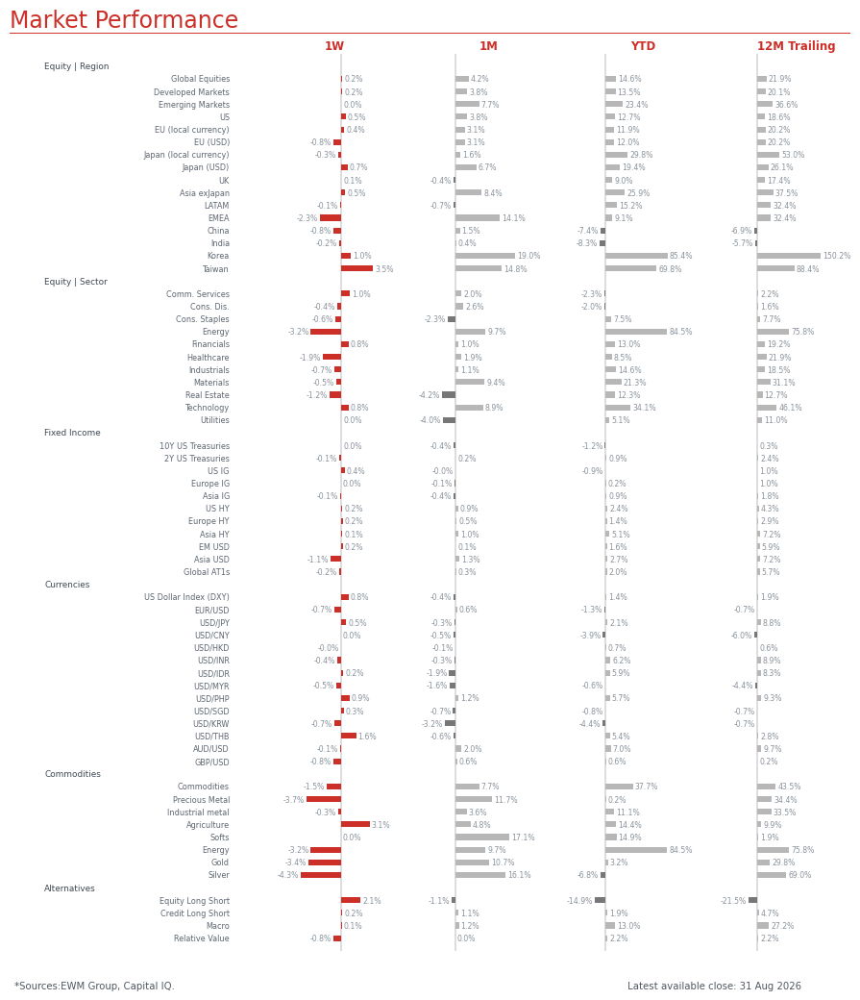

Saved chart to: EWM_market_performance_today.png


In [6]:
#@title Daily Market Monitoring System { display-mode: "form" }

import subprocess
subprocess.run(["pip", "install", "yfinance", "pandas", "numpy", "matplotlib", "-q"], check=False)

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


# ==========================================================
# 1. Asset map
#    用公开 Yahoo ticker / ETF proxy
#    如果你有 Bloomberg/MSCI/HFR 官方 ticker，替换这里即可
# ==========================================================

ASSET_MAP = [
    # ---------------- Equity | Region ----------------
    {"group": "Equity | Region", "name": "Global Equities", "tickers": ["ACWI"]},
    {"group": "Equity | Region", "name": "Developed Markets", "tickers": ["URTH", "VEA"]},
    {"group": "Equity | Region", "name": "Emerging Markets", "tickers": ["EEM", "VWO"]},
    {"group": "Equity | Region", "name": "US", "tickers": ["^GSPC", "SPY"]},
    {"group": "Equity | Region", "name": "EU (local currency)", "tickers": ["^STOXX50E", "^STOXX", "FEZ"]},
    {"group": "Equity | Region", "name": "EU (USD)", "tickers": ["VGK", "IEUR"]},
    {"group": "Equity | Region", "name": "Japan (local currency)", "tickers": ["^N225"]},
    {"group": "Equity | Region", "name": "Japan (USD)", "tickers": ["EWJ"]},
    {"group": "Equity | Region", "name": "UK", "tickers": ["^FTSE", "EWU"]},
    {"group": "Equity | Region", "name": "Asia exJapan", "tickers": ["AAXJ"]},
    {"group": "Equity | Region", "name": "LATAM", "tickers": ["ILF"]},
    {"group": "Equity | Region", "name": "EMEA", "tickers": ["EEME.L", "GAF", "AFK"]},
    {"group": "Equity | Region", "name": "China", "tickers": ["MCHI", "FXI"]},
    {"group": "Equity | Region", "name": "India", "tickers": ["INDA", "EPI"]},
    {"group": "Equity | Region", "name": "Korea", "tickers": ["EWY"]},
    {"group": "Equity | Region", "name": "Taiwan", "tickers": ["EWT"]},

    # ---------------- Equity | Sector ----------------
    {"group": "Equity | Sector", "name": "Comm. Services", "tickers": ["IXP", "XLC"]},
    {"group": "Equity | Sector", "name": "Cons. Dis.", "tickers": ["RXI", "XLY"]},
    {"group": "Equity | Sector", "name": "Cons. Staples", "tickers": ["KXI", "XLP"]},
    {"group": "Equity | Sector", "name": "Energy", "tickers": ["IXC", "XLE"]},
    {"group": "Equity | Sector", "name": "Financials", "tickers": ["IXG", "XLF"]},
    {"group": "Equity | Sector", "name": "Healthcare", "tickers": ["IXJ", "XLV"]},
    {"group": "Equity | Sector", "name": "Industrials", "tickers": ["EXI", "XLI"]},
    {"group": "Equity | Sector", "name": "Materials", "tickers": ["MXI", "XLB"]},
    {"group": "Equity | Sector", "name": "Real Estate", "tickers": ["REET", "XLRE"]},
    {"group": "Equity | Sector", "name": "Technology", "tickers": ["IXN", "XLK"]},
    {"group": "Equity | Sector", "name": "Utilities", "tickers": ["JXI", "XLU"]},

    # ---------------- Fixed Income ----------------
    {"group": "Fixed Income", "name": "10Y US Treasuries", "tickers": ["IEF"]},
    {"group": "Fixed Income", "name": "2Y US Treasuries", "tickers": ["SHY"]},
    {"group": "Fixed Income", "name": "US IG", "tickers": ["LQD"]},
    {"group": "Fixed Income", "name": "Europe IG", "tickers": ["IEAC.L", "BNDX"]},
    {"group": "Fixed Income", "name": "Asia IG", "tickers": ["IAGG", "AGGG.L"]},
    {"group": "Fixed Income", "name": "US HY", "tickers": ["HYG", "JNK"]},
    {"group": "Fixed Income", "name": "Europe HY", "tickers": ["IHYG.L", "HYXU"]},
    {"group": "Fixed Income", "name": "Asia HY", "tickers": ["AHYG.L", "HYEM"]},
    {"group": "Fixed Income", "name": "EM USD", "tickers": ["EMB"]},
    {"group": "Fixed Income", "name": "Asia USD", "tickers": ["EMLC", "IAGG"]},
    {"group": "Fixed Income", "name": "Global AT1s", "tickers": ["AT1.L", "COCO.L"]},

    # ---------------- Currencies ----------------
    {"group": "Currencies", "name": "US Dollar Index (DXY)", "tickers": ["DX-Y.NYB"]},
    {"group": "Currencies", "name": "EUR/USD", "tickers": ["EURUSD=X"]},
    {"group": "Currencies", "name": "USD/JPY", "tickers": ["JPY=X"]},
    {"group": "Currencies", "name": "USD/CNY", "tickers": ["CNY=X"]},
    {"group": "Currencies", "name": "USD/HKD", "tickers": ["HKD=X"]},
    {"group": "Currencies", "name": "USD/INR", "tickers": ["INR=X"]},
    {"group": "Currencies", "name": "USD/IDR", "tickers": ["IDR=X"]},
    {"group": "Currencies", "name": "USD/MYR", "tickers": ["MYR=X"]},
    {"group": "Currencies", "name": "USD/PHP", "tickers": ["PHP=X"]},
    {"group": "Currencies", "name": "USD/SGD", "tickers": ["SGD=X"]},
    {"group": "Currencies", "name": "USD/KRW", "tickers": ["KRW=X"]},
    {"group": "Currencies", "name": "USD/THB", "tickers": ["THB=X"]},
    {"group": "Currencies", "name": "AUD/USD", "tickers": ["AUDUSD=X"]},
    {"group": "Currencies", "name": "GBP/USD", "tickers": ["GBPUSD=X"]},

    # ---------------- Commodities ----------------
    {"group": "Commodities", "name": "Commodities", "tickers": ["DBC", "BCI"]},
    {"group": "Commodities", "name": "Precious Metal", "tickers": ["DBP", "GLTR"]},
    {"group": "Commodities", "name": "Industrial metal", "tickers": ["DBB", "CPER"]},
    {"group": "Commodities", "name": "Agriculture", "tickers": ["DBA", "CORN"]},
    {"group": "Commodities", "name": "Softs", "tickers": ["JO", "CANE", "NIB"]},
    {"group": "Commodities", "name": "Energy", "tickers": ["DBE", "USO"]},
    {"group": "Commodities", "name": "Gold", "tickers": ["GLD", "IAU"]},
    {"group": "Commodities", "name": "Silver", "tickers": ["SLV"]},

    # ---------------- Alternatives ----------------
    {"group": "Alternatives", "name": "Equity Long Short", "tickers": ["QMN", "BTAL"]},
    {"group": "Alternatives", "name": "Credit Long Short", "tickers": ["BKLN", "SRLN"]},
    {"group": "Alternatives", "name": "Macro", "tickers": ["DBMF", "KMLM"]},
    {"group": "Alternatives", "name": "Relative Value", "tickers": ["MNA", "QAI"]},
]


# ==========================================================
# 2. Download price data
# ==========================================================

def unique_tickers(asset_map):
    out = []
    for item in asset_map:
        for t in item["tickers"]:
            if t not in out:
                out.append(t)
    return out


def download_prices(tickers, start_date, end_date, chunk_size=40):
    all_close = []

    for i in range(0, len(tickers), chunk_size):
        batch = tickers[i:i + chunk_size]

        raw = yf.download(
            batch,
            start=start_date,
            end=end_date,
            auto_adjust=True,
            progress=False,
            threads=True,
        )

        if raw.empty:
            continue

        if isinstance(raw.columns, pd.MultiIndex):
            if "Close" in raw.columns.get_level_values(0):
                close = raw["Close"].copy()
            elif "Adj Close" in raw.columns.get_level_values(0):
                close = raw["Adj Close"].copy()
            else:
                continue
        else:
            if "Close" in raw.columns:
                close = raw[["Close"]].copy()
                close.columns = batch[:1]
            elif "Adj Close" in raw.columns:
                close = raw[["Adj Close"]].copy()
                close.columns = batch[:1]
            else:
                continue

        all_close.append(close)

    if not all_close:
        raise RuntimeError("No data downloaded. Check yfinance connection.")

    prices = pd.concat(all_close, axis=1)
    prices = prices.loc[:, ~prices.columns.duplicated()]
    prices.index = pd.to_datetime(prices.index).tz_localize(None)
    prices = prices.sort_index()
    return prices


today = pd.Timestamp.today().normalize()
start = today - pd.DateOffset(days=550)
end = today + pd.DateOffset(days=1)

tickers = unique_tickers(ASSET_MAP)

prices = download_prices(
    tickers=tickers,
    start_date=start.strftime("%Y-%m-%d"),
    end_date=end.strftime("%Y-%m-%d"),
)

print(f"Downloaded price data: {prices.index.min().date()} → {prices.index.max().date()}")
print(f"Tickers downloaded: {prices.shape[1]}")


# ==========================================================
# 3. Pick first valid proxy for each asset
# ==========================================================

def pick_ticker(ticker_list, prices, min_obs=40):
    for t in ticker_list:
        if t in prices.columns:
            s = prices[t].dropna()
            if len(s) >= min_obs:
                return t
    return None


selected = {}
for item in ASSET_MAP:
    selected[item["name"]] = pick_ticker(item["tickers"], prices)


failed = [k for k, v in selected.items() if v is None]
if failed:
    print("\nNo valid data for:")
    for x in failed:
        print(" -", x)


# ==========================================================
# 4. Calculate returns
# ==========================================================

PERIODS = ["1W", "1M", "YTD", "12M Trailing"]


def price_on_or_before(series, target_date):
    s = series.dropna()
    if s.empty:
        return np.nan

    target_date = pd.Timestamp(target_date)
    eligible = s.loc[s.index <= target_date]

    if eligible.empty:
        return np.nan

    return eligible.iloc[-1]


def calc_returns(series):
    s = series.dropna()
    if s.empty:
        return {p: np.nan for p in PERIODS}, None

    latest_date = s.index.max()
    latest_px = s.loc[latest_date]

    anchors = {
        "1W": latest_date - pd.Timedelta(days=7),
        "1M": latest_date - pd.DateOffset(months=1),
        "YTD": pd.Timestamp(year=latest_date.year, month=1, day=1) - pd.Timedelta(days=1),
        "12M Trailing": latest_date - pd.DateOffset(years=1),
    }

    out = {}
    for p, anchor_date in anchors.items():
        base_px = price_on_or_before(s, anchor_date)

        if pd.isna(base_px) or base_px == 0:
            out[p] = np.nan
        else:
            out[p] = (latest_px / base_px - 1.0) * 100.0

    return out, latest_date


records = []
asof_dates = {}

for item in ASSET_MAP:
    name = item["name"]
    t = selected.get(name)

    if t is None:
        row = {"Group": item["group"], "Name": name, "Ticker": None}
        for p in PERIODS:
            row[p] = np.nan
        asof_dates[name] = None
    else:
        ret, asof = calc_returns(prices[t])
        row = {"Group": item["group"], "Name": name, "Ticker": t}
        row.update(ret)
        asof_dates[name] = asof

    records.append(row)


ret_df = pd.DataFrame(records)

global_asof = max([d for d in asof_dates.values() if d is not None])
print(f"\nLatest available date: {global_asof.date()}")

# # Save table
# ret_df.to_csv("market_performance_today.csv", index=False)


# ==========================================================
# 5. Build rows with group headers
# ==========================================================

plot_rows = []
last_group = None

for _, r in ret_df.iterrows():
    if r["Group"] != last_group:
        plot_rows.append({
            "type": "header",
            "label": r["Group"],
            "name": None,
        })
        last_group = r["Group"]

    plot_rows.append({
        "type": "asset",
        "label": r["Name"],
        "name": r["Name"],
    })


# ==========================================================
# 6. Plot function
# ==========================================================

def plot_market_performance(ret_df, plot_rows, global_asof, output_png="market_performance_today.png"):
    red = "#cc2f27"
    grey = "#b7b7b7"
    dark_grey = "#777777"
    light_axis = "#d7d7d7"
    text_grey = "#5c6570"

    n = len(plot_rows)
    y_positions = np.arange(n)[::-1]

    fig_h = max(10.5, n * 0.155)
    fig = plt.figure(figsize=(9.2, fig_h), facecolor="white")

    gs = fig.add_gridspec(
        nrows=1,
        ncols=5,
        width_ratios=[2.35, 1.15, 1.15, 1.15, 1.15],
        left=0.045,
        right=0.985,
        top=0.925,
        bottom=0.065,
        wspace=0.38,
    )

    ax_label = fig.add_subplot(gs[0, 0])
    axes = [fig.add_subplot(gs[0, i]) for i in range(1, 5)]

    # Title
    fig.text(
        0.035,
        0.968,
        "Market Performance",
        fontsize=17,
        color=red,
        ha="left",
        va="top",
        fontweight="normal",
    )

    fig.add_artist(
        Line2D(
            [0.035, 0.985],
            [0.945, 0.945],
            transform=fig.transFigure,
            color=red,
            lw=0.7,
        )
    )

    # Left label axis
    ax_label.set_xlim(0, 1)
    ax_label.set_ylim(-1, n)
    ax_label.axis("off")

    for i, row in enumerate(plot_rows):
        y = y_positions[i]

        if row["type"] == "header":
            ax_label.text(
                0.12,
                y,
                row["label"],
                ha="left",
                va="center",
                fontsize=6.4,
                color="#3f4954",
                fontweight="normal",
            )
        else:
            ax_label.text(
                0.98,
                y,
                row["label"],
                ha="right",
                va="center",
                fontsize=5.9,
                color=text_grey,
            )

    # Period charts
    for ax, period in zip(axes, PERIODS):
        vals = []
        ys = []

        for i, row in enumerate(plot_rows):
            if row["type"] != "asset":
                continue

            name = row["name"]
            v = ret_df.loc[ret_df["Name"] == name, period].values[0]
            if pd.isna(v):
                continue

            vals.append(v)
            ys.append(y_positions[i])

        vals = np.array(vals, dtype=float)

        if len(vals) == 0:
            xmin, xmax = -1, 1
        else:
            max_pos = max(0.5, np.nanmax(vals[vals >= 0]) if np.any(vals >= 0) else 0.5)
            max_neg = max(0.5, abs(np.nanmin(vals[vals < 0])) if np.any(vals < 0) else 0.5)

            # leave room for value labels
            xmin = -max_neg * 1.45
            xmax = max_pos * 1.45

            # avoid too narrow axis
            if xmax - xmin < 4:
                mid = (xmax + xmin) / 2
                xmin = mid - 2
                xmax = mid + 2

        ax.set_xlim(xmin, xmax)
        ax.set_ylim(-1, n)

        ax.axvline(0, color=light_axis, lw=1.2, zorder=0)

        # Remove all decorations
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)

        ax.set_title(
            period,
            fontsize=8.5,
            color=red,
            fontweight="bold",
            pad=3,
        )

        offset = (xmax - xmin) * 0.018

        for i, row in enumerate(plot_rows):
            if row["type"] != "asset":
                continue

            name = row["name"]
            v = ret_df.loc[ret_df["Name"] == name, period].values[0]
            if pd.isna(v):
                continue

            y = y_positions[i]

            if period == "1W":
                bar_color = red
            else:
                bar_color = grey if v >= 0 else dark_grey

            ax.barh(
                y,
                v,
                height=0.46,
                color=bar_color,
                edgecolor="none",
                zorder=2,
            )

            # value label
            label = f"{v:.1f}%"

            if v >= 0:
                x_text = v + offset
                ha = "left"
            else:
                x_text = v - offset
                ha = "right"

            ax.text(
                x_text,
                y,
                label,
                ha=ha,
                va="center",
                fontsize=5.6,
                color="#8a939c",
                clip_on=False,
            )

    # Footnote
    fig.text(
        0.04,
        0.027,
        f"*Sources:EWM Group, Capital IQ.                                                                                                                                                 Latest available close: {global_asof.strftime('%d %b %Y')}",
        fontsize=7.3,
        color="#4d5660",
        ha="left",
        va="bottom",
    )

    plt.savefig(output_png, dpi=220, bbox_inches="tight", facecolor="white")
    plt.show()

    print(f"Saved chart to: {output_png}")


plot_market_performance(
    ret_df=ret_df,
    plot_rows=plot_rows,
    global_asof=global_asof,
    output_png="EWM_market_performance_today.png",
)

In [7]:
#@title SP500 stock download { display-mode: "form" }
from __future__ import annotations

import os
import random
import time
from io import BytesIO
from datetime import date, timedelta
from getpass import getpass
from pathlib import Path
from typing import Iterable

import numpy as np
import pandas as pd
import plotly.graph_objects as go
import requests


# -----------------------------------------------------------------------------
# Configuration
# -----------------------------------------------------------------------------
BASE_URL = "https://financialmodelingprep.com/stable"
CACHE_DIR = Path("fmp_cache")
CACHE_DIR.mkdir(exist_ok=True)

# Bulk files are large. Keep requests sequential and pause between downloads.
BULK_PAUSE_SECONDS = 12
MAX_RETRIES = 8
REQUEST_TIMEOUT = 180

# Set to "close" for share-price return only.
# Set to "adjClose" for dividend-adjusted total shareholder return.
PRICE_FIELD = "close"

# Similar ranges to the reference chart. Change to None for automatic limits.
X_LIM = (-20, 80)
Y_LIM = (-20, 50)

# Optional text labels for the largest bubbles on chart itself. Hover always works.
LABEL_TOP_N = 0

API_KEY =  "490ed0ef6adef36a548539c3e6da425e"
if not API_KEY:
    raise ValueError("FMP API key is required.")

SESSION = requests.Session()
SESSION.headers.update({"User-Agent": "sp500-roic-growth-chart-interactive/1.0"})


# -----------------------------------------------------------------------------
# API and cache helpers
# -----------------------------------------------------------------------------
def safe_cache_name(endpoint: str, params: dict | None = None) -> str:
    parts = [endpoint.replace("/", "_")]
    for key, value in sorted((params or {}).items()):
        text = str(value).replace("/", "-").replace(",", "_")
        if len(text) > 80:
            text = f"hash{abs(hash(text))}"
        parts.append(f"{key}-{text}")
    return "__".join(parts) + ".pkl.gz"


def request_data(endpoint: str, params: dict | None = None) -> pd.DataFrame | list | dict:
    """Download an FMP endpoint and parse either JSON or CSV."""
    url = f"{BASE_URL}/{endpoint.lstrip('/')}"
    query = dict(params or {})
    query["apikey"] = API_KEY

    for attempt in range(MAX_RETRIES):
        try:
            response = SESSION.get(url, params=query, timeout=REQUEST_TIMEOUT)

            if response.status_code == 429:
                retry_after = response.headers.get("Retry-After")
                wait = float(retry_after) if retry_after else min(
                    180, 15 * (2**attempt) + random.uniform(0, 5)
                )
                print(f"429 rate limit: waiting {wait:.0f}s for {endpoint} ...")
                time.sleep(wait)
                continue

            response.raise_for_status()

            raw = response.content
            if not raw:
                return pd.DataFrame()

            stripped = raw.lstrip(b"\xef\xbb\xbf \t\r\n")
            first_char = stripped[:1]

            if first_char in (b"[", b"{"):
                data = response.json()
                if isinstance(data, dict):
                    error_text = (
                        data.get("Error Message")
                        or data.get("error")
                        or data.get("message")
                    )
                    if error_text:
                        raise RuntimeError(f"FMP error for {endpoint}: {error_text}")
                return data

            frame = pd.read_csv(BytesIO(raw), low_memory=False)
            if frame.shape[1] <= 1:
                preview = response.text[:500].strip()
                raise RuntimeError(
                    f"Unexpected non-JSON/non-tabular response for {endpoint}: {preview}"
                )
            return frame

        except (requests.RequestException, pd.errors.ParserError, UnicodeError) as exc:
            if attempt == MAX_RETRIES - 1:
                raise
            wait = min(120, 5 * (2**attempt) + random.uniform(0, 3))
            print(f"Request failed ({exc}); retrying in {wait:.0f}s ...")
            time.sleep(wait)

    raise RuntimeError(f"Failed to download {endpoint}")


def fmp_df(
    endpoint: str,
    params: dict | None = None,
    *,
    cache_name: str | None = None,
    force_refresh: bool = False,
) -> pd.DataFrame:
    cache_file = CACHE_DIR / (cache_name or safe_cache_name(endpoint, params))

    if cache_file.exists() and not force_refresh:
        return pd.read_pickle(cache_file, compression="gzip")

    data = request_data(endpoint, params)
    if isinstance(data, pd.DataFrame):
        df = data
    elif isinstance(data, list):
        df = pd.DataFrame(data)
    elif isinstance(data, dict):
        list_values = [value for value in data.values() if isinstance(value, list)]
        df = pd.DataFrame(list_values[0] if list_values else [data])
    else:
        df = pd.DataFrame()

    df.to_pickle(cache_file, compression="gzip")
    return df


def find_column(df: pd.DataFrame, candidates: Iterable[str], required: bool = True) -> str | None:
    exact = {column.lower(): column for column in df.columns}
    for candidate in candidates:
        if candidate.lower() in exact:
            return exact[candidate.lower()]

    normalised = {
        "".join(ch for ch in column.lower() if ch.isalnum()): column
        for column in df.columns
    }
    for candidate in candidates:
        key = "".join(ch for ch in candidate.lower() if ch.isalnum())
        if key in normalised:
            return normalised[key]

    if required:
        raise KeyError(
            f"None of {list(candidates)} found. Available columns: {list(df.columns)}"
        )
    return None


def join_symbol(series: pd.Series) -> pd.Series:
    """Normalise BRK.B/BRK-B-style variants for merging only."""
    return (
        series.astype(str)
        .str.strip()
        .str.upper()
        .str.replace(".", "-", regex=False)
    )


def to_percent(series: pd.Series) -> pd.Series:
    """Convert ratio-form values to percentage-form, without double multiplying."""
    values = pd.to_numeric(series, errors="coerce")
    typical = values.abs().replace([np.inf, -np.inf], np.nan).median()
    if pd.notna(typical) and typical <= 2:
        values = values * 100
    return values


def fmt_pct(value: float) -> str:
    if pd.isna(value):
        return "N/A"
    return f"{value:,.1f}%"


def fmt_bn(value: float) -> str:
    if pd.isna(value):
        return "N/A"
    return f"${value:,.1f}bn"


# -----------------------------------------------------------------------------
# Data downloads
# -----------------------------------------------------------------------------
print("Downloading S&P 500 constituents ...")
sp500 = fmp_df("sp500-constituent", cache_name="sp500_constituent.pkl.gz")
sp_symbol_col = find_column(sp500, ["symbol"])
sp_name_col = find_column(sp500, ["name", "companyName"], required=False)
sp_sector_col = find_column(sp500, ["sector"], required=False)

universe = pd.DataFrame({
    "api_symbol": sp500[sp_symbol_col].astype(str),
    "symbol": join_symbol(sp500[sp_symbol_col]),
    "company": (
        sp500[sp_name_col].astype(str)
        if sp_name_col
        else sp500[sp_symbol_col].astype(str)
    ),
    "sector": sp500[sp_sector_col].astype(str) if sp_sector_col else "Unknown",
}).drop_duplicates("symbol")

api_symbols = universe["api_symbol"].tolist()
symbol_set = set(universe["symbol"])
print(f"S&P 500 universe: {len(universe):,} securities")

print("Downloading TTM key metrics ...")
metrics_raw = fmp_df(
    "key-metrics-ttm-bulk",
    cache_name="key_metrics_ttm_bulk.pkl.gz",
)
metrics_symbol_col = find_column(metrics_raw, ["symbol"])
roic_col = find_column(
    metrics_raw,
    [
        "returnOnInvestedCapitalTTM",
        "roicTTM",
        "returnOnInvestedCapital",
        "roic",
    ],
)

metrics = pd.DataFrame({
    "symbol": join_symbol(metrics_raw[metrics_symbol_col]),
    "roic_pct": to_percent(metrics_raw[roic_col]),
})
metrics = metrics[metrics["symbol"].isin(symbol_set)].drop_duplicates("symbol", keep="first")

print("Downloading current market capitalisations in batches ...")
market_cap_frames: list[pd.DataFrame] = []
chunk_size = 150
for start in range(0, len(api_symbols), chunk_size):
    chunk = api_symbols[start : start + chunk_size]
    chunk_id = start // chunk_size
    frame = fmp_df(
        "market-capitalization-batch",
        {"symbols": ",".join(chunk)},
        cache_name=f"market_cap_batch_{chunk_id}.pkl.gz",
    )
    market_cap_frames.append(frame)
    if start + chunk_size < len(api_symbols):
        time.sleep(2)

market_cap_raw = pd.concat(market_cap_frames, ignore_index=True)
mc_symbol_col = find_column(market_cap_raw, ["symbol"])
mc_col = find_column(market_cap_raw, ["marketCap", "marketCapitalization"])
market_caps = pd.DataFrame({
    "symbol": join_symbol(market_cap_raw[mc_symbol_col]),
    "market_cap": pd.to_numeric(market_cap_raw[mc_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

print("Downloading annual income statements ...")
current_year = date.today().year
income_frames: list[pd.DataFrame] = []
for year in range(current_year, current_year - 6, -1):
    frame = fmp_df(
        "income-statement-bulk",
        {"year": year, "period": "FY"},
        cache_name=f"income_statement_FY_{year}.pkl.gz",
    )
    if not frame.empty:
        income_frames.append(frame)
        print(f"  FY {year}: {len(frame):,} rows")
    if year > current_year - 5:
        time.sleep(BULK_PAUSE_SECONDS)

if not income_frames:
    raise RuntimeError("No annual income-statement bulk data was returned.")

income_raw = pd.concat(income_frames, ignore_index=True)
income_symbol_col = find_column(income_raw, ["symbol"])
income_date_col = find_column(income_raw, ["date", "fillingDate", "fiscalDateEnding"])
revenue_col = find_column(income_raw, ["revenue"])

income = pd.DataFrame({
    "symbol": join_symbol(income_raw[income_symbol_col]),
    "fiscal_date": pd.to_datetime(income_raw[income_date_col], errors="coerce"),
    "revenue": pd.to_numeric(income_raw[revenue_col], errors="coerce"),
})
income = income[
    income["symbol"].isin(symbol_set)
    & income["fiscal_date"].notna()
    & income["revenue"].gt(0)
]
income = income.drop_duplicates(["symbol", "fiscal_date"], keep="last")


def three_year_revenue_cagr(group: pd.DataFrame) -> pd.Series:
    group = group.sort_values("fiscal_date")
    latest = group.iloc[-1]
    target_date = latest["fiscal_date"] - pd.DateOffset(years=3)

    older = group[group["fiscal_date"] < latest["fiscal_date"]].copy()
    if older.empty:
        return pd.Series({"revenue_cagr_3y_pct": np.nan})

    older["distance"] = (older["fiscal_date"] - target_date).abs()
    prior = older.loc[older["distance"].idxmin()]
    elapsed_years = (latest["fiscal_date"] - prior["fiscal_date"]).days / 365.25

    if not (2.5 <= elapsed_years <= 3.5):
        return pd.Series({"revenue_cagr_3y_pct": np.nan})

    cagr = (latest["revenue"] / prior["revenue"]) ** (1 / elapsed_years) - 1
    return pd.Series({"revenue_cagr_3y_pct": cagr * 100})


revenue_growth_records = []
for symbol, group in income.groupby("symbol"):
    result = three_year_revenue_cagr(group)
    revenue_growth_records.append({
        "symbol": symbol,
        "revenue_cagr_3y_pct": result["revenue_cagr_3y_pct"],
    })
revenue_growth = pd.DataFrame(revenue_growth_records)


def eod_for_or_before(target_date: date, max_lookback_days: int = 10) -> tuple[pd.DataFrame, date]:
    for days_back in range(max_lookback_days + 1):
        candidate = target_date - timedelta(days=days_back)
        frame = fmp_df(
            "eod-bulk",
            {"date": candidate.isoformat()},
            cache_name=f"eod_bulk_{candidate.isoformat()}.pkl.gz",
        )
        if frame.empty:
            continue

        symbol_col = find_column(frame, ["symbol"])
        filtered = frame[join_symbol(frame[symbol_col]).isin(symbol_set)].copy()
        if len(filtered) >= 300:
            return filtered, candidate

    raise RuntimeError(f"No usable EOD bulk file found on or before {target_date}")


print("Downloading latest and one-year-ago EOD prices ...")
latest_eod, latest_date = eod_for_or_before(date.today())
prior_target = (pd.Timestamp(latest_date) - pd.DateOffset(years=1)).date()
prior_eod, prior_date = eod_for_or_before(prior_target)

latest_symbol_col = find_column(latest_eod, ["symbol"])
prior_symbol_col = find_column(prior_eod, ["symbol"])
latest_price_col = find_column(latest_eod, [PRICE_FIELD, "close", "adjClose"])
prior_price_col = find_column(prior_eod, [PRICE_FIELD, "close", "adjClose"])

latest_prices = pd.DataFrame({
    "symbol": join_symbol(latest_eod[latest_symbol_col]),
    "price_now": pd.to_numeric(latest_eod[latest_price_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

prior_prices = pd.DataFrame({
    "symbol": join_symbol(prior_eod[prior_symbol_col]),
    "price_1y_ago": pd.to_numeric(prior_eod[prior_price_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

price_returns = latest_prices.merge(prior_prices, on="symbol", how="inner")
price_returns["price_return_1y_pct"] = (
    price_returns["price_now"] / price_returns["price_1y_ago"] - 1
) * 100


# -----------------------------------------------------------------------------
# Merge and clean
# -----------------------------------------------------------------------------
chart_data = (
    universe
    .merge(metrics, on="symbol", how="left")
    .merge(revenue_growth, on="symbol", how="left")
    .merge(market_caps, on="symbol", how="left")
    .merge(price_returns[["symbol", "price_return_1y_pct"]], on="symbol", how="left")
)

chart_data = chart_data.replace([np.inf, -np.inf], np.nan)
chart_data = chart_data.dropna(
    subset=["roic_pct", "revenue_cagr_3y_pct", "market_cap", "price_return_1y_pct"]
)
chart_data = chart_data[chart_data["market_cap"] > 0].copy()
chart_data["market_cap_bn"] = chart_data["market_cap"] / 1e9


def return_bucket(value: float) -> str:
    if value > 20:
        return "Above 20%"
    if value >= 7.5:
        return "7.5%-20%"
    if value >= 0:
        return "0%-7.5%"
    return "Below 0%"


bucket_order = ["Above 20%", "7.5%-20%", "0%-7.5%", "Below 0%"]
chart_data["return_bucket"] = pd.Categorical(
    chart_data["price_return_1y_pct"].map(return_bucket),
    categories=bucket_order,
    ordered=True,
)

# Log market cap prevents mega-caps from overwhelming all other bubbles.
log_cap = np.log10(chart_data["market_cap_bn"].clip(lower=0.1))
if log_cap.max() == log_cap.min():
    chart_data["bubble_size"] = 18
else:
    chart_data["bubble_size"] = 10 + 34 * (
        (log_cap - log_cap.min()) / (log_cap.max() - log_cap.min())
    )

chart_data = chart_data.sort_values("market_cap", ascending=False)
chart_data["label"] = ""
if LABEL_TOP_N > 0:
    chart_data.loc[chart_data.head(LABEL_TOP_N).index, "label"] = chart_data.loc[
        chart_data.head(LABEL_TOP_N).index, "api_symbol"
    ]

chart_data["roic_display"] = chart_data["roic_pct"].map(fmt_pct)
chart_data["revenue_display"] = chart_data["revenue_cagr_3y_pct"].map(fmt_pct)
chart_data["return_display"] = chart_data["price_return_1y_pct"].map(fmt_pct)
chart_data["market_cap_display"] = chart_data["market_cap_bn"].map(fmt_bn)

print(f"Usable companies in chart: {len(chart_data):,}")
print(f"Price period: {prior_date} to {latest_date}")


# -----------------------------------------------------------------------------
# Interactive Plotly chart
# -----------------------------------------------------------------------------


S&P 500 universe: 503 securities
  FY 2026: 8,644 rows
  FY 2025: 51,696 rows
  FY 2024: 55,280 rows
  FY 2023: 58,100 rows
  FY 2022: 61,295 rows
  FY 2021: 63,099 rows
429 rate limit: waiting 19s for eod-bulk ...
429 rate limit: waiting 18s for eod-bulk ...
429 rate limit: waiting 17s for eod-bulk ...
429 rate limit: waiting 15s for eod-bulk ...
Usable companies in chart: 499
Price period: 2025-08-28 to 2026-08-28


In [8]:
#@title SP500 stock ROIC-Revenue growth { display-mode: "form" }
import numpy as np
import pandas as pd
import plotly.graph_objects as go


# ============================================================
# Plotly interactive bubble chart
#
# X-axis       = ROIC (TTM)
# Y-axis       = Revenue Growth (3-year CAGR)
# Bubble size  = Market Capitalisation, log-scaled
# Bubble color = 1-Year Share Price Return
# ============================================================


# ------------------------------------------------------------
# 需要提前准备好的变量
# ------------------------------------------------------------
# chart_data 至少需要包含以下列：
#
# api_symbol
# company
# sector
# roic_pct
# revenue_cagr_3y_pct
# market_cap_bn
# price_return_1y_pct
#
# prior_date 和 latest_date 用于底部数据来源说明，例如：
#
# prior_date = "2025-07-24"
# latest_date = "2026-07-24"
#
# 如果没有定义日期，下面会自动使用通用文字。


# ------------------------------------------------------------
# 复制数据，避免修改原始 DataFrame
# ------------------------------------------------------------
chart_data = chart_data.copy()


# ------------------------------------------------------------
# 检查必要字段
# ------------------------------------------------------------
required_columns = [
    "api_symbol",
    "company",
    "sector",
    "roic_pct",
    "revenue_cagr_3y_pct",
    "market_cap_bn",
    "price_return_1y_pct",
]

missing_columns = [
    column
    for column in required_columns
    if column not in chart_data.columns
]

if missing_columns:
    raise ValueError(
        "chart_data 缺少以下必要字段："
        + ", ".join(missing_columns)
    )


# ------------------------------------------------------------
# 转换数值列
# ------------------------------------------------------------
numeric_columns = [
    "roic_pct",
    "revenue_cagr_3y_pct",
    "market_cap_bn",
    "price_return_1y_pct",
]

for column in numeric_columns:
    chart_data[column] = pd.to_numeric(
        chart_data[column],
        errors="coerce",
    )


# ------------------------------------------------------------
# 清理缺失值和无效数据
# ------------------------------------------------------------
chart_data = chart_data.dropna(
    subset=[
        "roic_pct",
        "revenue_cagr_3y_pct",
        "market_cap_bn",
        "price_return_1y_pct",
    ]
).copy()

chart_data = chart_data[
    chart_data["market_cap_bn"] > 0
].copy()

if chart_data.empty:
    raise ValueError(
        "清理缺失值和无效市值后，chart_data 没有可绘制的数据。"
    )


# ------------------------------------------------------------
# 设定 1-Year Share Price Return 区间
# ------------------------------------------------------------
bucket_order = [
    "Above 20%",
    "7.5%-20%",
    "0%-7.5%",
    "Below 0%",
]


def assign_return_bucket(return_pct):
    """
    根据过去一年股价回报划分颜色区间。
    """
    if return_pct > 20:
        return "Above 20%"
    elif return_pct >= 7.5:
        return "7.5%-20%"
    elif return_pct >= 0:
        return "0%-7.5%"
    else:
        return "Below 0%"


chart_data["return_bucket"] = (
    chart_data["price_return_1y_pct"]
    .apply(assign_return_bucket)
)


# ------------------------------------------------------------
# 每个回报区间对应的颜色
# ------------------------------------------------------------
colours = {
    "Above 20%": "#2447D8",
    "7.5%-20%": "#A9B58D",
    "0%-7.5%": "#F2B632",
    "Below 0%": "#EA382B",
}


# ------------------------------------------------------------
# 设置 Plotly 气泡大小
#
# Plotly 的 marker.size 使用像素直径。
# 为了避免超大市值公司完全压制其他公司，
# 这里先对市值取 log10，再缩放到 8-46 像素。
# ------------------------------------------------------------
log_market_cap = np.log10(
    chart_data["market_cap_bn"].clip(lower=0.1)
)

log_cap_min = log_market_cap.min()
log_cap_max = log_market_cap.max()

if np.isclose(log_cap_max, log_cap_min):
    chart_data["plotly_bubble_size"] = 18.0
else:
    chart_data["plotly_bubble_size"] = (
        8
        + 38
        * (
            (log_market_cap - log_cap_min)
            / (log_cap_max - log_cap_min)
        )
    )


# ------------------------------------------------------------
# 日期说明
# ------------------------------------------------------------
try:
    source_date_text = (
        f"Prices: {prior_date} to {latest_date}."
    )
except NameError:
    source_date_text = "Prices: trailing 1-year period."


# ------------------------------------------------------------
# 创建图表
# ------------------------------------------------------------
fig = go.Figure()


# ------------------------------------------------------------
# 每个 1-Year Price Return 区间建立一个 trace
#
# 好处：
# 1. 图例可以单独开关不同回报区间
# 2. 每个区间可以使用独立颜色
# ------------------------------------------------------------
for bucket in bucket_order:

    subset = chart_data[
        chart_data["return_bucket"] == bucket
    ].copy()

    if subset.empty:
        continue

    # Hover 中显示的附加数据
    customdata = np.column_stack([
        subset["api_symbol"].astype(str),
        subset["company"].astype(str),
        subset["sector"].astype(str),
        subset["market_cap_bn"],
        subset["price_return_1y_pct"],
    ])

    fig.add_trace(
        go.Scatter(
            x=subset["roic_pct"],
            y=subset["revenue_cagr_3y_pct"],

            mode="markers",

            name=bucket,

            marker=dict(
                size=subset["plotly_bubble_size"],
                color=colours[bucket],
                opacity=0.90,

                line=dict(
                    width=0.7,
                    color="rgba(255,255,255,0.65)",
                ),
            ),

            customdata=customdata,

            hovertemplate=(
                "<b>%{customdata[1]}</b><br>"
                "Ticker: %{customdata[0]}<br>"
                "Sector: %{customdata[2]}<br>"
                "Market Cap: $%{customdata[3]:,.1f}bn<br>"
                "ROIC (TTM): %{x:.1f}%<br>"
                "Revenue Growth (3Y CAGR): %{y:.1f}%<br>"
                "<b>1-Year Share Price Return: "
                "%{customdata[4]:+.1f}%</b>"
                "<extra></extra>"
            ),
        )
    )


# ------------------------------------------------------------
# 坐标轴刻度
# ------------------------------------------------------------
x_tick_values = list(range(-20, 81, 10))
y_tick_values = list(range(-20, 51, 10))


def percentage_tick_labels(values):
    """
    将负数显示为会计格式，例如：
    -20 -> (20%)
     10 -> 10%
    """
    return [
        f"({abs(value)}%)"
        if value < 0
        else f"{value}%"
        for value in values
    ]


# ------------------------------------------------------------
# 图表整体格式
# ------------------------------------------------------------
fig.update_layout(

    width=1900,
    height=950,

    paper_bgcolor="#F4F7F2",
    plot_bgcolor="#F4F7F2",

    title=dict(
        text=(
            "<b>S&P 500: ROIC, Revenue Growth and "
            "1-Year Share Price Return</b>"
            "<br>"
            "<span style='font-size:17px;color:#606060'>"
            "Bubble Size = Market Capitalisation | "
            "Colour = 1-Year Share Price Return"
            "</span>"
        ),

        x=0.02,
        xanchor="left",

        y=0.97,
        yanchor="top",

        font=dict(
            size=27,
            color="#28613E",
        ),
    ),

    legend=dict(
        orientation="h",

        x=0.5,
        xanchor="center",

        y=1.03,
        yanchor="bottom",

        title=None,

        font=dict(
            size=13,
            color="#606060",
        ),

        bgcolor="rgba(0,0,0,0)",

        itemclick="toggle",
        itemdoubleclick="toggleothers",
    ),

    margin=dict(
        l=100,
        r=50,
        t=155,
        b=135,
    ),

    hovermode="closest",

    hoverlabel=dict(
        bgcolor="white",
        bordercolor="#999999",

        font=dict(
            size=13,
            color="#222222",
        ),
    ),

    annotations=[

        dict(
            text=(
                "<i>Bubble size indicates relative market "
                "capitalisation, log-scaled</i>"
            ),

            x=0.5,
            y=-0.12,

            xref="paper",
            yref="paper",

            xanchor="center",

            showarrow=False,

            font=dict(
                size=15,
                color="#222222",
            ),
        ),

        dict(
            text=(
                "Source: Financial Modeling Prep. "
                f"{source_date_text} "
                "Colour represents 1-year share price return; "
                "revenue growth is fiscal-year CAGR."
            ),

            x=0,
            y=-0.18,

            xref="paper",
            yref="paper",

            xanchor="left",

            showarrow=False,

            font=dict(
                size=10,
                color="#7C817E",
            ),
        ),
    ],
)


# ------------------------------------------------------------
# X轴：ROIC
# ------------------------------------------------------------
fig.update_xaxes(

    title=dict(
        text="<b>ROIC (TTM)</b>",
        font=dict(size=18),
    ),

    range=[-20, 80],

    tickmode="array",
    tickvals=x_tick_values,
    ticktext=percentage_tick_labels(
        x_tick_values
    ),

    tickfont=dict(
        size=13,
        color="#59605E",
    ),

    showgrid=False,

    showline=True,
    linecolor="#C3C8C4",
    linewidth=1,

    zeroline=True,
    zerolinecolor="#BFC5C0",
    zerolinewidth=1.3,

    fixedrange=False,
)


# ------------------------------------------------------------
# Y轴：Revenue Growth 3-Year CAGR
# ------------------------------------------------------------
fig.update_yaxes(

    title=dict(
        text="<b>Revenue Growth — 3-Year CAGR</b>",
        font=dict(size=18),
    ),

    range=[-20, 50],

    tickmode="array",
    tickvals=y_tick_values,
    ticktext=percentage_tick_labels(
        y_tick_values
    ),

    tickfont=dict(
        size=13,
        color="#59605E",
    ),

    showgrid=False,

    showline=True,
    linecolor="#C3C8C4",
    linewidth=1,

    zeroline=True,
    zerolinecolor="#BFC5C0",
    zerolinewidth=1.3,

    fixedrange=False,
)


# ------------------------------------------------------------
# 添加参考线，可帮助识别四个象限
# ------------------------------------------------------------

# ROIC = 10%
fig.add_vline(
    x=10,
    line_width=1,
    line_dash="dot",
    line_color="rgba(90,100,95,0.45)",
)

# Revenue Growth = 10%
fig.add_hline(
    y=10,
    line_width=1,
    line_dash="dot",
    line_color="rgba(90,100,95,0.45)",
)


# ------------------------------------------------------------
# 添加象限说明
# ------------------------------------------------------------
fig.add_annotation(
    x=45,
    y=45,
    text="<b>High ROIC<br>High Growth</b>",
    showarrow=False,
    font=dict(
        size=12,
        color="rgba(40,97,62,0.60)",
    ),
)

fig.add_annotation(
    x=45,
    y=-15,
    text="<b>High ROIC<br>Low Growth</b>",
    showarrow=False,
    font=dict(
        size=12,
        color="rgba(40,97,62,0.60)",
    ),
)

fig.add_annotation(
    x=-15,
    y=45,
    text="<b>Low ROIC<br>High Growth</b>",
    showarrow=False,
    font=dict(
        size=12,
        color="rgba(40,97,62,0.60)",
    ),
)

fig.add_annotation(
    x=-15,
    y=-15,
    text="<b>Low ROIC<br>Low Growth</b>",
    showarrow=False,
    font=dict(
        size=12,
        color="rgba(40,97,62,0.60)",
    ),
)


# ------------------------------------------------------------
# 显示图表
# ------------------------------------------------------------
fig.show()


# ------------------------------------------------------------
# 保存为独立交互 HTML
#
# include_plotlyjs=True：
# 将 Plotly JavaScript 直接写入 HTML，
# 文件不联网也可以正常打开。
# ------------------------------------------------------------
html_file = (
    "sp500_roic_revenue_growth_"
    "1y_price_return_interactive.html"
)

fig.write_html(
    html_file,
    include_plotlyjs=True,
    full_html=True,

    config={
        "displaylogo": False,
        "responsive": True,
        "scrollZoom": True,
    },
)

print(
    f"Saved interactive chart: {html_file}"
)

Saved interactive chart: sp500_roic_revenue_growth_1y_price_return_interactive.html


In [ ]:
#@title SP500 ROIC-Rgrowth Valuation { display-mode: "form" }

from __future__ import annotations

import os
import random
import time
from io import BytesIO
from datetime import date, timedelta
from getpass import getpass
from pathlib import Path
from typing import Iterable
from concurrent.futures import ThreadPoolExecutor, as_completed

import numpy as np
import pandas as pd
import plotly.graph_objects as go
import requests


# -----------------------------------------------------------------------------
# Configuration
# -----------------------------------------------------------------------------
BASE_URL = "https://financialmodelingprep.com/stable"
# FMP currently documents historical annual ratios in bulk under the v4 bulk API.
LEGACY_V4_BASE_URL = "https://financialmodelingprep.com/api/v4"
CACHE_DIR = Path("fmp_cache")
CACHE_DIR.mkdir(exist_ok=True)

# Bulk files are large. Keep requests sequential and pause between downloads.
BULK_PAUSE_SECONDS = 12
MAX_RETRIES = 8
REQUEST_TIMEOUT = 180

# Set to "close" for share-price return only.
# Set to "adjClose" for dividend-adjusted total shareholder return.
PRICE_FIELD = "close"

# Similar ranges to the reference chart. Change to None for automatic limits.
X_LIM = (-20, 80)
Y_LIM = (-20, 50)

# Forward P/E valuation used for bubble colour.
# Current Forward P/E = latest price / next fiscal-year consensus EPS.
# Historical percentile uses a consistent 1Y-forward proxy:
# year-end price / following calendar year's actual diluted EPS.
VALUATION_METRIC = "forward_pe"
valuation_label = "Forward P/E"
HISTORY_YEARS = 10
MIN_HISTORY_OBSERVATIONS = 5
MAX_REASONABLE_FORWARD_PE = 300.0

# Analyst estimates are per-symbol in FMP, so use moderate concurrency.
FORWARD_PE_WORKERS = 8
FORWARD_ESTIMATE_CACHE_DIR = CACHE_DIR / "forward_eps"
FORWARD_ESTIMATE_CACHE_DIR.mkdir(exist_ok=True)

# Optional text labels for the largest bubbles on chart itself. Hover always works.
LABEL_TOP_N = 0

API_KEY = "490ed0ef6adef36a548539c3e6da425e"
if not API_KEY:
    raise ValueError("FMP API key is required.")

SESSION = requests.Session()
SESSION.headers.update({"User-Agent": "sp500-roic-growth-chart-interactive/1.0"})


# -----------------------------------------------------------------------------
# API and cache helpers
# -----------------------------------------------------------------------------
def safe_cache_name(endpoint: str, params: dict | None = None) -> str:
    parts = [endpoint.replace("/", "_")]
    for key, value in sorted((params or {}).items()):
        text = str(value).replace("/", "-").replace(",", "_")
        if len(text) > 80:
            text = f"hash{abs(hash(text))}"
        parts.append(f"{key}-{text}")
    return "__".join(parts) + ".pkl.gz"


def request_data(
    endpoint: str,
    params: dict | None = None,
    *,
    base_url: str = BASE_URL,
) -> pd.DataFrame | list | dict:
    """Download an FMP endpoint and parse either JSON or CSV."""
    url = f"{base_url}/{endpoint.lstrip('/')}"
    query = dict(params or {})
    query["apikey"] = API_KEY

    for attempt in range(MAX_RETRIES):
        try:
            response = SESSION.get(url, params=query, timeout=REQUEST_TIMEOUT)

            if response.status_code == 429:
                retry_after = response.headers.get("Retry-After")
                wait = float(retry_after) if retry_after else min(
                    180, 15 * (2**attempt) + random.uniform(0, 5)
                )
                print(f"429 rate limit: waiting {wait:.0f}s for {endpoint} ...")
                time.sleep(wait)
                continue

            response.raise_for_status()

            raw = response.content
            if not raw:
                return pd.DataFrame()

            stripped = raw.lstrip(b"\xef\xbb\xbf \t\r\n")
            first_char = stripped[:1]

            if first_char in (b"[", b"{"):
                data = response.json()
                if isinstance(data, dict):
                    error_text = (
                        data.get("Error Message")
                        or data.get("error")
                        or data.get("message")
                    )
                    if error_text:
                        raise RuntimeError(f"FMP error for {endpoint}: {error_text}")
                return data

            frame = pd.read_csv(BytesIO(raw), low_memory=False)
            if frame.shape[1] <= 1:
                preview = response.text[:500].strip()
                raise RuntimeError(
                    f"Unexpected non-JSON/non-tabular response for {endpoint}: {preview}"
                )
            return frame

        except (requests.RequestException, pd.errors.ParserError, UnicodeError) as exc:
            if attempt == MAX_RETRIES - 1:
                raise
            wait = min(120, 5 * (2**attempt) + random.uniform(0, 3))
            print(f"Request failed ({exc}); retrying in {wait:.0f}s ...")
            time.sleep(wait)

    raise RuntimeError(f"Failed to download {endpoint}")


def fmp_df(
    endpoint: str,
    params: dict | None = None,
    *,
    cache_name: str | None = None,
    force_refresh: bool = False,
    base_url: str = BASE_URL,
) -> pd.DataFrame:
    cache_file = CACHE_DIR / (cache_name or safe_cache_name(endpoint, params))

    if cache_file.exists() and not force_refresh:
        return pd.read_pickle(cache_file, compression="gzip")

    data = request_data(endpoint, params, base_url=base_url)
    if isinstance(data, pd.DataFrame):
        df = data
    elif isinstance(data, list):
        df = pd.DataFrame(data)
    elif isinstance(data, dict):
        list_values = [value for value in data.values() if isinstance(value, list)]
        df = pd.DataFrame(list_values[0] if list_values else [data])
    else:
        df = pd.DataFrame()

    df.to_pickle(cache_file, compression="gzip")
    return df


def find_column(df: pd.DataFrame, candidates: Iterable[str], required: bool = True) -> str | None:
    exact = {column.lower(): column for column in df.columns}
    for candidate in candidates:
        if candidate.lower() in exact:
            return exact[candidate.lower()]

    normalised = {
        "".join(ch for ch in column.lower() if ch.isalnum()): column
        for column in df.columns
    }
    for candidate in candidates:
        key = "".join(ch for ch in candidate.lower() if ch.isalnum())
        if key in normalised:
            return normalised[key]

    if required:
        raise KeyError(
            f"None of {list(candidates)} found. Available columns: {list(df.columns)}"
        )
    return None


def join_symbol(series: pd.Series) -> pd.Series:
    """Normalise BRK.B/BRK-B-style variants for merging only."""
    return (
        series.astype(str)
        .str.strip()
        .str.upper()
        .str.replace(".", "-", regex=False)
    )


def to_percent(series: pd.Series) -> pd.Series:
    """Convert ratio-form values to percentage-form, without double multiplying."""
    values = pd.to_numeric(series, errors="coerce")
    typical = values.abs().replace([np.inf, -np.inf], np.nan).median()
    if pd.notna(typical) and typical <= 2:
        values = values * 100
    return values


def fmt_pct(value: float) -> str:
    if pd.isna(value):
        return "N/A"
    return f"{value:,.1f}%"


def fmt_bn(value: float) -> str:
    if pd.isna(value):
        return "N/A"
    return f"${value:,.1f}bn"


# -----------------------------------------------------------------------------
# Data downloads
# -----------------------------------------------------------------------------
print("Downloading S&P 500 constituents ...")
sp500 = fmp_df("sp500-constituent", cache_name="sp500_constituent.pkl.gz")
sp_symbol_col = find_column(sp500, ["symbol"])
sp_name_col = find_column(sp500, ["name", "companyName"], required=False)
sp_sector_col = find_column(sp500, ["sector"], required=False)

universe = pd.DataFrame({
    "api_symbol": sp500[sp_symbol_col].astype(str),
    "symbol": join_symbol(sp500[sp_symbol_col]),
    "company": (
        sp500[sp_name_col].astype(str)
        if sp_name_col
        else sp500[sp_symbol_col].astype(str)
    ),
    "sector": sp500[sp_sector_col].astype(str) if sp_sector_col else "Unknown",
}).drop_duplicates("symbol")

api_symbols = universe["api_symbol"].tolist()
symbol_set = set(universe["symbol"])
print(f"S&P 500 universe: {len(universe):,} securities")

print("Downloading TTM key metrics ...")
metrics_raw = fmp_df(
    "key-metrics-ttm-bulk",
    cache_name="key_metrics_ttm_bulk.pkl.gz",
)
metrics_symbol_col = find_column(metrics_raw, ["symbol"])
roic_col = find_column(
    metrics_raw,
    [
        "returnOnInvestedCapitalTTM",
        "roicTTM",
        "returnOnInvestedCapital",
        "roic",
    ],
)

metrics = pd.DataFrame({
    "symbol": join_symbol(metrics_raw[metrics_symbol_col]),
    "roic_pct": to_percent(metrics_raw[roic_col]),
})
metrics = metrics[metrics["symbol"].isin(symbol_set)].drop_duplicates("symbol", keep="first")


# -----------------------------------------------------------------------------
# Current FY1 Forward P/E and 10-year historical Forward P/E percentile
# -----------------------------------------------------------------------------

def valid_forward_pe_values(series: pd.Series) -> pd.Series:
    values = pd.to_numeric(series, errors="coerce")
    values = values.replace([np.inf, -np.inf], np.nan).dropna()
    values = values[
        (values > 0)
        & (values <= MAX_REASONABLE_FORWARD_PE)
    ]
    return values


def valuation_eod_for_or_before(
    target_date: date,
    max_lookback_days: int = 10,
) -> tuple[pd.DataFrame, date]:
    """Find a usable market-wide EOD bulk file on or before target_date."""
    for days_back in range(max_lookback_days + 1):
        candidate = target_date - timedelta(days=days_back)
        frame = fmp_df(
            "eod-bulk",
            {"date": candidate.isoformat()},
            cache_name=f"eod_bulk_{candidate.isoformat()}.pkl.gz",
        )

        if frame.empty:
            continue

        symbol_col = find_column(frame, ["symbol"])
        normalised = join_symbol(frame[symbol_col])

        if normalised.isin(symbol_set).sum() >= 300:
            return frame, candidate

    raise RuntimeError(
        f"No usable EOD bulk file found on or before {target_date}"
    )


# ---- Current share prices ---------------------------------------------------
print("Downloading latest prices for Forward P/E ...")

forward_price_raw, forward_price_date = valuation_eod_for_or_before(
    date.today()
)

forward_price_symbol_col = find_column(
    forward_price_raw,
    ["symbol"],
)
forward_price_col = find_column(
    forward_price_raw,
    ["close", "adjClose", "price"],
)

current_forward_prices = pd.DataFrame({
    "symbol": join_symbol(
        forward_price_raw[forward_price_symbol_col]
    ),
    "forward_price": pd.to_numeric(
        forward_price_raw[forward_price_col],
        errors="coerce",
    ),
})

current_forward_prices = (
    current_forward_prices[
        current_forward_prices["symbol"].isin(symbol_set)
    ]
    .drop_duplicates("symbol", keep="first")
)


# ---- FY1 consensus EPS ------------------------------------------------------
api_symbol_by_join_symbol = dict(
    zip(
        universe["symbol"],
        universe["api_symbol"],
    )
)


def forward_estimate_cache_file(joined_symbol: str) -> Path:
    safe_symbol = (
        joined_symbol
        .replace("/", "_")
        .replace(".", "_")
        .replace("-", "_")
    )
    return (
        FORWARD_ESTIMATE_CACHE_DIR
        / f"{safe_symbol}_annual.pkl.gz"
    )


def fetch_next_fiscal_year_eps(
    joined_symbol: str,
) -> dict:
    """
    Return the first positive annual consensus EPS estimate whose
    fiscal-period date is after today: FY1 consensus EPS.
    """
    api_symbol = api_symbol_by_join_symbol.get(
        joined_symbol,
        joined_symbol,
    )

    cache_file = forward_estimate_cache_file(
        joined_symbol
    )

    estimates = pd.DataFrame()

    if cache_file.exists():
        try:
            estimates = pd.read_pickle(
                cache_file,
                compression="gzip",
            )
        except Exception:
            estimates = pd.DataFrame()

    if estimates.empty:
        # Use requests.get here rather than the shared Session because
        # this function is executed concurrently across symbols.
        url = f"{BASE_URL}/analyst-estimates"
        params = {
            "symbol": api_symbol,
            "period": "annual",
            "page": 0,
            "limit": 10,
            "apikey": API_KEY,
        }

        last_error = None

        for attempt in range(5):
            try:
                response = requests.get(
                    url,
                    params=params,
                    timeout=REQUEST_TIMEOUT,
                )

                if response.status_code == 429:
                    time.sleep(
                        min(30, 2 + 2 ** attempt)
                    )
                    continue

                response.raise_for_status()

                payload = response.json()

                if isinstance(payload, list):
                    estimates = pd.DataFrame(payload)
                elif isinstance(payload, dict):
                    error_text = (
                        payload.get("Error Message")
                        or payload.get("error")
                        or payload.get("message")
                    )
                    if error_text:
                        raise RuntimeError(error_text)

                    list_values = [
                        value
                        for value in payload.values()
                        if isinstance(value, list)
                    ]
                    estimates = pd.DataFrame(
                        list_values[0]
                        if list_values
                        else [payload]
                    )
                else:
                    estimates = pd.DataFrame()

                if not estimates.empty:
                    estimates.to_pickle(
                        cache_file,
                        compression="gzip",
                    )

                break

            except Exception as exc:
                last_error = exc
                time.sleep(min(15, 1 + 2 ** attempt))

        if estimates.empty and last_error is not None:
            return {
                "symbol": joined_symbol,
                "forward_eps": np.nan,
                "forward_eps_date": pd.NaT,
                "forward_eps_analysts": np.nan,
            }

    if estimates.empty:
        return {
            "symbol": joined_symbol,
            "forward_eps": np.nan,
            "forward_eps_date": pd.NaT,
            "forward_eps_analysts": np.nan,
        }

    date_col = find_column(
        estimates,
        ["date"],
        required=False,
    )

    eps_col = find_column(
        estimates,
        [
            "estimatedEpsAvg",
            "estimatedEPSAvg",
            "epsAvg",
        ],
        required=False,
    )

    analysts_col = find_column(
        estimates,
        [
            "numberAnalystsEstimatedEps",
            "numberAnalystEstimatedEps",
            "numberAnalysts",
        ],
        required=False,
    )

    if date_col is None or eps_col is None:
        return {
            "symbol": joined_symbol,
            "forward_eps": np.nan,
            "forward_eps_date": pd.NaT,
            "forward_eps_analysts": np.nan,
        }

    work = estimates.copy()
    work["_estimate_date"] = pd.to_datetime(
        work[date_col],
        errors="coerce",
    )
    work["_eps"] = pd.to_numeric(
        work[eps_col],
        errors="coerce",
    )

    future = work[
        (work["_estimate_date"] > pd.Timestamp(date.today()))
        & (work["_eps"] > 0)
    ].copy()

    if future.empty:
        return {
            "symbol": joined_symbol,
            "forward_eps": np.nan,
            "forward_eps_date": pd.NaT,
            "forward_eps_analysts": np.nan,
        }

    selected = (
        future.sort_values("_estimate_date")
        .iloc[0]
    )

    analyst_count = np.nan
    if analysts_col is not None:
        analyst_count = pd.to_numeric(
            pd.Series([selected[analysts_col]]),
            errors="coerce",
        ).iloc[0]

    return {
        "symbol": joined_symbol,
        "forward_eps": float(selected["_eps"]),
        "forward_eps_date": selected["_estimate_date"],
        "forward_eps_analysts": analyst_count,
    }


print(
    "Downloading next-fiscal-year consensus EPS "
    f"for {len(symbol_set):,} S&P 500 securities ..."
)

forward_eps_records: list[dict] = []

with ThreadPoolExecutor(
    max_workers=FORWARD_PE_WORKERS
) as executor:

    futures = {
        executor.submit(
            fetch_next_fiscal_year_eps,
            symbol,
        ): symbol
        for symbol in symbol_set
    }

    completed = 0

    for future in as_completed(futures):
        forward_eps_records.append(
            future.result()
        )
        completed += 1

        if completed % 50 == 0:
            print(
                f"  analyst estimates: "
                f"{completed}/{len(futures)}"
            )

forward_eps = pd.DataFrame(
    forward_eps_records
)

current_valuation = (
    current_forward_prices
    .merge(
        forward_eps,
        on="symbol",
        how="left",
    )
)

current_valuation["current_valuation"] = (
    current_valuation["forward_price"]
    / current_valuation["forward_eps"]
)

current_valuation.loc[
    ~current_valuation["current_valuation"].between(
        0,
        MAX_REASONABLE_FORWARD_PE,
        inclusive="right",
    ),
    "current_valuation",
] = np.nan

print(
    "Current FY1 Forward P/E available for "
    f"{current_valuation['current_valuation'].notna().sum():,} companies."
)


# ---- Historical 1Y-forward P/E proxy ---------------------------------------
# We use 10 completed historical year-ends for which the following
# year's actual EPS should already be known.
#
# Example:
#   2024 year-end price / FY2025 actual diluted EPS
#
# This is not a historical point-in-time analyst-consensus database,
# but it is a forward-looking denominator and is much more comparable
# to current Forward P/E than trailing P/E would be.

print(
    f"Building {HISTORY_YEARS}-year historical "
    "Forward P/E proxy ..."
)

current_year_for_valuation = date.today().year

last_history_year = current_year_for_valuation - 2
first_history_year = (
    last_history_year - HISTORY_YEARS + 1
)

# Need actual EPS for the year after each valuation year.
historical_eps_frames: list[pd.DataFrame] = []

for eps_year in range(
    first_history_year + 1,
    last_history_year + 2,
):
    frame = fmp_df(
        "income-statement-bulk",
        {
            "year": eps_year,
            "period": "FY",
        },
        cache_name=f"forward_pe_income_FY_{eps_year}.pkl.gz",
    )

    if frame.empty:
        print(f"  FY {eps_year}: no income-statement data")
        continue

    symbol_col = find_column(
        frame,
        ["symbol"],
    )

    eps_col = find_column(
        frame,
        [
            "epsDiluted",
            "epsdiluted",
            "eps",
        ],
        required=False,
    )

    if eps_col is None:
        print(
            f"  FY {eps_year}: no EPS column"
        )
        continue

    calendar_year_col = find_column(
        frame,
        ["calendarYear", "fiscalYear"],
        required=False,
    )

    cleaned = pd.DataFrame({
        "symbol": join_symbol(frame[symbol_col]),
        "next_year_actual_eps": pd.to_numeric(
            frame[eps_col],
            errors="coerce",
        ),
        "eps_year": (
            pd.to_numeric(
                frame[calendar_year_col],
                errors="coerce",
            )
            if calendar_year_col is not None
            else eps_year
        ),
    })

    cleaned = cleaned[
        cleaned["symbol"].isin(symbol_set)
    ]

    historical_eps_frames.append(cleaned)

    print(
        f"  FY {eps_year}: "
        f"{len(cleaned):,} S&P 500 EPS rows"
    )

    time.sleep(BULK_PAUSE_SECONDS)

if not historical_eps_frames:
    raise RuntimeError(
        "No historical EPS data was returned."
    )

historical_eps = pd.concat(
    historical_eps_frames,
    ignore_index=True,
)

historical_eps["eps_year"] = pd.to_numeric(
    historical_eps["eps_year"],
    errors="coerce",
)

historical_eps = historical_eps.dropna(
    subset=["eps_year"]
)

historical_eps["eps_year"] = (
    historical_eps["eps_year"]
    .astype(int)
)

historical_eps = (
    historical_eps
    .drop_duplicates(
        ["symbol", "eps_year"],
        keep="last",
    )
)


historical_forward_pe_frames: list[pd.DataFrame] = []

for history_year in range(
    first_history_year,
    last_history_year + 1,
):
    year_end_raw, actual_price_date = (
        valuation_eod_for_or_before(
            date(history_year, 12, 31)
        )
    )

    symbol_col = find_column(
        year_end_raw,
        ["symbol"],
    )

    price_col = find_column(
        year_end_raw,
        ["close", "adjClose", "price"],
    )

    year_end_prices = pd.DataFrame({
        "symbol": join_symbol(
            year_end_raw[symbol_col]
        ),
        "historical_forward_price": pd.to_numeric(
            year_end_raw[price_col],
            errors="coerce",
        ),
    })

    year_end_prices = (
        year_end_prices[
            year_end_prices["symbol"].isin(symbol_set)
        ]
        .drop_duplicates(
            "symbol",
            keep="first",
        )
    )

    next_year_eps = historical_eps[
        historical_eps["eps_year"]
        == history_year + 1
    ][
        ["symbol", "next_year_actual_eps"]
    ]

    one_year = year_end_prices.merge(
        next_year_eps,
        on="symbol",
        how="left",
    )

    one_year["historical_valuation"] = (
        one_year["historical_forward_price"]
        / one_year["next_year_actual_eps"]
    )

    one_year.loc[
        ~one_year["historical_valuation"].between(
            0,
            MAX_REASONABLE_FORWARD_PE,
            inclusive="right",
        ),
        "historical_valuation",
    ] = np.nan

    one_year["history_year"] = history_year

    historical_forward_pe_frames.append(
        one_year[
            [
                "symbol",
                "history_year",
                "historical_valuation",
            ]
        ]
    )

    print(
        f"  {history_year}: "
        f"{one_year['historical_valuation'].notna().sum():,} "
        "valid Forward P/E observations"
    )


historical_valuation = pd.concat(
    historical_forward_pe_frames,
    ignore_index=True,
)


def historical_percentile_for_symbol(
    symbol: str,
    current_multiple: float,
) -> dict[str, float]:

    history = valid_forward_pe_values(
        historical_valuation.loc[
            historical_valuation["symbol"] == symbol,
            "historical_valuation",
        ]
    )

    current_series = valid_forward_pe_values(
        pd.Series([current_multiple])
    )

    if (
        current_series.empty
        or len(history) < MIN_HISTORY_OBSERVATIONS
    ):
        return {
            "valuation_quantile_pct": np.nan,
            "valuation_history_count": float(len(history)),
            "valuation_history_min": (
                float(history.min())
                if len(history)
                else np.nan
            ),
            "valuation_history_median": (
                float(history.median())
                if len(history)
                else np.nan
            ),
            "valuation_history_max": (
                float(history.max())
                if len(history)
                else np.nan
            ),
        }

    current = float(
        current_series.iloc[0]
    )

    # Mid-rank percentile.
    # 0% = cheapest versus own history;
    # 100% = most expensive.
    below = float(
        (history < current).sum()
    )

    equal = float(
        np.isclose(
            history.to_numpy(dtype=float),
            current,
        ).sum()
    )

    percentile = (
        100.0
        * (below + 0.5 * equal)
        / len(history)
    )

    return {
        "valuation_quantile_pct": percentile,
        "valuation_history_count": float(len(history)),
        "valuation_history_min": float(history.min()),
        "valuation_history_median": float(history.median()),
        "valuation_history_max": float(history.max()),
    }


valuation_percentile_records = []

for _, row in current_valuation.iterrows():
    stats = historical_percentile_for_symbol(
        row["symbol"],
        row["current_valuation"],
    )

    valuation_percentile_records.append({
        "symbol": row["symbol"],
        "current_valuation": row["current_valuation"],
        "forward_price": row["forward_price"],
        "forward_eps": row["forward_eps"],
        "forward_eps_date": row["forward_eps_date"],
        "forward_eps_analysts": row["forward_eps_analysts"],
        **stats,
    })

valuation_percentiles = pd.DataFrame(
    valuation_percentile_records
)


print("Downloading current market capitalisations in batches ...")
market_cap_frames: list[pd.DataFrame] = []
chunk_size = 150
for start in range(0, len(api_symbols), chunk_size):
    chunk = api_symbols[start : start + chunk_size]
    chunk_id = start // chunk_size
    frame = fmp_df(
        "market-capitalization-batch",
        {"symbols": ",".join(chunk)},
        cache_name=f"market_cap_batch_{chunk_id}.pkl.gz",
    )
    market_cap_frames.append(frame)
    if start + chunk_size < len(api_symbols):
        time.sleep(2)

market_cap_raw = pd.concat(market_cap_frames, ignore_index=True)
mc_symbol_col = find_column(market_cap_raw, ["symbol"])
mc_col = find_column(market_cap_raw, ["marketCap", "marketCapitalization"])
market_caps = pd.DataFrame({
    "symbol": join_symbol(market_cap_raw[mc_symbol_col]),
    "market_cap": pd.to_numeric(market_cap_raw[mc_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

print("Downloading annual income statements ...")
current_year = date.today().year
income_frames: list[pd.DataFrame] = []
for year in range(current_year, current_year - 6, -1):
    frame = fmp_df(
        "income-statement-bulk",
        {"year": year, "period": "FY"},
        cache_name=f"income_statement_FY_{year}.pkl.gz",
    )
    if not frame.empty:
        income_frames.append(frame)
        print(f"  FY {year}: {len(frame):,} rows")
    if year > current_year - 5:
        time.sleep(BULK_PAUSE_SECONDS)

if not income_frames:
    raise RuntimeError("No annual income-statement bulk data was returned.")

income_raw = pd.concat(income_frames, ignore_index=True)
income_symbol_col = find_column(income_raw, ["symbol"])
income_date_col = find_column(income_raw, ["date", "fillingDate", "fiscalDateEnding"])
revenue_col = find_column(income_raw, ["revenue"])

income = pd.DataFrame({
    "symbol": join_symbol(income_raw[income_symbol_col]),
    "fiscal_date": pd.to_datetime(income_raw[income_date_col], errors="coerce"),
    "revenue": pd.to_numeric(income_raw[revenue_col], errors="coerce"),
})
income = income[
    income["symbol"].isin(symbol_set)
    & income["fiscal_date"].notna()
    & income["revenue"].gt(0)
]
income = income.drop_duplicates(["symbol", "fiscal_date"], keep="last")


def three_year_revenue_cagr(group: pd.DataFrame) -> pd.Series:
    group = group.sort_values("fiscal_date")
    latest = group.iloc[-1]
    target_date = latest["fiscal_date"] - pd.DateOffset(years=3)

    older = group[group["fiscal_date"] < latest["fiscal_date"]].copy()
    if older.empty:
        return pd.Series({"revenue_cagr_3y_pct": np.nan})

    older["distance"] = (older["fiscal_date"] - target_date).abs()
    prior = older.loc[older["distance"].idxmin()]
    elapsed_years = (latest["fiscal_date"] - prior["fiscal_date"]).days / 365.25

    if not (2.5 <= elapsed_years <= 3.5):
        return pd.Series({"revenue_cagr_3y_pct": np.nan})

    cagr = (latest["revenue"] / prior["revenue"]) ** (1 / elapsed_years) - 1
    return pd.Series({"revenue_cagr_3y_pct": cagr * 100})


revenue_growth_records = []
for symbol, group in income.groupby("symbol"):
    result = three_year_revenue_cagr(group)
    revenue_growth_records.append({
        "symbol": symbol,
        "revenue_cagr_3y_pct": result["revenue_cagr_3y_pct"],
    })
revenue_growth = pd.DataFrame(revenue_growth_records)


def eod_for_or_before(target_date: date, max_lookback_days: int = 10) -> tuple[pd.DataFrame, date]:
    for days_back in range(max_lookback_days + 1):
        candidate = target_date - timedelta(days=days_back)
        frame = fmp_df(
            "eod-bulk",
            {"date": candidate.isoformat()},
            cache_name=f"eod_bulk_{candidate.isoformat()}.pkl.gz",
        )
        if frame.empty:
            continue

        symbol_col = find_column(frame, ["symbol"])
        filtered = frame[join_symbol(frame[symbol_col]).isin(symbol_set)].copy()
        if len(filtered) >= 300:
            return filtered, candidate

    raise RuntimeError(f"No usable EOD bulk file found on or before {target_date}")


print("Downloading latest and one-year-ago EOD prices ...")
latest_eod, latest_date = eod_for_or_before(date.today())
prior_target = (pd.Timestamp(latest_date) - pd.DateOffset(years=1)).date()
prior_eod, prior_date = eod_for_or_before(prior_target)

latest_symbol_col = find_column(latest_eod, ["symbol"])
prior_symbol_col = find_column(prior_eod, ["symbol"])
latest_price_col = find_column(latest_eod, [PRICE_FIELD, "close", "adjClose"])
prior_price_col = find_column(prior_eod, [PRICE_FIELD, "close", "adjClose"])

latest_prices = pd.DataFrame({
    "symbol": join_symbol(latest_eod[latest_symbol_col]),
    "price_now": pd.to_numeric(latest_eod[latest_price_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

prior_prices = pd.DataFrame({
    "symbol": join_symbol(prior_eod[prior_symbol_col]),
    "price_1y_ago": pd.to_numeric(prior_eod[prior_price_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

price_returns = latest_prices.merge(prior_prices, on="symbol", how="inner")
price_returns["price_return_1y_pct"] = (
    price_returns["price_now"] / price_returns["price_1y_ago"] - 1
) * 100


# -----------------------------------------------------------------------------
# Merge and clean
# -----------------------------------------------------------------------------
chart_data = (
    universe
    .merge(metrics, on="symbol", how="left")
    .merge(revenue_growth, on="symbol", how="left")
    .merge(market_caps, on="symbol", how="left")
    .merge(price_returns[["symbol", "price_return_1y_pct"]], on="symbol", how="left")
    .merge(valuation_percentiles, on="symbol", how="left")
)

chart_data = chart_data.replace([np.inf, -np.inf], np.nan)
chart_data = chart_data.dropna(
    subset=[
        "roic_pct",
        "revenue_cagr_3y_pct",
        "market_cap",
        "price_return_1y_pct",
        "current_valuation",
        "valuation_quantile_pct",
    ]
)
chart_data = chart_data[chart_data["market_cap"] > 0].copy()
chart_data["market_cap_bn"] = chart_data["market_cap"] / 1e9

# Log market cap prevents mega-caps from overwhelming all other bubbles.
log_cap = np.log10(chart_data["market_cap_bn"].clip(lower=0.1))
if log_cap.max() == log_cap.min():
    chart_data["bubble_size"] = 18
else:
    chart_data["bubble_size"] = 10 + 34 * (
        (log_cap - log_cap.min()) / (log_cap.max() - log_cap.min())
    )

chart_data = chart_data.sort_values("market_cap", ascending=False)
chart_data["label"] = ""
if LABEL_TOP_N > 0:
    top_indices = chart_data.head(LABEL_TOP_N).index
    chart_data.loc[top_indices, "label"] = chart_data.loc[top_indices, "api_symbol"]

chart_data["roic_display"] = chart_data["roic_pct"].map(fmt_pct)
chart_data["revenue_display"] = chart_data["revenue_cagr_3y_pct"].map(fmt_pct)
chart_data["return_display"] = chart_data["price_return_1y_pct"].map(fmt_pct)
chart_data["market_cap_display"] = chart_data["market_cap_bn"].map(fmt_bn)
chart_data["valuation_display"] = chart_data["current_valuation"].map(
    lambda value: f"{value:,.1f}x"
)
chart_data["valuation_quantile_display"] = chart_data["valuation_quantile_pct"].map(
    lambda value: f"{value:,.0f}th percentile"
)
chart_data["valuation_history_range_display"] = chart_data.apply(
    lambda row: (
        f"{row['valuation_history_min']:,.1f}x / "
        f"{row['valuation_history_median']:,.1f}x / "
        f"{row['valuation_history_max']:,.1f}x"
    ),
    axis=1,
)

print(f"Usable companies in chart: {len(chart_data):,}")
print(f"Price period: {prior_date} to {latest_date}")
print(
    f"Colour: current {valuation_label} percentile versus each company's own "
    f"{HISTORY_YEARS}-year annual history"
)


# -----------------------------------------------------------------------------
# Forward P/E percentile buckets
# -----------------------------------------------------------------------------
def quantile_bucket(value: float) -> str:
    if pd.isna(value):
        return "Unknown"
    if value >= 80:
        return "80%-100%"
    if value >= 60:
        return "60%-80%"
    if value >= 40:
        return "40%-60%"
    if value >= 20:
        return "20%-40%"
    return "0%-20%"


quantile_bucket_order = [
    "80%-100%",
    "60%-80%",
    "40%-60%",
    "20%-40%",
    "0%-20%",
]

quantile_bucket_colors = {
    "80%-100%": "#B2182B",
    "60%-80%": "#F46D43",
    "40%-60%": "#F2E85C",
    "20%-40%": "#A6D96A",
    "0%-20%": "#1B7837",
}

chart_data["valuation_quantile_bucket"] = (
    chart_data["valuation_quantile_pct"]
    .map(quantile_bucket)
)

chart_data["valuation_quantile_bucket"] = pd.Categorical(
    chart_data["valuation_quantile_bucket"],
    categories=quantile_bucket_order,
    ordered=True,
)

print("\\nForward P/E quantile bucket counts:")
print(
    chart_data["valuation_quantile_bucket"]
    .value_counts(sort=False)
)


# -----------------------------------------------------------------------------
# Interactive Plotly chart
# -----------------------------------------------------------------------------
fig = go.Figure()

for bucket in quantile_bucket_order:
    subset = chart_data[chart_data["valuation_quantile_bucket"] == bucket].copy()
    if subset.empty:
        continue

    customdata = np.stack(
        [
            subset["api_symbol"],
            subset["company"],
            subset["sector"],
            subset["market_cap_display"],
            subset["roic_display"],
            subset["revenue_display"],
            subset["return_display"],
            subset["valuation_display"],
            subset["valuation_quantile_display"],
            subset["valuation_history_range_display"],
            subset["valuation_history_count"].astype(int).astype(str),
            subset["forward_eps"].map(
                lambda value: f"{value:,.2f}" if pd.notna(value) else "N/A"
            ),
            subset["forward_eps_date"].map(
                lambda value: (
                    pd.Timestamp(value).strftime("%Y-%m-%d")
                    if pd.notna(value)
                    else "N/A"
                )
            ),
        ],
        axis=-1,
    )

    fig.add_trace(
        go.Scatter(
            x=subset["roic_pct"],
            y=subset["revenue_cagr_3y_pct"],
            mode="markers+text" if LABEL_TOP_N > 0 else "markers",
            text=subset["label"] if LABEL_TOP_N > 0 else None,
            textposition="top center",
            textfont=dict(size=10, color="#3F4442"),
            name=bucket,
            legendgroup=bucket,
            marker=dict(
                size=subset["bubble_size"],
                color=quantile_bucket_colors[bucket],
                opacity=0.92,
                line=dict(width=0.5, color="rgba(255,255,255,0.55)"),
            ),
            customdata=customdata,
            hovertemplate=(
                "<b>%{customdata[1]}</b> (%{customdata[0]})<br>"
                "Sector: %{customdata[2]}<br>"
                "Market Cap: %{customdata[3]}<br>"
                f"Current {valuation_label}: " + "%{customdata[7]}<br>" +
                "FY1 Consensus EPS: %{customdata[11]}<br>"
                "FY1 Fiscal Date: %{customdata[12]}<br>"
                f"{HISTORY_YEARS}Y Forward P/E percentile: " + "%{customdata[8]}<br>" +
                f"{HISTORY_YEARS}Y Forward P/E min / median / max: " + "%{customdata[9]}<br>" +
                "Historical observations: %{customdata[10]}<br>"
                "ROIC: %{customdata[4]}<br>"
                "Revenue Growth (3Y CAGR): %{customdata[5]}<br>"
                "1Y Price Return: %{customdata[6]}"
                "<extra></extra>"
            ),
        )
    )

def percent_ticks(tickvals: list[int | float]) -> list[str]:
    labels = []
    for val in tickvals:
        labels.append(f"({abs(val):.0f}%)" if val < 0 else f"{val:.0f}%")
    return labels


if X_LIM is not None:
    x_tickvals = list(range(int(X_LIM[0]), int(X_LIM[1]) + 1, 10))
else:
    x_min = int(np.floor(chart_data["roic_pct"].min() / 10) * 10)
    x_max = int(np.ceil(chart_data["roic_pct"].max() / 10) * 10)
    x_tickvals = list(range(x_min, x_max + 1, 10))

if Y_LIM is not None:
    y_tickvals = list(range(int(Y_LIM[0]), int(Y_LIM[1]) + 1, 10))
else:
    y_min = int(np.floor(chart_data["revenue_cagr_3y_pct"].min() / 10) * 10)
    y_max = int(np.ceil(chart_data["revenue_cagr_3y_pct"].max() / 10) * 10)
    y_tickvals = list(range(y_min, y_max + 1, 10))

fig.update_layout(
    width=1450,
    height=980,
    paper_bgcolor="#F4F7F2",
    plot_bgcolor="#F4F7F2",
    title=dict(
        text=(
            "<span style='font-size:24px; color:#28613E; font-weight:700;'>"
            "S&amp;P 500: ROIC, Growth and Forward P/E"
            "</span><br>"
            "<span style='font-size:17px; color:#5E6060; font-weight:700;'>"
            f"Colour = Current {valuation_label} Quantile Bucket vs Own "
            f"{HISTORY_YEARS}-Year History"
            "</span>"
        ),
        x=0.02,
        y=0.97,
        xanchor="left",
    ),
    showlegend=True,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5,
        bgcolor="rgba(0,0,0,0)",
        font=dict(size=12, color="#606060"),
        title_text="Forward P/E quantile bucket",
    ),
    margin=dict(l=90, r=185, t=115, b=120),
    hovermode="closest",
    hoverlabel=dict(
        bgcolor="white",
        bordercolor="#8A8A8A",
        font=dict(size=13, color="#222222"),
    ),
    annotations=[
        dict(
            x=0.5,
            y=-0.11,
            xref="paper",
            yref="paper",
            showarrow=False,
            text=(
                "<i>Bubble size indicates relative market capitalisation "
                "(log-scaled). Green is cheap; red is expensive versus the "
                "company's own history.</i>"
            ),
            font=dict(size=14, color="#2F2F2F"),
        ),
        dict(
            x=0.0,
            y=-0.17,
            xref="paper",
            yref="paper",
            xanchor="left",
            showarrow=False,
            text=(
                f"Source: Financial Modeling Prep. Prices: {prior_date} to "
                f"{latest_date}. Historical valuation uses annual observations; "
                f"minimum {MIN_HISTORY_OBSERVATIONS} valid years."
            ),
            font=dict(size=10, color="#7C817E"),
        ),
    ],
)

fig.update_xaxes(
    title_text="<b>ROIC (TTM)</b>",
    showgrid=False,
    zeroline=True,
    zerolinecolor="#BFC5C0",
    zerolinewidth=1.1,
    linecolor="#C3C8C4",
    tickfont=dict(size=12, color="#59605E"),
    title_font=dict(size=16, color="#111111"),
    tickmode="array",
    tickvals=x_tickvals,
    ticktext=percent_ticks(x_tickvals),
)

fig.update_yaxes(
    title_text="<b>Revenue Growth (3-year CAGR)</b>",
    showgrid=False,
    zeroline=True,
    zerolinecolor="#BFC5C0",
    zerolinewidth=1.1,
    linecolor="#C3C8C4",
    tickfont=dict(size=12, color="#59605E"),
    title_font=dict(size=16, color="#111111"),
    tickmode="array",
    tickvals=y_tickvals,
    ticktext=percent_ticks(y_tickvals),
)

if X_LIM is not None:
    fig.update_xaxes(range=[X_LIM[0], X_LIM[1]])
if Y_LIM is not None:
    fig.update_yaxes(range=[Y_LIM[0], Y_LIM[1]])

html_file = "sp500_roic_growth_forward_pe_quantile_interactive.html"
csv_file = "sp500_roic_growth_historical_valuation_quantile.csv"
chart_data.to_csv(csv_file, index=False)
fig.write_html(html_file, include_plotlyjs=True, full_html=True)
fig.show()

print(f"Saved interactive chart: {html_file}")
print(f"Saved data:              {csv_file}")

S&P 500 universe: 503 securities
  analyst estimates: 50/503
  analyst estimates: 100/503
  analyst estimates: 150/503
  analyst estimates: 200/503
  analyst estimates: 250/503
  analyst estimates: 300/503
  analyst estimates: 350/503
  analyst estimates: 400/503
  analyst estimates: 450/503
  analyst estimates: 500/503
Current FY1 Forward P/E available for 500 companies.
Building 10-year historical Forward P/E proxy ...
  FY 2016: 482 S&P 500 EPS rows
  FY 2017: 487 S&P 500 EPS rows
  FY 2018: 490 S&P 500 EPS rows
  FY 2019: 494 S&P 500 EPS rows
  FY 2020: 497 S&P 500 EPS rows
  FY 2021: 498 S&P 500 EPS rows
  FY 2022: 500 S&P 500 EPS rows
  FY 2023: 502 S&P 500 EPS rows
  FY 2024: 502 S&P 500 EPS rows
  FY 2025: 503 S&P 500 EPS rows
  2015: 418 valid Forward P/E observations
429 rate limit: waiting 18s for eod-bulk ...
429 rate limit: waiting 16s for eod-bulk ...
  2016: 423 valid Forward P/E observations
429 rate limit: waiting 17s for eod-bulk ...
429 rate limit: waiting 18s for eo

Saved interactive chart: sp500_roic_growth_forward_pe_quantile_interactive.html
Saved data:              sp500_roic_growth_historical_valuation_quantile.csv


In [ ]:
#@title SP500 Rgrowth ROIC P/FCF Graph

from __future__ import annotations

import os
import random
import time
from io import BytesIO
from datetime import date, timedelta
from getpass import getpass
from pathlib import Path
from typing import Iterable

import numpy as np
import pandas as pd
import plotly.graph_objects as go
import requests


# -----------------------------------------------------------------------------
# Configuration
# -----------------------------------------------------------------------------
BASE_URL = "https://financialmodelingprep.com/stable"
# FMP currently documents historical annual ratios in bulk under the v4 bulk API.
LEGACY_V4_BASE_URL = "https://financialmodelingprep.com/api/v4"
CACHE_DIR = Path("fmp_cache")
CACHE_DIR.mkdir(exist_ok=True)

# Bulk files are large. Keep requests sequential and pause between downloads.
BULK_PAUSE_SECONDS = 12
MAX_RETRIES = 8
REQUEST_TIMEOUT = 180

# Set to "close" for share-price return only.
# Set to "adjClose" for dividend-adjusted total shareholder return.
PRICE_FIELD = "close"

# Similar ranges to the reference chart. Change to None for automatic limits.
X_LIM = (-20, 80)
Y_LIM = (-20, 50)

# P/FCF valuation used for bubble colour.
# P/FCF = Price / Free Cash Flow per Share
#       = Market Capitalisation / Free Cash Flow.
VALUATION_METRIC = "pfcf"
HISTORY_YEARS = 10
MIN_HISTORY_OBSERVATIONS = 5

MAX_REASONABLE_VALUATION = {
    "pfcf": 300.0,
}

VALUATION_CONFIG = {
    "pfcf": {
        "label": "P/FCF",
        "ttm_fields": [
            "priceToFreeCashFlowsRatioTTM",
            "priceToFreeCashFlowRatioTTM",
            "pfcfRatioTTM",
            "priceToFreeCashFlowsRatio",
            "priceToFreeCashFlowRatio",
        ],
        "historical_fields": [
            "priceToFreeCashFlowsRatio",
            "priceToFreeCashFlowRatio",
            "pfcfRatio",
        ],
    },
}

# Optional text labels for the largest bubbles on chart itself. Hover always works.
LABEL_TOP_N = 0

API_KEY = "490ed0ef6adef36a548539c3e6da425e"
if not API_KEY:
    raise ValueError("FMP API key is required.")

SESSION = requests.Session()
SESSION.headers.update({"User-Agent": "sp500-roic-growth-chart-interactive/1.0"})


# -----------------------------------------------------------------------------
# API and cache helpers
# -----------------------------------------------------------------------------
def safe_cache_name(endpoint: str, params: dict | None = None) -> str:
    parts = [endpoint.replace("/", "_")]
    for key, value in sorted((params or {}).items()):
        text = str(value).replace("/", "-").replace(",", "_")
        if len(text) > 80:
            text = f"hash{abs(hash(text))}"
        parts.append(f"{key}-{text}")
    return "__".join(parts) + ".pkl.gz"


def request_data(
    endpoint: str,
    params: dict | None = None,
    *,
    base_url: str = BASE_URL,
) -> pd.DataFrame | list | dict:
    """Download an FMP endpoint and parse either JSON or CSV."""
    url = f"{base_url}/{endpoint.lstrip('/')}"
    query = dict(params or {})
    query["apikey"] = API_KEY

    for attempt in range(MAX_RETRIES):
        try:
            response = SESSION.get(url, params=query, timeout=REQUEST_TIMEOUT)

            if response.status_code == 429:
                retry_after = response.headers.get("Retry-After")
                wait = float(retry_after) if retry_after else min(
                    180, 15 * (2**attempt) + random.uniform(0, 5)
                )
                print(f"429 rate limit: waiting {wait:.0f}s for {endpoint} ...")
                time.sleep(wait)
                continue

            response.raise_for_status()

            raw = response.content
            if not raw:
                return pd.DataFrame()

            stripped = raw.lstrip(b"\xef\xbb\xbf \t\r\n")
            first_char = stripped[:1]

            if first_char in (b"[", b"{"):
                data = response.json()
                if isinstance(data, dict):
                    error_text = (
                        data.get("Error Message")
                        or data.get("error")
                        or data.get("message")
                    )
                    if error_text:
                        raise RuntimeError(f"FMP error for {endpoint}: {error_text}")
                return data

            frame = pd.read_csv(BytesIO(raw), low_memory=False)
            if frame.shape[1] <= 1:
                preview = response.text[:500].strip()
                raise RuntimeError(
                    f"Unexpected non-JSON/non-tabular response for {endpoint}: {preview}"
                )
            return frame

        except (requests.RequestException, pd.errors.ParserError, UnicodeError) as exc:
            if attempt == MAX_RETRIES - 1:
                raise
            wait = min(120, 5 * (2**attempt) + random.uniform(0, 3))
            print(f"Request failed ({exc}); retrying in {wait:.0f}s ...")
            time.sleep(wait)

    raise RuntimeError(f"Failed to download {endpoint}")


def fmp_df(
    endpoint: str,
    params: dict | None = None,
    *,
    cache_name: str | None = None,
    force_refresh: bool = False,
    base_url: str = BASE_URL,
) -> pd.DataFrame:
    cache_file = CACHE_DIR / (cache_name or safe_cache_name(endpoint, params))

    if cache_file.exists() and not force_refresh:
        return pd.read_pickle(cache_file, compression="gzip")

    data = request_data(endpoint, params, base_url=base_url)
    if isinstance(data, pd.DataFrame):
        df = data
    elif isinstance(data, list):
        df = pd.DataFrame(data)
    elif isinstance(data, dict):
        list_values = [value for value in data.values() if isinstance(value, list)]
        df = pd.DataFrame(list_values[0] if list_values else [data])
    else:
        df = pd.DataFrame()

    df.to_pickle(cache_file, compression="gzip")
    return df


def find_column(df: pd.DataFrame, candidates: Iterable[str], required: bool = True) -> str | None:
    exact = {column.lower(): column for column in df.columns}
    for candidate in candidates:
        if candidate.lower() in exact:
            return exact[candidate.lower()]

    normalised = {
        "".join(ch for ch in column.lower() if ch.isalnum()): column
        for column in df.columns
    }
    for candidate in candidates:
        key = "".join(ch for ch in candidate.lower() if ch.isalnum())
        if key in normalised:
            return normalised[key]

    if required:
        raise KeyError(
            f"None of {list(candidates)} found. Available columns: {list(df.columns)}"
        )
    return None


def join_symbol(series: pd.Series) -> pd.Series:
    """Normalise BRK.B/BRK-B-style variants for merging only."""
    return (
        series.astype(str)
        .str.strip()
        .str.upper()
        .str.replace(".", "-", regex=False)
    )


def to_percent(series: pd.Series) -> pd.Series:
    """Convert ratio-form values to percentage-form, without double multiplying."""
    values = pd.to_numeric(series, errors="coerce")
    typical = values.abs().replace([np.inf, -np.inf], np.nan).median()
    if pd.notna(typical) and typical <= 2:
        values = values * 100
    return values


def fmt_pct(value: float) -> str:
    if pd.isna(value):
        return "N/A"
    return f"{value:,.1f}%"


def fmt_bn(value: float) -> str:
    if pd.isna(value):
        return "N/A"
    return f"${value:,.1f}bn"


# -----------------------------------------------------------------------------
# Data downloads
# -----------------------------------------------------------------------------
print("Downloading S&P 500 constituents ...")
sp500 = fmp_df("sp500-constituent", cache_name="sp500_constituent.pkl.gz")
sp_symbol_col = find_column(sp500, ["symbol"])
sp_name_col = find_column(sp500, ["name", "companyName"], required=False)
sp_sector_col = find_column(sp500, ["sector"], required=False)

universe = pd.DataFrame({
    "api_symbol": sp500[sp_symbol_col].astype(str),
    "symbol": join_symbol(sp500[sp_symbol_col]),
    "company": (
        sp500[sp_name_col].astype(str)
        if sp_name_col
        else sp500[sp_symbol_col].astype(str)
    ),
    "sector": sp500[sp_sector_col].astype(str) if sp_sector_col else "Unknown",
}).drop_duplicates("symbol")

api_symbols = universe["api_symbol"].tolist()
symbol_set = set(universe["symbol"])
print(f"S&P 500 universe: {len(universe):,} securities")

print("Downloading TTM key metrics ...")
metrics_raw = fmp_df(
    "key-metrics-ttm-bulk",
    cache_name="key_metrics_ttm_bulk.pkl.gz",
)
metrics_symbol_col = find_column(metrics_raw, ["symbol"])
roic_col = find_column(
    metrics_raw,
    [
        "returnOnInvestedCapitalTTM",
        "roicTTM",
        "returnOnInvestedCapital",
        "roic",
    ],
)

metrics = pd.DataFrame({
    "symbol": join_symbol(metrics_raw[metrics_symbol_col]),
    "roic_pct": to_percent(metrics_raw[roic_col]),
})
metrics = metrics[metrics["symbol"].isin(symbol_set)].drop_duplicates("symbol", keep="first")


# -----------------------------------------------------------------------------
# Current P/FCF and 10-year historical P/FCF percentile
# -----------------------------------------------------------------------------
valuation_cfg = VALUATION_CONFIG[VALUATION_METRIC]
valuation_label = valuation_cfg["label"]

print(f"Downloading current TTM valuation ({valuation_label}) ...")

ratios_ttm_raw = fmp_df(
    "ratios-ttm-bulk",
    cache_name="ratios_ttm_bulk.pkl.gz",
)

ratios_ttm_symbol_col = find_column(
    ratios_ttm_raw,
    ["symbol"],
)

current_valuation_col = find_column(
    ratios_ttm_raw,
    valuation_cfg["ttm_fields"],
)

current_valuation = pd.DataFrame({
    "symbol": join_symbol(
        ratios_ttm_raw[ratios_ttm_symbol_col]
    ),
    "current_valuation": pd.to_numeric(
        ratios_ttm_raw[current_valuation_col],
        errors="coerce",
    ),
})

current_valuation = (
    current_valuation[
        current_valuation["symbol"].isin(symbol_set)
    ]
    .drop_duplicates("symbol", keep="first")
)

print(
    f"Downloading {HISTORY_YEARS} years of annual historical "
    f"{valuation_label} ..."
)

historical_valuation_frames: list[pd.DataFrame] = []
current_year_for_valuation = date.today().year

for history_year in range(
    current_year_for_valuation - 1,
    current_year_for_valuation - HISTORY_YEARS - 1,
    -1,
):
    frame = fmp_df(
        "ratios-bulk",
        {
            "year": history_year,
            "period": "annual",
        },
        cache_name=f"ratios_annual_{history_year}.pkl.gz",
        base_url=LEGACY_V4_BASE_URL,
    )

    if frame.empty:
        print(f"  {history_year}: no data")
        continue

    symbol_col = find_column(
        frame,
        ["symbol"],
    )

    valuation_col = find_column(
        frame,
        valuation_cfg["historical_fields"],
        required=False,
    )

    if valuation_col is None:
        raise KeyError(
            f"Could not find historical {valuation_label} "
            f"for {history_year}. "
            f"Available columns: {list(frame.columns)}"
        )

    date_col = find_column(
        frame,
        ["date", "calendarYear", "fiscalYear", "fillingDate"],
        required=False,
    )

    cleaned = pd.DataFrame({
        "symbol": join_symbol(
            frame[symbol_col]
        ),
        "historical_valuation": pd.to_numeric(
            frame[valuation_col],
            errors="coerce",
        ),
        "history_year": history_year,
        "history_date": (
            frame[date_col].astype(str)
            if date_col
            else str(history_year)
        ),
    })

    cleaned = cleaned[
        cleaned["symbol"].isin(symbol_set)
    ]

    historical_valuation_frames.append(
        cleaned
    )

    print(
        f"  {history_year}: "
        f"{len(cleaned):,} S&P 500 rows"
    )

    time.sleep(BULK_PAUSE_SECONDS)

if not historical_valuation_frames:
    raise RuntimeError(
        "No historical P/FCF bulk data was returned."
    )

historical_valuation = pd.concat(
    historical_valuation_frames,
    ignore_index=True,
)

valuation_upper_limit = (
    MAX_REASONABLE_VALUATION.get(
        VALUATION_METRIC
    )
)


def valid_valuation_values(
    series: pd.Series,
) -> pd.Series:
    values = pd.to_numeric(
        series,
        errors="coerce",
    )
    values = values.replace(
        [np.inf, -np.inf],
        np.nan,
    ).dropna()

    # Negative/zero P/FCF means non-positive FCF and is not meaningful
    # for a cheap-vs-expensive percentile ranking.
    values = values[values > 0]

    if valuation_upper_limit is not None:
        values = values[
            values <= valuation_upper_limit
        ]

    return values


historical_valuation["historical_valuation"] = pd.to_numeric(
    historical_valuation["historical_valuation"],
    errors="coerce",
)

historical_valuation = historical_valuation.drop_duplicates(
    ["symbol", "history_year"],
    keep="last",
)


def historical_percentile_for_symbol(
    symbol: str,
    current_multiple: float,
) -> dict[str, float]:

    history = valid_valuation_values(
        historical_valuation.loc[
            historical_valuation["symbol"] == symbol,
            "historical_valuation",
        ]
    )

    current_series = valid_valuation_values(
        pd.Series([current_multiple])
    )

    if (
        current_series.empty
        or len(history) < MIN_HISTORY_OBSERVATIONS
    ):
        return {
            "valuation_quantile_pct": np.nan,
            "valuation_history_count": float(len(history)),
            "valuation_history_min": (
                float(history.min())
                if len(history)
                else np.nan
            ),
            "valuation_history_median": (
                float(history.median())
                if len(history)
                else np.nan
            ),
            "valuation_history_max": (
                float(history.max())
                if len(history)
                else np.nan
            ),
        }

    current = float(
        current_series.iloc[0]
    )

    below = float(
        (history < current).sum()
    )

    equal = float(
        np.isclose(
            history.to_numpy(dtype=float),
            current,
        ).sum()
    )

    percentile = (
        100.0
        * (below + 0.5 * equal)
        / len(history)
    )

    return {
        "valuation_quantile_pct": percentile,
        "valuation_history_count": float(len(history)),
        "valuation_history_min": float(history.min()),
        "valuation_history_median": float(history.median()),
        "valuation_history_max": float(history.max()),
    }


valuation_percentile_records = []

for _, row in current_valuation.iterrows():
    stats = historical_percentile_for_symbol(
        row["symbol"],
        row["current_valuation"],
    )

    valuation_percentile_records.append({
        "symbol": row["symbol"],
        "current_valuation": row["current_valuation"],
        **stats,
    })

valuation_percentiles = pd.DataFrame(
    valuation_percentile_records
)


print("Downloading current market capitalisations in batches ...")
market_cap_frames: list[pd.DataFrame] = []
chunk_size = 150
for start in range(0, len(api_symbols), chunk_size):
    chunk = api_symbols[start : start + chunk_size]
    chunk_id = start // chunk_size
    frame = fmp_df(
        "market-capitalization-batch",
        {"symbols": ",".join(chunk)},
        cache_name=f"market_cap_batch_{chunk_id}.pkl.gz",
    )
    market_cap_frames.append(frame)
    if start + chunk_size < len(api_symbols):
        time.sleep(2)

market_cap_raw = pd.concat(market_cap_frames, ignore_index=True)
mc_symbol_col = find_column(market_cap_raw, ["symbol"])
mc_col = find_column(market_cap_raw, ["marketCap", "marketCapitalization"])
market_caps = pd.DataFrame({
    "symbol": join_symbol(market_cap_raw[mc_symbol_col]),
    "market_cap": pd.to_numeric(market_cap_raw[mc_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

print("Downloading annual income statements ...")
current_year = date.today().year
income_frames: list[pd.DataFrame] = []
for year in range(current_year, current_year - 6, -1):
    frame = fmp_df(
        "income-statement-bulk",
        {"year": year, "period": "FY"},
        cache_name=f"income_statement_FY_{year}.pkl.gz",
    )
    if not frame.empty:
        income_frames.append(frame)
        print(f"  FY {year}: {len(frame):,} rows")
    if year > current_year - 5:
        time.sleep(BULK_PAUSE_SECONDS)

if not income_frames:
    raise RuntimeError("No annual income-statement bulk data was returned.")

income_raw = pd.concat(income_frames, ignore_index=True)
income_symbol_col = find_column(income_raw, ["symbol"])
income_date_col = find_column(income_raw, ["date", "fillingDate", "fiscalDateEnding"])
revenue_col = find_column(income_raw, ["revenue"])

income = pd.DataFrame({
    "symbol": join_symbol(income_raw[income_symbol_col]),
    "fiscal_date": pd.to_datetime(income_raw[income_date_col], errors="coerce"),
    "revenue": pd.to_numeric(income_raw[revenue_col], errors="coerce"),
})
income = income[
    income["symbol"].isin(symbol_set)
    & income["fiscal_date"].notna()
    & income["revenue"].gt(0)
]
income = income.drop_duplicates(["symbol", "fiscal_date"], keep="last")


def three_year_revenue_cagr(group: pd.DataFrame) -> pd.Series:
    group = group.sort_values("fiscal_date")
    latest = group.iloc[-1]
    target_date = latest["fiscal_date"] - pd.DateOffset(years=3)

    older = group[group["fiscal_date"] < latest["fiscal_date"]].copy()
    if older.empty:
        return pd.Series({"revenue_cagr_3y_pct": np.nan})

    older["distance"] = (older["fiscal_date"] - target_date).abs()
    prior = older.loc[older["distance"].idxmin()]
    elapsed_years = (latest["fiscal_date"] - prior["fiscal_date"]).days / 365.25

    if not (2.5 <= elapsed_years <= 3.5):
        return pd.Series({"revenue_cagr_3y_pct": np.nan})

    cagr = (latest["revenue"] / prior["revenue"]) ** (1 / elapsed_years) - 1
    return pd.Series({"revenue_cagr_3y_pct": cagr * 100})


revenue_growth_records = []
for symbol, group in income.groupby("symbol"):
    result = three_year_revenue_cagr(group)
    revenue_growth_records.append({
        "symbol": symbol,
        "revenue_cagr_3y_pct": result["revenue_cagr_3y_pct"],
    })
revenue_growth = pd.DataFrame(revenue_growth_records)


def eod_for_or_before(target_date: date, max_lookback_days: int = 10) -> tuple[pd.DataFrame, date]:
    for days_back in range(max_lookback_days + 1):
        candidate = target_date - timedelta(days=days_back)
        frame = fmp_df(
            "eod-bulk",
            {"date": candidate.isoformat()},
            cache_name=f"eod_bulk_{candidate.isoformat()}.pkl.gz",
        )
        if frame.empty:
            continue

        symbol_col = find_column(frame, ["symbol"])
        filtered = frame[join_symbol(frame[symbol_col]).isin(symbol_set)].copy()
        if len(filtered) >= 300:
            return filtered, candidate

    raise RuntimeError(f"No usable EOD bulk file found on or before {target_date}")


print("Downloading latest and one-year-ago EOD prices ...")
latest_eod, latest_date = eod_for_or_before(date.today())
prior_target = (pd.Timestamp(latest_date) - pd.DateOffset(years=1)).date()
prior_eod, prior_date = eod_for_or_before(prior_target)

latest_symbol_col = find_column(latest_eod, ["symbol"])
prior_symbol_col = find_column(prior_eod, ["symbol"])
latest_price_col = find_column(latest_eod, [PRICE_FIELD, "close", "adjClose"])
prior_price_col = find_column(prior_eod, [PRICE_FIELD, "close", "adjClose"])

latest_prices = pd.DataFrame({
    "symbol": join_symbol(latest_eod[latest_symbol_col]),
    "price_now": pd.to_numeric(latest_eod[latest_price_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

prior_prices = pd.DataFrame({
    "symbol": join_symbol(prior_eod[prior_symbol_col]),
    "price_1y_ago": pd.to_numeric(prior_eod[prior_price_col], errors="coerce"),
}).drop_duplicates("symbol", keep="first")

price_returns = latest_prices.merge(prior_prices, on="symbol", how="inner")
price_returns["price_return_1y_pct"] = (
    price_returns["price_now"] / price_returns["price_1y_ago"] - 1
) * 100


# -----------------------------------------------------------------------------
# Merge and clean
# -----------------------------------------------------------------------------
chart_data = (
    universe
    .merge(metrics, on="symbol", how="left")
    .merge(revenue_growth, on="symbol", how="left")
    .merge(market_caps, on="symbol", how="left")
    .merge(price_returns[["symbol", "price_return_1y_pct"]], on="symbol", how="left")
    .merge(valuation_percentiles, on="symbol", how="left")
)

chart_data = chart_data.replace([np.inf, -np.inf], np.nan)
chart_data = chart_data.dropna(
    subset=[
        "roic_pct",
        "revenue_cagr_3y_pct",
        "market_cap",
        "price_return_1y_pct",
        "current_valuation",
        "valuation_quantile_pct",
    ]
)
chart_data = chart_data[chart_data["market_cap"] > 0].copy()
chart_data["market_cap_bn"] = chart_data["market_cap"] / 1e9

# Log market cap prevents mega-caps from overwhelming all other bubbles.
log_cap = np.log10(chart_data["market_cap_bn"].clip(lower=0.1))
if log_cap.max() == log_cap.min():
    chart_data["bubble_size"] = 18
else:
    chart_data["bubble_size"] = 10 + 34 * (
        (log_cap - log_cap.min()) / (log_cap.max() - log_cap.min())
    )

chart_data = chart_data.sort_values("market_cap", ascending=False)
chart_data["label"] = ""
if LABEL_TOP_N > 0:
    top_indices = chart_data.head(LABEL_TOP_N).index
    chart_data.loc[top_indices, "label"] = chart_data.loc[top_indices, "api_symbol"]

chart_data["roic_display"] = chart_data["roic_pct"].map(fmt_pct)
chart_data["revenue_display"] = chart_data["revenue_cagr_3y_pct"].map(fmt_pct)
chart_data["return_display"] = chart_data["price_return_1y_pct"].map(fmt_pct)
chart_data["market_cap_display"] = chart_data["market_cap_bn"].map(fmt_bn)
chart_data["valuation_display"] = chart_data["current_valuation"].map(
    lambda value: f"{value:,.1f}x"
)
chart_data["valuation_quantile_display"] = chart_data["valuation_quantile_pct"].map(
    lambda value: f"{value:,.0f}th percentile"
)
chart_data["valuation_history_range_display"] = chart_data.apply(
    lambda row: (
        f"{row['valuation_history_min']:,.1f}x / "
        f"{row['valuation_history_median']:,.1f}x / "
        f"{row['valuation_history_max']:,.1f}x"
    ),
    axis=1,
)

print(f"Usable companies in chart: {len(chart_data):,}")
print(f"Price period: {prior_date} to {latest_date}")
print(
    f"Colour: current {valuation_label} percentile versus each company's own "
    f"{HISTORY_YEARS}-year annual history"
)


# -----------------------------------------------------------------------------
# P/FCF percentile buckets
# -----------------------------------------------------------------------------
def quantile_bucket(value: float) -> str:
    if pd.isna(value):
        return "Unknown"
    if value >= 80:
        return "80%-100%"
    if value >= 60:
        return "60%-80%"
    if value >= 40:
        return "40%-60%"
    if value >= 20:
        return "20%-40%"
    return "0%-20%"


quantile_bucket_order = [
    "80%-100%",
    "60%-80%",
    "40%-60%",
    "20%-40%",
    "0%-20%",
]

quantile_bucket_colors = {
    "80%-100%": "#B2182B",
    "60%-80%": "#F46D43",
    "40%-60%": "#F2E85C",
    "20%-40%": "#A6D96A",
    "0%-20%": "#1B7837",
}

chart_data["valuation_quantile_bucket"] = (
    chart_data["valuation_quantile_pct"]
    .map(quantile_bucket)
)

chart_data["valuation_quantile_bucket"] = pd.Categorical(
    chart_data["valuation_quantile_bucket"],
    categories=quantile_bucket_order,
    ordered=True,
)

print("\\nP/FCF quantile bucket counts:")
print(
    chart_data["valuation_quantile_bucket"]
    .value_counts(sort=False)
)


# -----------------------------------------------------------------------------
# Interactive Plotly chart
# -----------------------------------------------------------------------------
fig = go.Figure()

for bucket in quantile_bucket_order:
    subset = chart_data[chart_data["valuation_quantile_bucket"] == bucket].copy()
    if subset.empty:
        continue

    customdata = np.stack(
        [
            subset["api_symbol"],
            subset["company"],
            subset["sector"],
            subset["market_cap_display"],
            subset["roic_display"],
            subset["revenue_display"],
            subset["return_display"],
            subset["valuation_display"],
            subset["valuation_quantile_display"],
            subset["valuation_history_range_display"],
            subset["valuation_history_count"].astype(int).astype(str),
        ],
        axis=-1,
    )

    fig.add_trace(
        go.Scatter(
            x=subset["roic_pct"],
            y=subset["revenue_cagr_3y_pct"],
            mode="markers+text" if LABEL_TOP_N > 0 else "markers",
            text=subset["label"] if LABEL_TOP_N > 0 else None,
            textposition="top center",
            textfont=dict(size=10, color="#3F4442"),
            name=bucket,
            legendgroup=bucket,
            marker=dict(
                size=subset["bubble_size"],
                color=quantile_bucket_colors[bucket],
                opacity=0.92,
                line=dict(width=0.5, color="rgba(255,255,255,0.55)"),
            ),
            customdata=customdata,
            hovertemplate=(
                "<b>%{customdata[1]}</b> (%{customdata[0]})<br>"
                "Sector: %{customdata[2]}<br>"
                "Market Cap: %{customdata[3]}<br>"
                f"Current {valuation_label}: " + "%{customdata[7]}<br>" +
                f"{HISTORY_YEARS}Y P/FCF percentile: " + "%{customdata[8]}<br>" +
                f"{HISTORY_YEARS}Y P/FCF min / median / max: " + "%{customdata[9]}<br>" +
                "Historical observations: %{customdata[10]}<br>"
                "ROIC: %{customdata[4]}<br>"
                "Revenue Growth (3Y CAGR): %{customdata[5]}<br>"
                "1Y Price Return: %{customdata[6]}"
                "<extra></extra>"
            ),
        )
    )

def percent_ticks(tickvals: list[int | float]) -> list[str]:
    labels = []
    for val in tickvals:
        labels.append(f"({abs(val):.0f}%)" if val < 0 else f"{val:.0f}%")
    return labels


if X_LIM is not None:
    x_tickvals = list(range(int(X_LIM[0]), int(X_LIM[1]) + 1, 10))
else:
    x_min = int(np.floor(chart_data["roic_pct"].min() / 10) * 10)
    x_max = int(np.ceil(chart_data["roic_pct"].max() / 10) * 10)
    x_tickvals = list(range(x_min, x_max + 1, 10))

if Y_LIM is not None:
    y_tickvals = list(range(int(Y_LIM[0]), int(Y_LIM[1]) + 1, 10))
else:
    y_min = int(np.floor(chart_data["revenue_cagr_3y_pct"].min() / 10) * 10)
    y_max = int(np.ceil(chart_data["revenue_cagr_3y_pct"].max() / 10) * 10)
    y_tickvals = list(range(y_min, y_max + 1, 10))

fig.update_layout(
    width=1950,
    height=980,
    paper_bgcolor="#F4F7F2",
    plot_bgcolor="#F4F7F2",
    title=dict(
        text=(
            "<span style='font-size:24px; color:#28613E; font-weight:700;'>"
            "S&amp;P 500: ROIC, Growth and P/FCF"
            "</span><br>"
            "<span style='font-size:17px; color:#5E6060; font-weight:700;'>"
            f"Colour = Current {valuation_label} Quantile Bucket vs Own "
            f"{HISTORY_YEARS}-Year History"
            "</span>"
        ),
        x=0.02,
        y=0.97,
        xanchor="left",
    ),
    showlegend=True,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5,
        bgcolor="rgba(0,0,0,0)",
        font=dict(size=12, color="#606060"),
        title_text="P/FCF quantile bucket",
    ),
    margin=dict(l=90, r=185, t=115, b=120),
    hovermode="closest",
    hoverlabel=dict(
        bgcolor="white",
        bordercolor="#8A8A8A",
        font=dict(size=13, color="#222222"),
    ),
    annotations=[
        dict(
            x=0.5,
            y=-0.11,
            xref="paper",
            yref="paper",
            showarrow=False,
            text=(
                "<i>Bubble size indicates relative market capitalisation "
                "(log-scaled). Green is cheap; red is expensive versus the "
                "company's own history.</i>"
            ),
            font=dict(size=14, color="#2F2F2F"),
        ),
        dict(
            x=0.0,
            y=-0.17,
            xref="paper",
            yref="paper",
            xanchor="left",
            showarrow=False,
            text=(
                f"Source: Financial Modeling Prep. Prices: {prior_date} to "
                f"{latest_date}. Historical valuation uses annual observations; "
                f"minimum {MIN_HISTORY_OBSERVATIONS} valid years."
            ),
            font=dict(size=10, color="#7C817E"),
        ),
    ],
)

fig.update_xaxes(
    title_text="<b>ROIC (TTM)</b>",
    showgrid=False,
    zeroline=True,
    zerolinecolor="#BFC5C0",
    zerolinewidth=1.1,
    linecolor="#C3C8C4",
    tickfont=dict(size=12, color="#59605E"),
    title_font=dict(size=16, color="#111111"),
    tickmode="array",
    tickvals=x_tickvals,
    ticktext=percent_ticks(x_tickvals),
)

fig.update_yaxes(
    title_text="<b>Revenue Growth (3-year CAGR)</b>",
    showgrid=False,
    zeroline=True,
    zerolinecolor="#BFC5C0",
    zerolinewidth=1.1,
    linecolor="#C3C8C4",
    tickfont=dict(size=12, color="#59605E"),
    title_font=dict(size=16, color="#111111"),
    tickmode="array",
    tickvals=y_tickvals,
    ticktext=percent_ticks(y_tickvals),
)

if X_LIM is not None:
    fig.update_xaxes(range=[X_LIM[0], X_LIM[1]])
if Y_LIM is not None:
    fig.update_yaxes(range=[Y_LIM[0], Y_LIM[1]])

html_file = "sp500_roic_growth_pfcf_quantile_interactive.html"
csv_file = "sp500_roic_growth_pfcf_quantile.csv"

chart_data.to_csv(
    csv_file,
    index=False,
)

fig.write_html(
    html_file,
    include_plotlyjs=True,
    full_html=True,
)
fig.update_layout(
    legend=dict(
        title="P/FCF quantile",
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02,
        font=dict(size=11),
    ),
    margin=dict(r=150)
)

fig.show()

print(f"Saved interactive chart: {html_file}")
print(f"Saved data:              {csv_file}")

S&P 500 universe: 503 securities
  2025: 503 S&P 500 rows
  2024: 500 S&P 500 rows
  2023: 500 S&P 500 rows
  2022: 499 S&P 500 rows
  2021: 498 S&P 500 rows
  2020: 497 S&P 500 rows
  2019: 494 S&P 500 rows
  2018: 490 S&P 500 rows
  2017: 487 S&P 500 rows
  2016: 483 S&P 500 rows
  FY 2026: 7,797 rows
  FY 2025: 51,445 rows
  FY 2024: 55,209 rows
  FY 2023: 58,028 rows
  FY 2022: 61,235 rows
  FY 2021: 63,048 rows
Usable companies in chart: 430
Price period: 2025-08-18 to 2026-08-18
Colour: current P/FCF percentile versus each company's own 10-year annual history
\nP/FCF quantile bucket counts:
valuation_quantile_bucket
80%-100%    137
60%-80%      62
40%-60%      52
20%-40%      60
0%-20%      119
Name: count, dtype: int64


Saved interactive chart: sp500_roic_growth_pfcf_quantile_interactive.html
Saved data:              sp500_roic_growth_pfcf_quantile.csv


In [ ]:
fig.update_layout(
    legend=dict(
        title="P/FCF quantile",
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02,
        font=dict(size=11),
    ),
    margin=dict(r=150)
)

fig.show()

print(f"Saved interactive chart: {html_file}")
print(f"Saved data:              {csv_file}")

Saved interactive chart: sp500_roic_growth_pfcf_quantile_interactive.html
Saved data:              sp500_roic_growth_pfcf_quantile.csv
